In [1]:
import numpy as np
from sklearn.model_selection import train_test_split

import visual_bars.generate_visual_bars_data as vbd
from cfl.experiment import Experiment

import optuna
from optuna.integration import TFKerasPruningCallback
from optuna.trial import TrialState

from keras import Sequential
from keras.layers import Dense, Dropout

# NSW - Education, Age, Treat

In [2]:
def build_network(trial):

    # vary number of layers
    n_layers = trial.suggest_int("n_layers", 1, 5)
    model = Sequential()

    for i in range(n_layers):
        # vary size of each layer
        num_hidden = trial.suggest_int("n_units_l{}".format(i), 4, 512, log=True)
        model.add(Dense(num_hidden, activation="relu"))

        # vary amount of dropout for each layer
        dropout = trial.suggest_float("dropout_l{}".format(i), 0.0, 0.5)
        model.add(Dropout(rate=dropout))

    # add output layer with size of target
    model.add(Dense(Y.shape[1], activation="linear"))

    return model

In [3]:
def objective(trial):

    # define the parameters for a CFL Experiment
    data_info = {'X_dims': X.shape, 'Y_dims': Y.shape, 'Y_type': 'continuous'}

    CDE_params = {
        'model'        : 'CondExpDIY',
        'model_params' : {
            'optuna_callback' : TFKerasPruningCallback(trial, "val_loss"),
            'optuna_trial'    : trial,
            'build_network'     : build_network,

            'batch_size'      : trial.suggest_int("batch_size", 16, 128),
            'n_epochs'        : 100,
            'optimizer'       : 'adam',
            'opt_config'      : {'learning_rate' : trial.suggest_float("learning_rate", 1e-5, 1e-3, log=True)},
            'loss'            : 'mean_squared_error',
            'best'            : True,
            'verbose'         : 0,
            'early_stopping'  : True,
        }
    }

    block_names = ['CondDensityEstimator']
    block_params = [CDE_params]

    my_exp = Experiment(X_train=X,
                        Y_train=Y,
                        in_sample_idx=in_sample_idx,
                        out_sample_idx=out_sample_idx,
                        data_info=data_info,
                        block_names=block_names,
                        block_params=block_params,
                        verbose=0,
                        results_path=None) # we don't want to save 100's of results

    train_results = my_exp.train()
    score = train_results['CondDensityEstimator']['val_loss'][-1]
    return score

In [4]:
import numpy as np
import pandas as pd

# read stata file
data = pd.read_stata('nsw.dta')
data = data.drop(columns=['data_id'])

In [32]:
data

,treat,age,education,black,hispanic,married,nodegree,re75,re78
0,1,37,11,1,0,1,1,0.000000,9930.045898
1,1,22,9,0,1,0,1,0.000000,3595.894043
2,1,30,12,1,0,0,0,0.000000,24909.449219
3,1,27,11,1,0,0,1,0.000000,7506.145996
4,1,33,8,1,0,0,1,0.000000,289.789886
...,...,...,...,...,...,...,...,...,...
717,0,20,10,1,0,0,1,825.230103,0.000000
718,0,17,9,0,1,0,1,0.000000,5114.813965
719,0,17,9,1,0,0,1,1206.441040,0.000000
720,0,19,11,1,0,0,1,0.000000,0.000000


In [23]:
Y = (data['re78']-data['re75']).values.reshape(-1, 1)
n = 300

pd.Series(pd.qcut(Y.flatten(), n, labels=False, duplicates="drop")).nunique(), pd.Series(pd.qcut(Y.flatten(), n, labels=False, duplicates="drop")).value_counts()

(262,
 91     95
 98      4
 222     3
 66      3
 138     3
        ..
 1       2
 215     2
 159     2
 99      1
 92      1
 Length: 262, dtype: int64)

In [40]:
# drop the first column

# drop NaNs
data = data.dropna()
Y = (data['re78']-data['re75']).values.reshape(-1, 1)

# binning Y with 10 bins

Y = pd.qcut(Y.flatten(), 700, labels=False, duplicates="drop").reshape(-1, 1)


X = data[['treat','age', 'education']].values

column = ['treat','age', 'education']

# standardize the data
import sklearn.preprocessing as skp

scaler = skp.StandardScaler()
X = scaler.fit_transform(X)
# Y = scaler.fit_transform(Y)


print(X.shape)
print(Y.shape)

# define train and validation sets to remain constant across tuning
in_sample_idx, out_sample_idx = train_test_split(np.arange(X.shape[0]),
                                                 train_size=0.75,
                                                 random_state=42)

(722, 3)
(722, 1)


[I 2024-11-01 10:45:31,478] A new study created in memory with name: no-name-de1047c0-6afd-4cf7-8144-dd7d8afaa54e


Block: verbose not specified in input, defaulting to 1


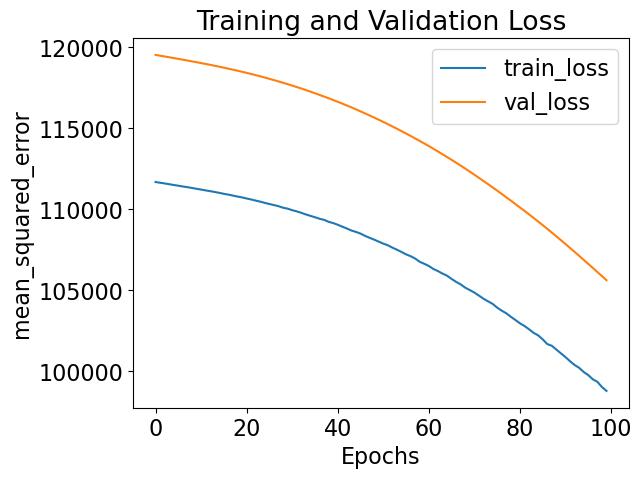

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:45:49,777] Trial 0 finished with value: 105629.015625 and parameters: {'batch_size': 64, 'learning_rate': 0.0002762329384759057, 'n_layers': 1, 'n_units_l0': 187, 'dropout_l0': 0.17061420079726564}. Best is trial 0 with value: 105629.015625.


Block: verbose not specified in input, defaulting to 1


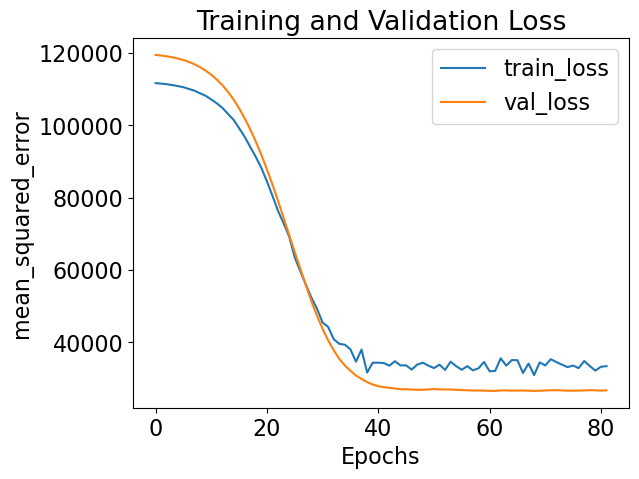

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:46:13,440] Trial 1 finished with value: 26722.48046875 and parameters: {'batch_size': 44, 'learning_rate': 9.634941223952558e-05, 'n_layers': 3, 'n_units_l0': 400, 'dropout_l0': 0.4315531946217694, 'n_units_l1': 504, 'dropout_l1': 0.07282317096596436, 'n_units_l2': 22, 'dropout_l2': 0.3650594093545203}. Best is trial 1 with value: 26722.48046875.


Block: verbose not specified in input, defaulting to 1


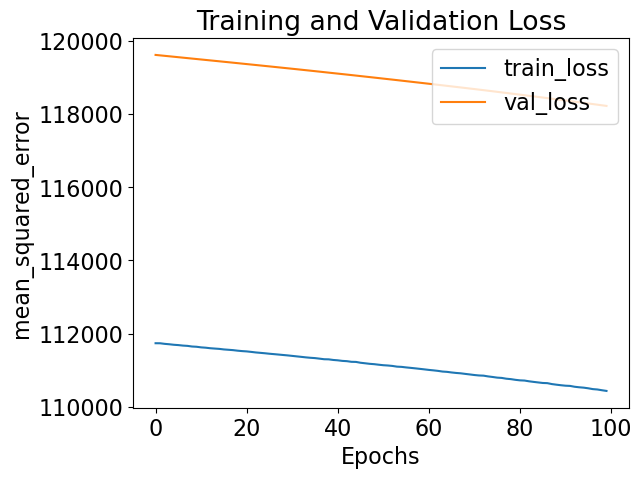

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:46:30,795] Trial 2 finished with value: 118224.796875 and parameters: {'batch_size': 86, 'learning_rate': 0.00014611864500944515, 'n_layers': 1, 'n_units_l0': 61, 'dropout_l0': 0.058491977204341516}. Best is trial 1 with value: 26722.48046875.


Block: verbose not specified in input, defaulting to 1


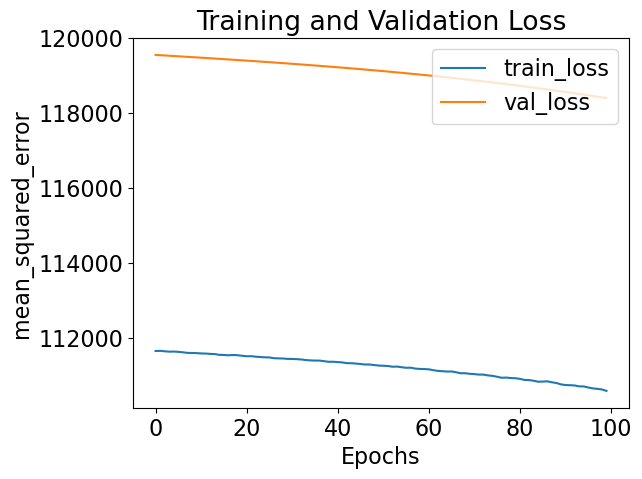

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:46:52,490] Trial 3 finished with value: 118401.4375 and parameters: {'batch_size': 111, 'learning_rate': 4.654194535090523e-05, 'n_layers': 2, 'n_units_l0': 82, 'dropout_l0': 0.4411597054682919, 'n_units_l1': 61, 'dropout_l1': 0.04740690147429999}. Best is trial 1 with value: 26722.48046875.


Block: verbose not specified in input, defaulting to 1


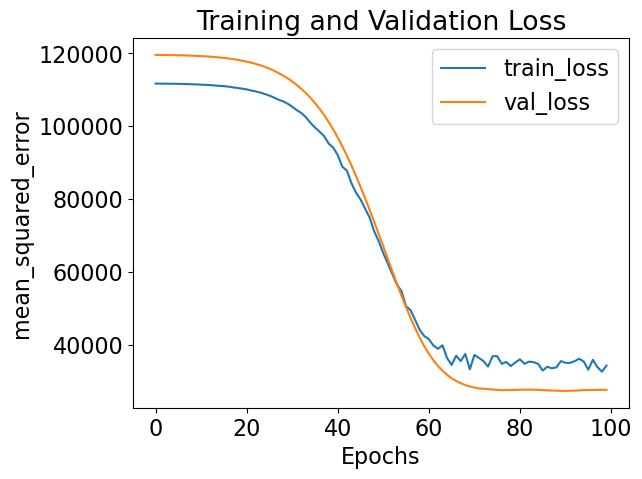

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:47:15,757] Trial 4 finished with value: 27627.119140625 and parameters: {'batch_size': 118, 'learning_rate': 0.00029263448307925943, 'n_layers': 3, 'n_units_l0': 327, 'dropout_l0': 0.29268762009596155, 'n_units_l1': 6, 'dropout_l1': 0.31932245889729705, 'n_units_l2': 182, 'dropout_l2': 0.39070468394392244}. Best is trial 1 with value: 26722.48046875.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:47:18,501] Trial 5 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


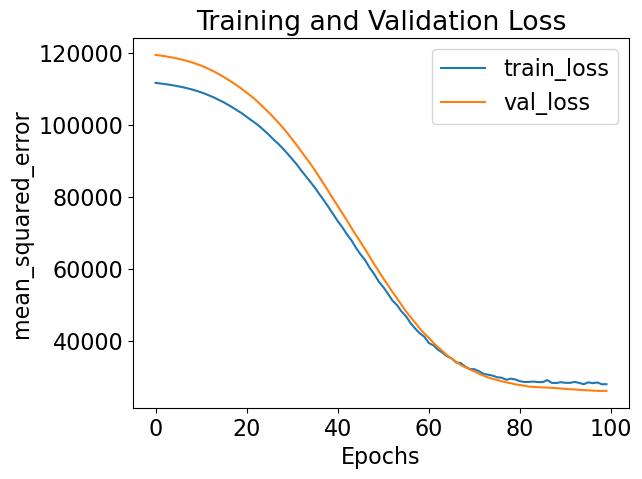

23/23 [==============================] - 0s 5ms/step


[I 2024-11-01 10:47:42,306] Trial 6 finished with value: 26113.6953125 and parameters: {'batch_size': 45, 'learning_rate': 0.0001045626821753261, 'n_layers': 2, 'n_units_l0': 419, 'dropout_l0': 0.09459523517457402, 'n_units_l1': 270, 'dropout_l1': 0.3248988229347715}. Best is trial 6 with value: 26113.6953125.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:47:45,522] Trial 7 pruned. Trial was pruned at epoch 1.


Block: verbose not specified in input, defaulting to 1


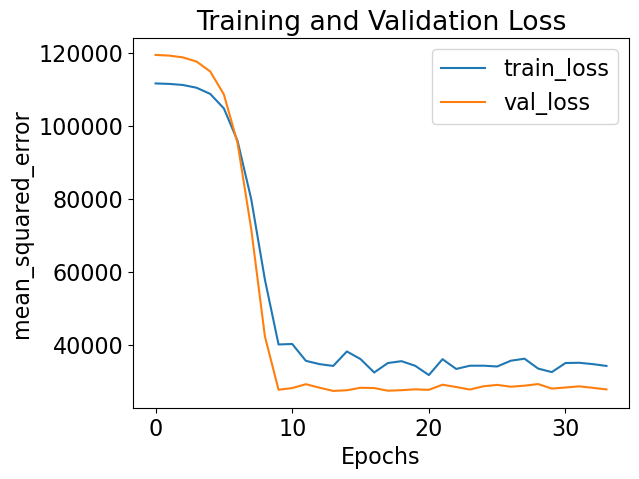

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:47:51,989] Trial 8 finished with value: 27860.46484375 and parameters: {'batch_size': 41, 'learning_rate': 0.0008851409066508934, 'n_layers': 4, 'n_units_l0': 201, 'dropout_l0': 0.4556066254070166, 'n_units_l1': 12, 'dropout_l1': 0.3970683946068236, 'n_units_l2': 28, 'dropout_l2': 0.14829895617409622, 'n_units_l3': 37, 'dropout_l3': 0.17406830937978246}. Best is trial 6 with value: 26113.6953125.


Block: verbose not specified in input, defaulting to 1


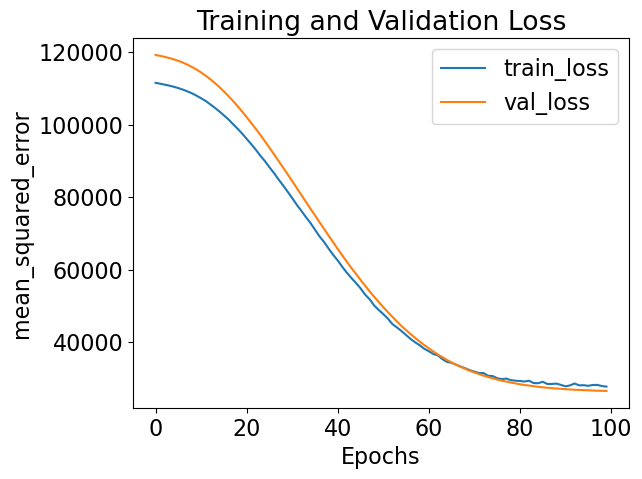

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:48:17,301] Trial 9 finished with value: 26473.115234375 and parameters: {'batch_size': 31, 'learning_rate': 0.0007270206835627192, 'n_layers': 1, 'n_units_l0': 207, 'dropout_l0': 0.20435269771425063}. Best is trial 6 with value: 26113.6953125.


In [41]:
study = optuna.create_study(direction="minimize", pruner=optuna.pruners.MedianPruner())
study.optimize(objective, n_trials=10)

In [42]:
pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])
print("Study statistics: ")
print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

Study statistics: 
  Number of finished trials:  10
  Number of pruned trials:  2
  Number of complete trials:  8
Best trial:
  Value:  26113.6953125
  Params: 
    batch_size: 45
    learning_rate: 0.0001045626821753261
    n_layers: 2
    n_units_l0: 419
    dropout_l0: 0.09459523517457402
    n_units_l1: 270
    dropout_l1: 0.3248988229347715


## Two cluster

All results from this run will be saved to demo_results\experiment0065
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


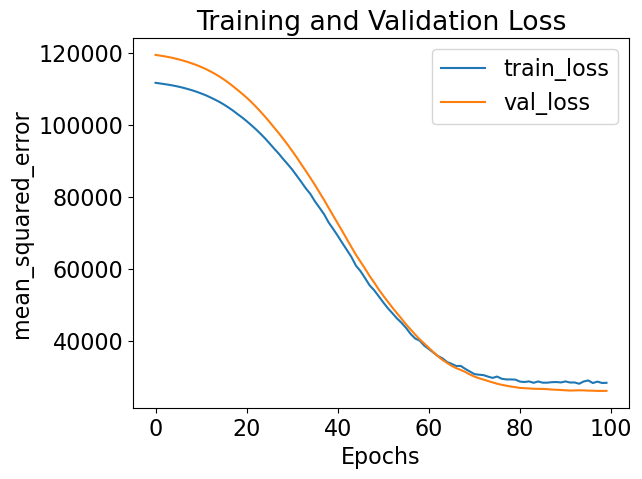

23/23 [==============================] - 0s 2ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...
CauseClusterer training complete.
Experiment training complete.


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [45]:
# so our optimized model becomes:

def build_optimized_model():

    # vary number of layers
    n_layers = study.best_trial.params['n_layers']
    model = Sequential()
    for i in range(n_layers):
        # vary size of each layer
        num_hidden = study.best_trial.params[f'n_units_l{i}']
        model.add(Dense(num_hidden, activation="relu"))

        # vary amount of dropout for each layer
        dropout = study.best_trial.params[f'dropout_l{i}']
        model.add(Dropout(rate=dropout))

    # add output layer with size of target
    model.add(Dense(Y.shape[1], activation="linear"))
    return model

data_info = {'X_dims': X.shape, 'Y_dims': Y.shape, 'Y_type': 'categorical'}

CDE_params = {
    'model'        : 'CondExpDIY',
    'model_params' : {
        'build_network'   : build_optimized_model,
        'batch_size'      : study.best_trial.params['batch_size'],
        'n_epochs'        : 100,
        'optimizer'       : 'adam',
        'opt_config'      : {'learning_rate' : study.best_trial.params['learning_rate']},
        'loss'            : 'mean_squared_error',
        'best'            : True,
        'verbose'         : 0,
        'early_stopping'  : True
    }
}

cause_cluster_params =  {'model' : 'KMeans', 'model_params' : {'n_clusters' : 2},
        'verbose' : 0}
# effect_cluster_params = {'model' : 'KMeans', 'model_params' : {'n_clusters' : 3},
#     'verbose' : 0}

block_names = ['CondDensityEstimator', 'CauseClusterer']
block_params = [CDE_params, cause_cluster_params]

my_exp = Experiment(X_train=X, Y_train=Y, data_info=data_info,
                    in_sample_idx=in_sample_idx, out_sample_idx=out_sample_idx,
                    block_names=block_names, block_params=block_params,
                    results_path='demo_results')

train_results = my_exp.train()

import pandas as pd
data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']

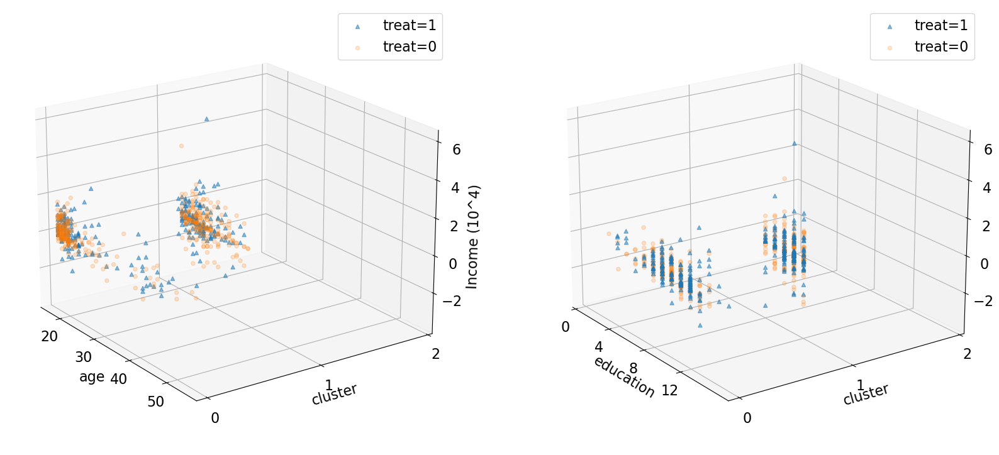

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator

data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']

fig = plt.figure(figsize=(20,40))

ax = fig.add_subplot(3, 2, 1,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['age'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['age'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
# Set y-axis to multiples of 10
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
# ax.scatter(data_cluster['age'],data_cluster['cluster'], data_cluster['rediff'],  c = data_cluster['treat'])
ax.set_yticks([0,1,2])
ax.set_xticks(range(20,60,10))
ax.set_xlabel('age')
ax.set_ylabel('cluster')
ax.set_zlabel('Income (10^4)')
ax.view_init(elev=20, azim=-35)
ax.legend()

ax = fig.add_subplot(3, 2, 2,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['education'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['education'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
ax.set_yticks([0,1,2])
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
ax.set_xlabel('education')
ax.set_ylabel('cluster')
ax.set_zlabel('Income')
ax.set_xticks(range(0,16,4))
ax.view_init(elev=20, azim=-35)
ax.legend()
plt.show()

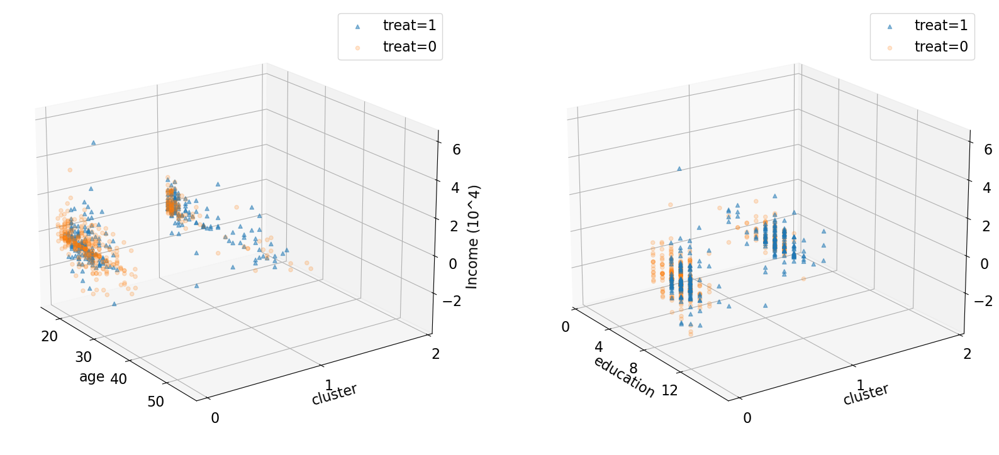

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator

data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']

fig = plt.figure(figsize=(20,40))

ax = fig.add_subplot(3, 2, 1,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['age'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['age'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
# Set y-axis to multiples of 10
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
# ax.scatter(data_cluster['age'],data_cluster['cluster'], data_cluster['rediff'],  c = data_cluster['treat'])
ax.set_yticks([0,1,2])
ax.set_xticks(range(20,60,10))
ax.set_xlabel('age')
ax.set_ylabel('cluster')
ax.set_zlabel('Income (10^4)')
ax.view_init(elev=20, azim=-35)
ax.legend()

ax = fig.add_subplot(3, 2, 2,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['education'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['education'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
ax.set_yticks([0,1,2])
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
ax.set_xlabel('education')
ax.set_ylabel('cluster')
ax.set_zlabel('Income')
ax.set_xticks(range(0,16,4))
ax.view_init(elev=20, azim=-35)
ax.legend()

# ax = fig.add_subplot(3,2,3)
# sns.violinplot(x='cluster', y='rediff', data=data_cluster, ax=ax)
# # yposlist = data_cluster.groupby(['cluster'])['rediff'].median().tolist()
# # xposlist = range(len(yposlist))
# # stringlist = ['n = 62','n = 19','n = 87','n = 76']
# # for i in range(len(stringlist)):
# #     ax.text(xposlist[i], yposlist[i], stringlist[i])
# ax.set_ylim(-25000, 30000)

# ax = fig.add_subplot(3,2,4)
# sns.violinplot(x='cluster', y='age', data=data_cluster, ax=ax)
# # yposlist = data_cluster.groupby(['cluster'])['age'].median().tolist()
# # xposlist = range(len(yposlist))
# # stringlist = ['n = 62','n = 19','n = 87','n = 76']
# # for i in range(len(stringlist)):
# #     ax.text(xposlist[i], yposlist[i], stringlist[i])

# ax = fig.add_subplot(3,2,5)
# sns.violinplot(x='cluster', y='education', data=data_cluster, ax=ax)
# # yposlist = data_cluster.groupby(['cluster'])['education'].median().tolist()
# # xposlist = range(len(yposlist))
# # stringlist = ['n = 62','n = 19','n = 87','n = 76']
# # for i in range(len(stringlist)):
# #     ax.text(xposlist[i], yposlist[i], stringlist[i])

# ax = fig.add_subplot(3,2,6)
# sns.violinplot(x='cluster', y='treat', data=data_cluster, ax=ax)


plt.show()


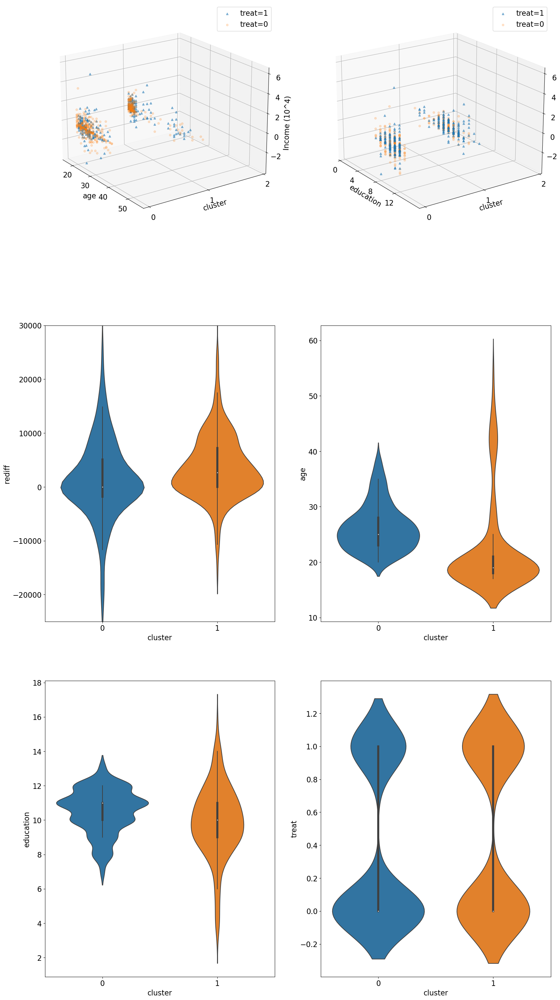

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator

data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']

fig = plt.figure(figsize=(20,40))

ax = fig.add_subplot(3, 2, 1,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['age'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['age'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
# Set y-axis to multiples of 10
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
# ax.scatter(data_cluster['age'],data_cluster['cluster'], data_cluster['rediff'],  c = data_cluster['treat'])
ax.set_yticks([0,1,2])
ax.set_xticks(range(20,60,10))
ax.set_xlabel('age')
ax.set_ylabel('cluster')
ax.set_zlabel('Income (10^4)')
ax.view_init(elev=20, azim=-35)
ax.legend()

ax = fig.add_subplot(3, 2, 2,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['education'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['education'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
ax.set_yticks([0,1,2])
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
ax.set_xlabel('education')
ax.set_ylabel('cluster')
ax.set_zlabel('Income')
ax.set_xticks(range(0,16,4))
ax.view_init(elev=20, azim=-35)
ax.legend()

ax = fig.add_subplot(3,2,3)
sns.violinplot(x='cluster', y='rediff', data=data_cluster, ax=ax)
# yposlist = data_cluster.groupby(['cluster'])['rediff'].median().tolist()
# xposlist = range(len(yposlist))
# stringlist = ['n = 62','n = 19','n = 87','n = 76']
# for i in range(len(stringlist)):
#     ax.text(xposlist[i], yposlist[i], stringlist[i])
ax.set_ylim(-25000, 30000)

ax = fig.add_subplot(3,2,4)
sns.violinplot(x='cluster', y='age', data=data_cluster, ax=ax)
# yposlist = data_cluster.groupby(['cluster'])['age'].median().tolist()
# xposlist = range(len(yposlist))
# stringlist = ['n = 62','n = 19','n = 87','n = 76']
# for i in range(len(stringlist)):
#     ax.text(xposlist[i], yposlist[i], stringlist[i])

ax = fig.add_subplot(3,2,5)
sns.violinplot(x='cluster', y='education', data=data_cluster, ax=ax)
# yposlist = data_cluster.groupby(['cluster'])['education'].median().tolist()
# xposlist = range(len(yposlist))
# stringlist = ['n = 62','n = 19','n = 87','n = 76']
# for i in range(len(stringlist)):
#     ax.text(xposlist[i], yposlist[i], stringlist[i])

ax = fig.add_subplot(3,2,6)
sns.violinplot(x='cluster', y='treat', data=data_cluster, ax=ax)


plt.show()


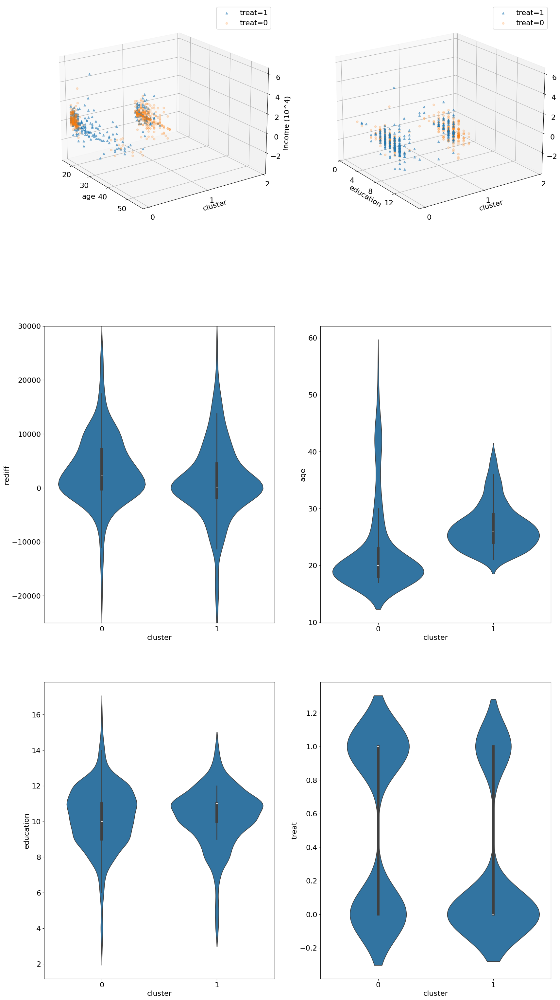

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator

data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']

fig = plt.figure(figsize=(20,40))

ax = fig.add_subplot(3, 2, 1,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['age'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['age'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
# Set y-axis to multiples of 10
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
# ax.scatter(data_cluster['age'],data_cluster['cluster'], data_cluster['rediff'],  c = data_cluster['treat'])
ax.set_yticks([0,1,2])
ax.set_xticks(range(20,60,10))
ax.set_xlabel('age')
ax.set_ylabel('cluster')
ax.set_zlabel('Income (10^4)')
ax.view_init(elev=20, azim=-35)
ax.legend()

ax = fig.add_subplot(3, 2, 2,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['education'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['education'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
ax.set_yticks([0,1,2])
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
ax.set_xlabel('education')
ax.set_ylabel('cluster')
ax.set_zlabel('Income')
ax.set_xticks(range(0,16,4))
ax.view_init(elev=20, azim=-35)
ax.legend()

ax = fig.add_subplot(3,2,3)
sns.violinplot(x='cluster', y='rediff', data=data_cluster, ax=ax)
# yposlist = data_cluster.groupby(['cluster'])['rediff'].median().tolist()
# xposlist = range(len(yposlist))
# stringlist = ['n = 62','n = 19','n = 87','n = 76']
# for i in range(len(stringlist)):
#     ax.text(xposlist[i], yposlist[i], stringlist[i])
ax.set_ylim(-25000, 30000)

ax = fig.add_subplot(3,2,4)
sns.violinplot(x='cluster', y='age', data=data_cluster, ax=ax)
# yposlist = data_cluster.groupby(['cluster'])['age'].median().tolist()
# xposlist = range(len(yposlist))
# stringlist = ['n = 62','n = 19','n = 87','n = 76']
# for i in range(len(stringlist)):
#     ax.text(xposlist[i], yposlist[i], stringlist[i])

ax = fig.add_subplot(3,2,5)
sns.violinplot(x='cluster', y='education', data=data_cluster, ax=ax)
# yposlist = data_cluster.groupby(['cluster'])['education'].median().tolist()
# xposlist = range(len(yposlist))
# stringlist = ['n = 62','n = 19','n = 87','n = 76']
# for i in range(len(stringlist)):
#     ax.text(xposlist[i], yposlist[i], stringlist[i])

ax = fig.add_subplot(3,2,6)
sns.violinplot(x='cluster', y='treat', data=data_cluster, ax=ax)


plt.show()


In [ ]:
%ls

demo_results/  nsw.dta  sample_data/


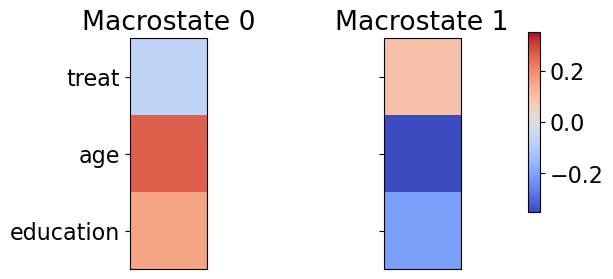

In [17]:
# visualize cause side macrostates
from cfl.visualization.basic_visualizations import visualize_macrostates
visualize_macrostates(  data=X, # data to visualize
                        feature_names=column, # names of the features
                        cause_or_effect='cause',
                        exp_path='demo_results/experiment0017', # where was the data saved?
                        data_series='dataset_train', # if you've passed multiple datasets through CFL's predict method, you can select which one you want
                        subtract_global_mean=True) # do you want to plot the raw data or relative to the global mean?

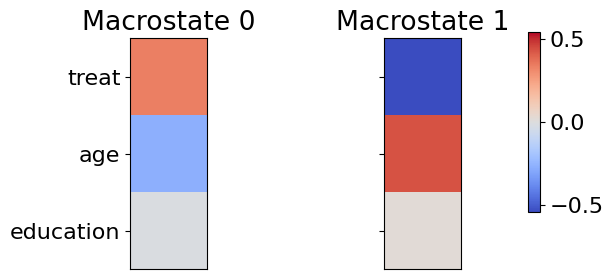

In [ ]:
# visualize cause side macrostates
from cfl.visualization.basic_visualizations import visualize_macrostates
visualize_macrostates(  data=X, # data to visualize
                        feature_names=column, # names of the features
                        cause_or_effect='cause',
                        exp_path='demo_results/experiment0000', # where was the data saved?
                        data_series='dataset_train', # if you've passed multiple datasets through CFL's predict method, you can select which one you want
                        subtract_global_mean=True) # do you want to plot the raw data or relative to the global mean?

In [ ]:
data_cluster.groupby('cluster').mean()

,treat,age,education,black,hispanic,married,nodegree,re75,re78,rediff
cluster,,,,,,,,,,
0,0.577528,22.734831,10.244944,0.777528,0.123596,0.121348,0.775281,2488.098145,5839.782715,3351.684326
1,0.144404,27.389892,10.303249,0.837545,0.075812,0.227437,0.787004,3934.179688,4835.898438,901.719238


In [ ]:
import statsmodels.formula.api as smf
import statsmodels.api as sm

model = smf.ols(formula = 'treat ~ 1 + age + education + black + hispanic + married + nodegree + re75', data = data_cluster).fit()

model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  treat   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.130
Date:                Thu, 26 Sep 2024   Prob (F-statistic):              0.342
Time:                        05:25:12   Log-Likelihood:                -508.52
No. Observations:                 722   AIC:                             1033.
Df Residuals:                     714   BIC:                             1070.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.6041      0.207      2.917      0.004       0.198       1.011
age           -0.0004      0.003     -0.134      0.894      -0.006       0.005
education     -0.0057      0.014     -0.395      0.693      -0.034       0.023
black         -0.0238      0.064     -0.371      0.711      -0.150       0.102
hispanic      -0.0603      0.084     -0.721      0.471      -0.224       0.104
married        0.0223      0.052      0.428      0.669      -0.080       0.125
nodegree      -0.1295      0.059     -2.187      0.029      -0.246      -0.013
re75       -7.539e-07   3.73e-06     -0.202      0.840   -8.09e-06    6.58e-06
==============================================================================
Omnibus:                     3214.404   Durbin-Watson:                   0.025
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              115.692
Skew:                           0.357   Prob(JB):                     7.55e-26
Kurtosis:                       1.174   Cond. No.                     6.89e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.89e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
# smf
import statsmodels.formula.api as smf
import statsmodels.api as sm

data_cluster['age_dummy'] = data_cluster['age'].apply(lambda x: 1 if x > data_cluster['age'].mean() else 0)

model = smf.ols(formula = 'rediff ~ 1 + treat + age_dummy + age_dummy*treat', data = data_cluster).fit()

model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rediff   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     3.216
Date:                Thu, 26 Sep 2024   Prob (F-statistic):             0.0224
Time:                        05:31:38   Log-Likelihood:                -7452.9
No. Observations:                 722   AIC:                         1.491e+04
Df Residuals:                     718   BIC:                         1.493e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept        2790.3659    476.311      5.858      0.000    1855.237    3725.495
treat            -409.6660    742.277     -0.552      0.581   -1866.959    1047.627
age_dummy       -1670.1359    721.937     -2.313      0.021   -3087.495    -252.776
age_dummy:treat  2889.3416   1125.781      2.567      0.010     679.125    5099.558
==============================================================================
Omnibus:                      155.224   Durbin-Watson:                   1.770
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1456.851
Skew:                           0.671   Prob(JB):                         0.00
Kurtosis:                       9.828   Cond. No.                         6.14
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
# smf
import statsmodels.formula.api as smf
import statsmodels.api as sm

data_cluster['educ_dummy'] = data_cluster['education'].apply(lambda x: 1 if x > data_cluster['education'].mean() else 0)

model = smf.ols(formula = 'rediff ~ 1 + treat + educ_dummy + educ_dummy*treat + age', data = data_cluster).fit()

model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 rediff   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     2.012
Date:                Wed, 25 Sep 2024   Prob (F-statistic):             0.0910
Time:                        23:47:03   Log-Likelihood:                -7453.7
No. Observations:                 722   AIC:                         1.492e+04
Df Residuals:                     717   BIC:                         1.494e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept         3294.4386   1105.270      2.981      0.003    1124.487    5464.391
treat             -292.1596    793.878     -0.368      0.713   -1850.763    1266.443
educ_dummy       -1501.3249    722.011     -2.079      0.038   -2918.834     -83.816
educ_dummy:treat  2347.0419   1120.717      2.094      0.037     146.764    4547.320
age                -21.8908     41.770     -0.524      0.600    -103.897      60.115
==============================================================================
Omnibus:                      160.079   Durbin-Watson:                   1.741
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1466.814
Skew:                           0.711   Prob(JB):                         0.00
Kurtosis:                       9.836   Cond. No.                         132.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Three cluster

All results from this run will be saved to demo_results\experiment0018
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


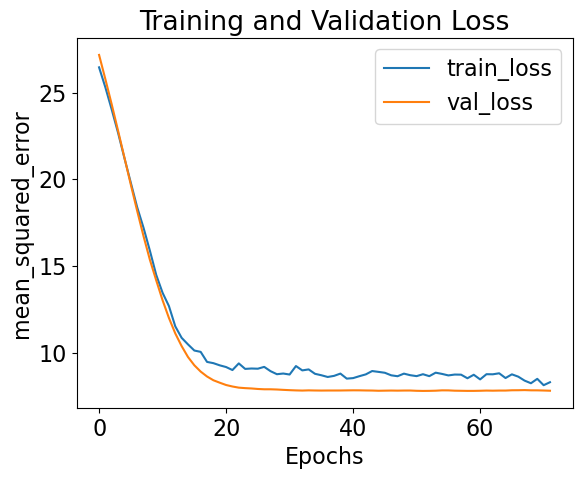

23/23 [==============================] - 0s 3ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...
CauseClusterer training complete.
Experiment training complete.


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [21]:
# so our optimized model becomes:

def build_optimized_model():

    # vary number of layers
    n_layers = study.best_trial.params['n_layers']
    model = Sequential()
    for i in range(n_layers):
        # vary size of each layer
        num_hidden = study.best_trial.params[f'n_units_l{i}']
        model.add(Dense(num_hidden, activation="relu"))

        # vary amount of dropout for each layer
        dropout = study.best_trial.params[f'dropout_l{i}']
        model.add(Dropout(rate=dropout))

    # add output layer with size of target
    model.add(Dense(Y.shape[1], activation="linear"))
    return model

data_info = {'X_dims': X.shape, 'Y_dims': Y.shape, 'Y_type': 'continuous'}

CDE_params = {
    'model'        : 'CondExpDIY',
    'model_params' : {
        'build_network'   : build_optimized_model,
        'batch_size'      : study.best_trial.params['batch_size'],
        'n_epochs'        : 100,
        'optimizer'       : 'adam',
        'opt_config'      : {'learning_rate' : study.best_trial.params['learning_rate']},
        'loss'            : 'mean_squared_error',
        'best'            : True,
        'verbose'         : 0,
        'early_stopping'  : True
    }
}

cause_cluster_params =  {'model' : 'KMeans', 'model_params' : {'n_clusters' : 3},
        'verbose' : 0}
# effect_cluster_params = {'model' : 'KMeans', 'model_params' : {'n_clusters' : 3},
#     'verbose' : 0}

block_names = ['CondDensityEstimator', 'CauseClusterer']
block_params = [CDE_params, cause_cluster_params]

my_exp = Experiment(X_train=X, Y_train=Y, data_info=data_info,
                    in_sample_idx=in_sample_idx, out_sample_idx=out_sample_idx,
                    block_names=block_names, block_params=block_params,
                    results_path='demo_results')

train_results = my_exp.train()

import pandas as pd
data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']

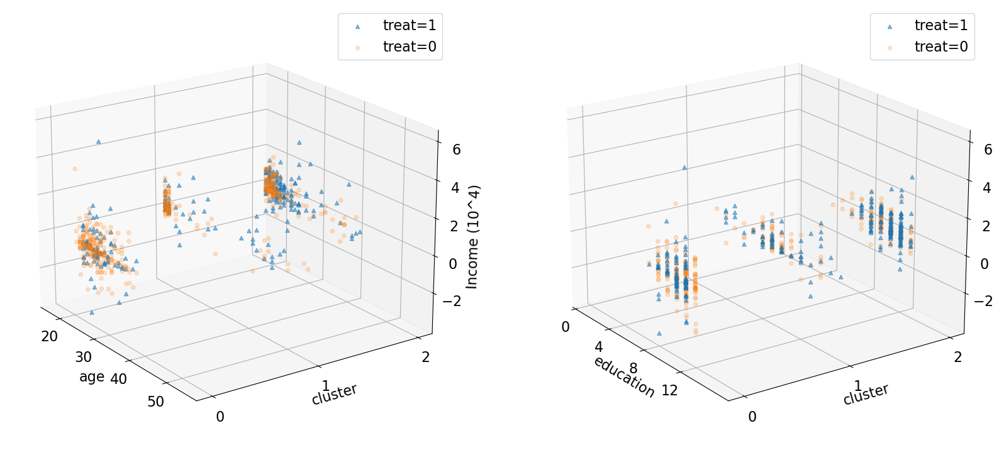

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator

data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']

fig = plt.figure(figsize=(20,40))

ax = fig.add_subplot(3, 2, 1,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['age'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['age'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
# Set y-axis to multiples of 10
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
# ax.scatter(data_cluster['age'],data_cluster['cluster'], data_cluster['rediff'],  c = data_cluster['treat'])
ax.set_yticks([0,1,2])
ax.set_xticks(range(20,60,10))
ax.set_xlabel('age')
ax.set_ylabel('cluster')
ax.set_zlabel('Income (10^4)')
ax.view_init(elev=20, azim=-35)
ax.legend()

ax = fig.add_subplot(3, 2, 2,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['education'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['education'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
ax.set_yticks([0,1,2])
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
ax.set_xlabel('education')
ax.set_ylabel('cluster')
ax.set_zlabel('Income')
ax.set_xticks(range(0,16,4))
ax.view_init(elev=20, azim=-35)
ax.legend()

# ax = fig.add_subplot(3,2,3)
# sns.violinplot(x='cluster', y='rediff', data=data_cluster, ax=ax)
# yposlist = data_cluster.groupby(['cluster'])['rediff'].median().tolist()
# xposlist = range(len(yposlist))
# stringlist = ['n = 62','n = 19','n = 87','n = 76']
# for i in range(len(stringlist)):
#     ax.text(xposlist[i], yposlist[i], stringlist[i])
# ax.set_ylim(-25000, 30000)

# ax = fig.add_subplot(3,2,4)
# sns.violinplot(x='cluster', y='age', data=data_cluster, ax=ax)
# yposlist = data_cluster.groupby(['cluster'])['age'].median().tolist()
# xposlist = range(len(yposlist))
# stringlist = ['n = 62','n = 19','n = 87','n = 76']
# for i in range(len(stringlist)):
#     ax.text(xposlist[i], yposlist[i], stringlist[i])

# ax = fig.add_subplot(3,2,5)
# sns.violinplot(x='cluster', y='education', data=data_cluster, ax=ax)
# yposlist = data_cluster.groupby(['cluster'])['education'].median().tolist()
# xposlist = range(len(yposlist))
# stringlist = ['n = 62','n = 19','n = 87','n = 76']
# for i in range(len(stringlist)):
#     ax.text(xposlist[i], yposlist[i], stringlist[i])

# ax = fig.add_subplot(3,2,6)
# sns.violinplot(x='cluster', y='treat', data=data_cluster, ax=ax)


plt.show()


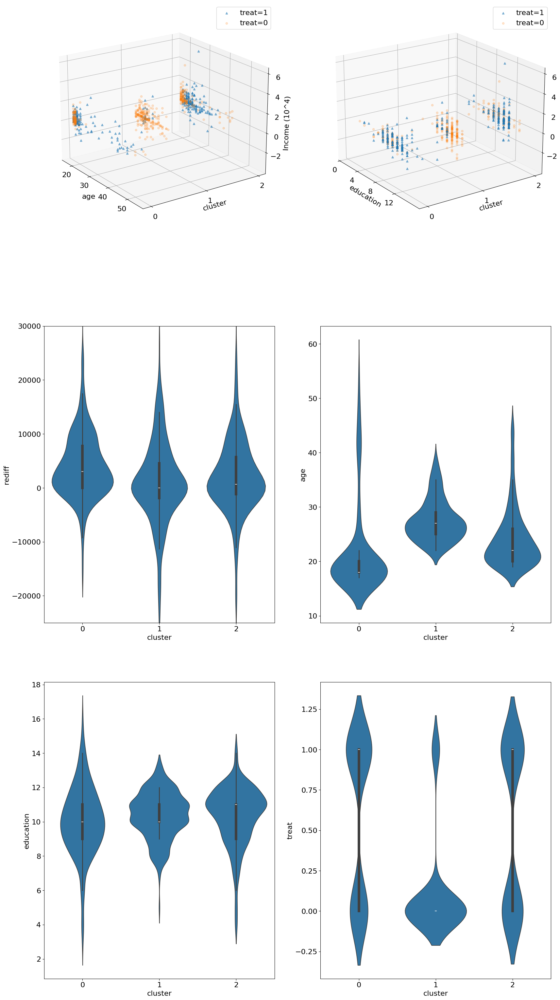

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator

data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']

fig = plt.figure(figsize=(20,40))

ax = fig.add_subplot(3, 2, 1,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['age'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['age'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
# Set y-axis to multiples of 10
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
# ax.scatter(data_cluster['age'],data_cluster['cluster'], data_cluster['rediff'],  c = data_cluster['treat'])
ax.set_yticks([0,1,2])
ax.set_xticks(range(20,60,10))
ax.set_xlabel('age')
ax.set_ylabel('cluster')
ax.set_zlabel('Income (10^4)')
ax.view_init(elev=20, azim=-35)
ax.legend()

ax = fig.add_subplot(3, 2, 2,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['education'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['education'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
ax.set_yticks([0,1,2])
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
ax.set_xlabel('education')
ax.set_ylabel('cluster')
ax.set_zlabel('Income')
ax.set_xticks(range(0,16,4))
ax.view_init(elev=20, azim=-35)
ax.legend()

ax = fig.add_subplot(3,2,3)
sns.violinplot(x='cluster', y='rediff', data=data_cluster, ax=ax)
yposlist = data_cluster.groupby(['cluster'])['rediff'].median().tolist()
xposlist = range(len(yposlist))
stringlist = ['n = 62','n = 19','n = 87','n = 76']
for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])
ax.set_ylim(-25000, 30000)

ax = fig.add_subplot(3,2,4)
sns.violinplot(x='cluster', y='age', data=data_cluster, ax=ax)
yposlist = data_cluster.groupby(['cluster'])['age'].median().tolist()
xposlist = range(len(yposlist))
stringlist = ['n = 62','n = 19','n = 87','n = 76']
for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])

ax = fig.add_subplot(3,2,5)
sns.violinplot(x='cluster', y='education', data=data_cluster, ax=ax)
yposlist = data_cluster.groupby(['cluster'])['education'].median().tolist()
xposlist = range(len(yposlist))
stringlist = ['n = 62','n = 19','n = 87','n = 76']
for i in range(len(stringlist)):
    ax.text(xposlist[i], yposlist[i], stringlist[i])

ax = fig.add_subplot(3,2,6)
sns.violinplot(x='cluster', y='treat', data=data_cluster, ax=ax)


plt.show()


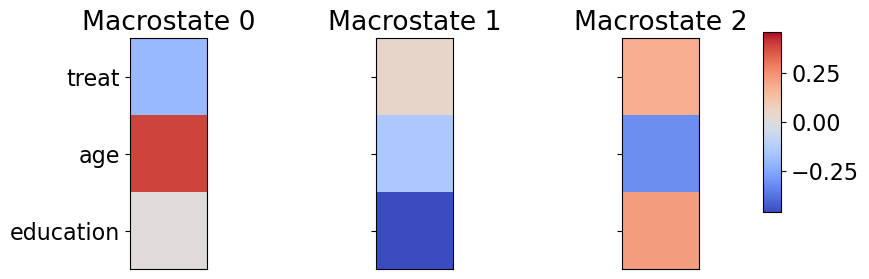

In [22]:
# visualize cause side macrostates
from cfl.visualization.basic_visualizations import visualize_macrostates
visualize_macrostates(  data=X, # data to visualize
                        feature_names=column, # names of the features
                        cause_or_effect='cause',
                        exp_path='demo_results/experiment0018', # where was the data saved?
                        data_series='dataset_train', # if you've passed multiple datasets through CFL's predict method, you can select which one you want
                        subtract_global_mean=True) # do you want to plot the raw data or relative to the global mean?

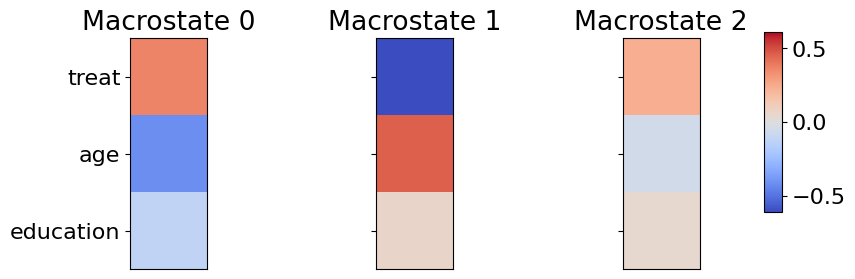

In [ ]:
# visualize cause side macrostates
from cfl.visualization.basic_visualizations import visualize_macrostates
visualize_macrostates(  data=X, # data to visualize
                        feature_names=column, # names of the features
                        cause_or_effect='cause',
                        exp_path='demo_results/experiment0001', # where was the data saved?
                        data_series='dataset_train', # if you've passed multiple datasets through CFL's predict method, you can select which one you want
                        subtract_global_mean=True) # do you want to plot the raw data or relative to the global mean?

In [ ]:
data_cluster.groupby('cluster').mean()

,treat,age,education,black,hispanic,married,nodegree,re75,re78,rediff
cluster,,,,,,,,,,
0,0.590090,21.761261,10.063063,0.752252,0.148649,0.094595,0.783784,1828.236938,5912.570312,4084.333252
1,0.111111,27.542735,10.376068,0.829060,0.076923,0.230769,0.794872,4164.999512,5064.642090,899.642517
2,0.526316,24.165414,10.342105,0.815789,0.093985,0.157895,0.763158,3069.521729,5415.526855,2346.005127


## Four Cluster

All results from this run will be saved to demo_results\experiment0064


Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


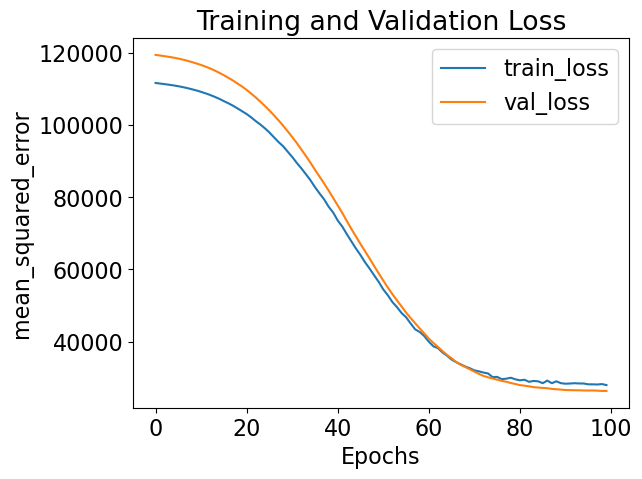

23/23 [==============================] - 0s 4ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...
CauseClusterer training complete.
Experiment training complete.


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [43]:
# so our optimized model becomes:

def build_optimized_model():

    # vary number of layers
    n_layers = study.best_trial.params['n_layers']
    model = Sequential()
    for i in range(n_layers):
        # vary size of each layer
        num_hidden = study.best_trial.params[f'n_units_l{i}']
        model.add(Dense(num_hidden, activation="relu"))

        # vary amount of dropout for each layer
        dropout = study.best_trial.params[f'dropout_l{i}']
        model.add(Dropout(rate=dropout))

    # add output layer with size of target
    model.add(Dense(Y.shape[1], activation="linear"))
    return model

data_info = {'X_dims': X.shape, 'Y_dims': Y.shape, 'Y_type': 'continuous'}

CDE_params = {
    'model'        : 'CondExpDIY',
    'model_params' : {
        'build_network'   : build_optimized_model,
        'batch_size'      : study.best_trial.params['batch_size'],
        'n_epochs'        : 100,
        'optimizer'       : 'adam',
        'opt_config'      : {'learning_rate' : study.best_trial.params['learning_rate']},
        'loss'            : 'mean_squared_error',
        'best'            : True,
        'verbose'         : 0,
        'early_stopping'  : True
    }
}

cause_cluster_params =  {'model' : 'KMeans', 'model_params' : {'n_clusters' : 4},
        'verbose' : 0}
# effect_cluster_params = {'model' : 'KMeans', 'model_params' : {'n_clusters' : 3},
#     'verbose' : 0}

block_names = ['CondDensityEstimator', 'CauseClusterer']
block_params = [CDE_params, cause_cluster_params]

my_exp = Experiment(X_train=X, Y_train=Y, data_info=data_info,
                    in_sample_idx=in_sample_idx, out_sample_idx=out_sample_idx,
                    block_names=block_names, block_params=block_params,
                    results_path='demo_results')

train_results = my_exp.train()

import pandas as pd
data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']

In [44]:
data_cluster.groupby('cluster').mean()

,treat,age,education,black,hispanic,married,nodegree,re75,re78,rediff
cluster,,,,,,,,,,
0,0.310606,26.958333,10.378788,0.859848,0.060606,0.257576,0.897727,3865.531738,5424.250000,1558.718384
1,0.498155,22.560886,10.649446,0.767528,0.118081,0.118081,0.664207,3111.698730,5398.854004,2287.155273
2,0.571429,32.657143,8.142857,0.714286,0.200000,0.228571,0.742857,2047.108032,6377.601562,4330.493652
3,0.394737,21.907895,9.881579,0.776316,0.138158,0.059211,0.789474,1720.735352,5394.338867,3673.603516


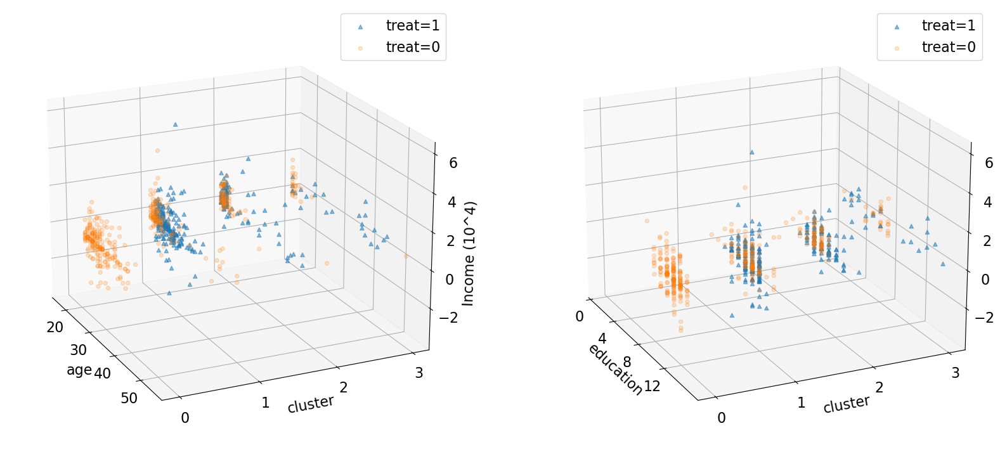

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator

data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']

fig = plt.figure(figsize=(20,40))

ax = fig.add_subplot(3, 2, 1,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['age'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['age'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
# Set y-axis to multiples of 10
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
# ax.scatter(data_cluster['age'],data_cluster['cluster'], data_cluster['rediff'],  c = data_cluster['treat'])
ax.set_yticks([0,1,2,3])
ax.set_xticks(range(20,60,10))
ax.set_xlabel('age')
ax.set_ylabel('cluster')
ax.set_zlabel('Income (10^4)')
ax.view_init(elev=20, azim=-25)
ax.legend()

ax = fig.add_subplot(3, 2, 2,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['education'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['education'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
ax.set_yticks([0,1,2,3])
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
ax.set_xlabel('education')
ax.set_ylabel('cluster')
ax.set_zlabel('Income')
ax.set_xticks(range(0,16,4))
ax.view_init(elev=20, azim=-25)
ax.legend()

# ax = fig.add_subplot(3,2,3)
# sns.violinplot(x='cluster', y='rediff', data=data_cluster, ax=ax)
# ax.set_ylim(-25000, 30000)
# ax = fig.add_subplot(3,2,4)
# sns.violinplot(x='cluster', y='age', data=data_cluster, ax=ax)
# ax = fig.add_subplot(3,2,5)
# sns.violinplot(x='cluster', y='education', data=data_cluster, ax=ax)
# ax = fig.add_subplot(3,2,6)
# sns.violinplot(x='cluster', y='treat', data=data_cluster, ax=ax)


plt.show()


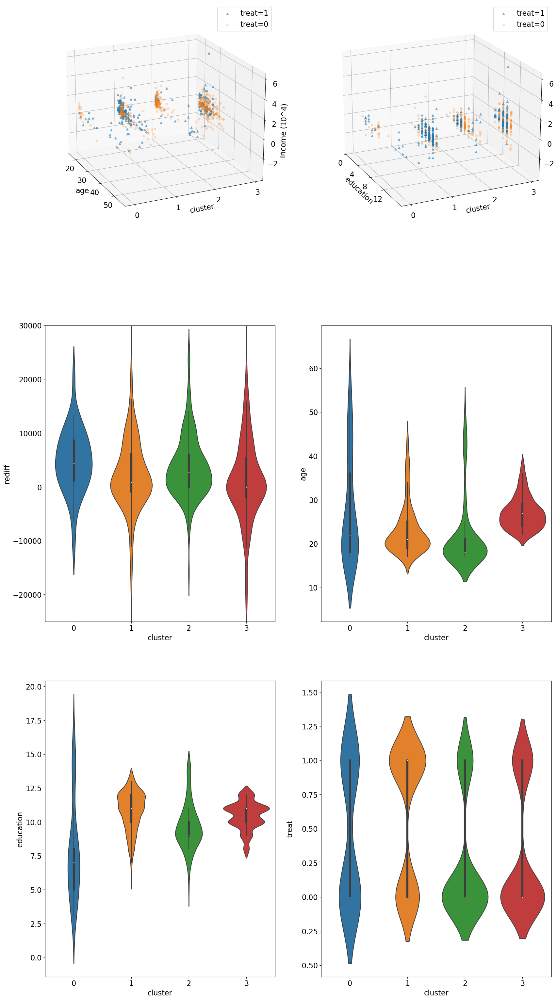

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator

data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']

fig = plt.figure(figsize=(20,40))

ax = fig.add_subplot(3, 2, 1,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['age'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['age'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
# Set y-axis to multiples of 10
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
# ax.scatter(data_cluster['age'],data_cluster['cluster'], data_cluster['rediff'],  c = data_cluster['treat'])
ax.set_yticks([0,1,2,3])
ax.set_xticks(range(20,60,10))
ax.set_xlabel('age')
ax.set_ylabel('cluster')
ax.set_zlabel('Income (10^4)')
ax.view_init(elev=20, azim=-25)
ax.legend()

ax = fig.add_subplot(3, 2, 2,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['education'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['education'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
ax.set_yticks([0,1,2,3])
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
ax.set_xlabel('education')
ax.set_ylabel('cluster')
ax.set_zlabel('Income')
ax.set_xticks(range(0,16,4))
ax.view_init(elev=20, azim=-25)
ax.legend()

ax = fig.add_subplot(3,2,3)
sns.violinplot(x='cluster', y='rediff', data=data_cluster, ax=ax)
ax.set_ylim(-25000, 30000)
ax = fig.add_subplot(3,2,4)
sns.violinplot(x='cluster', y='age', data=data_cluster, ax=ax)
ax = fig.add_subplot(3,2,5)
sns.violinplot(x='cluster', y='education', data=data_cluster, ax=ax)
ax = fig.add_subplot(3,2,6)
sns.violinplot(x='cluster', y='treat', data=data_cluster, ax=ax)


plt.show()


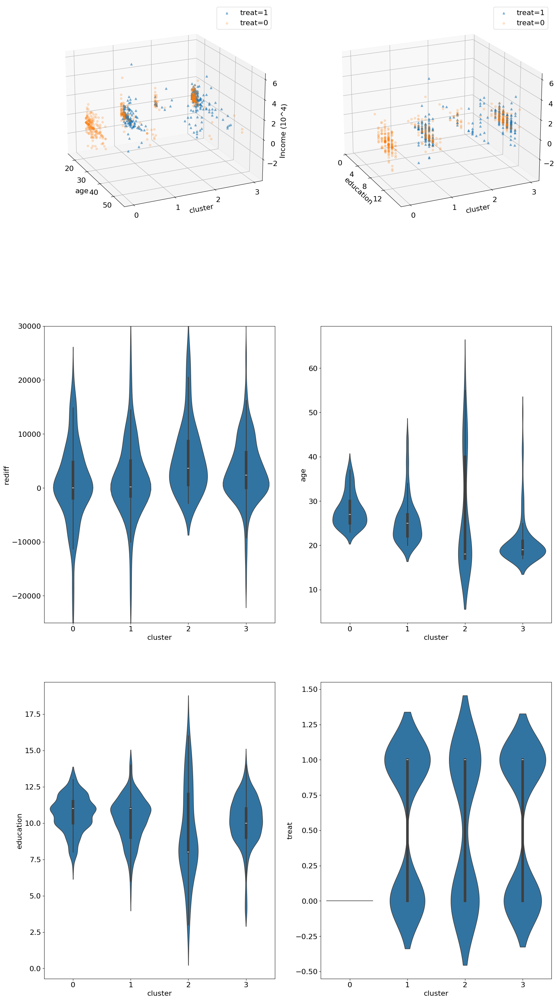

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator

data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']

fig = plt.figure(figsize=(20,40))

ax = fig.add_subplot(3, 2, 1,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['age'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['age'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
# Set y-axis to multiples of 10
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
# ax.scatter(data_cluster['age'],data_cluster['cluster'], data_cluster['rediff'],  c = data_cluster['treat'])
ax.set_yticks([0,1,2,3])
ax.set_xticks(range(20,60,10))
ax.set_xlabel('age')
ax.set_ylabel('cluster')
ax.set_zlabel('Income (10^4)')
ax.view_init(elev=20, azim=-25)
ax.legend()

ax = fig.add_subplot(3, 2, 2,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['education'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['education'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
ax.set_yticks([0,1,2,3])
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
ax.set_xlabel('education')
ax.set_ylabel('cluster')
ax.set_zlabel('Income')
ax.set_xticks(range(0,16,4))
ax.view_init(elev=20, azim=-25)
ax.legend()

ax = fig.add_subplot(3,2,3)
sns.violinplot(x='cluster', y='rediff', data=data_cluster, ax=ax)
ax.set_ylim(-25000, 30000)
ax = fig.add_subplot(3,2,4)
sns.violinplot(x='cluster', y='age', data=data_cluster, ax=ax)
ax = fig.add_subplot(3,2,5)
sns.violinplot(x='cluster', y='education', data=data_cluster, ax=ax)
ax = fig.add_subplot(3,2,6)
sns.violinplot(x='cluster', y='treat', data=data_cluster, ax=ax)


plt.show()


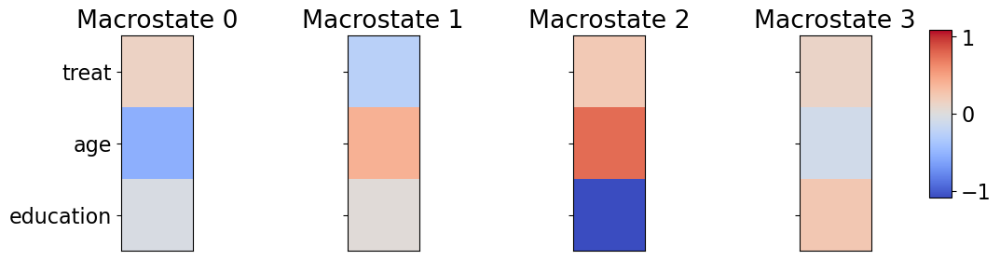

In [26]:
# visualize cause side macrostates
from cfl.visualization.basic_visualizations import visualize_macrostates
visualize_macrostates(  data=X, # data to visualize
                        feature_names=column, # names of the features
                        cause_or_effect='cause',
                        exp_path='demo_results/experiment0019', # where was the data saved?
                        data_series='dataset_train', # if you've passed multiple datasets through CFL's predict method, you can select which one you want
                        subtract_global_mean=True) # do you want to plot the raw data or relative to the global mean?

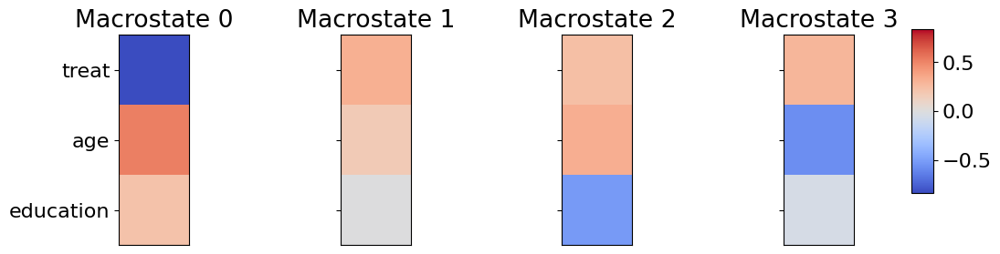

In [ ]:
# visualize cause side macrostates
from cfl.visualization.basic_visualizations import visualize_macrostates
visualize_macrostates(  data=X, # data to visualize
                        feature_names=column, # names of the features
                        cause_or_effect='cause',
                        exp_path='demo_results/experiment0002', # where was the data saved?
                        data_series='dataset_train', # if you've passed multiple datasets through CFL's predict method, you can select which one you want
                        subtract_global_mean=True) # do you want to plot the raw data or relative to the global mean?

# Binning Analysis

In [3]:
import numpy as np
import pandas as pd

# read stata file
data = pd.read_stata('nsw.dta')
data = data.drop(columns=['data_id'])

[I 2024-11-01 10:04:50,783] A new study created in memory with name: no-name-cd8f4f4e-af30-441d-88a9-571ad7ed8f1a


Block: verbose not specified in input, defaulting to 1


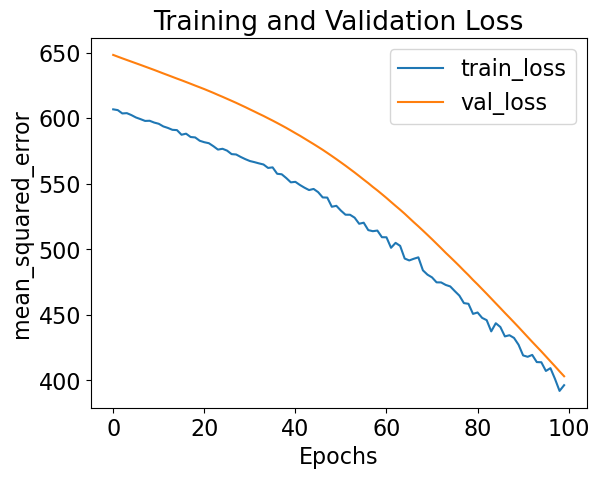

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:05:12,226] Trial 0 finished with value: 403.1592712402344 and parameters: {'batch_size': 31, 'learning_rate': 9.828924205895154e-05, 'n_layers': 2, 'n_units_l0': 9, 'dropout_l0': 0.4140956645902272, 'n_units_l1': 34, 'dropout_l1': 0.37538265242433705}. Best is trial 0 with value: 403.1592712402344.


Block: verbose not specified in input, defaulting to 1


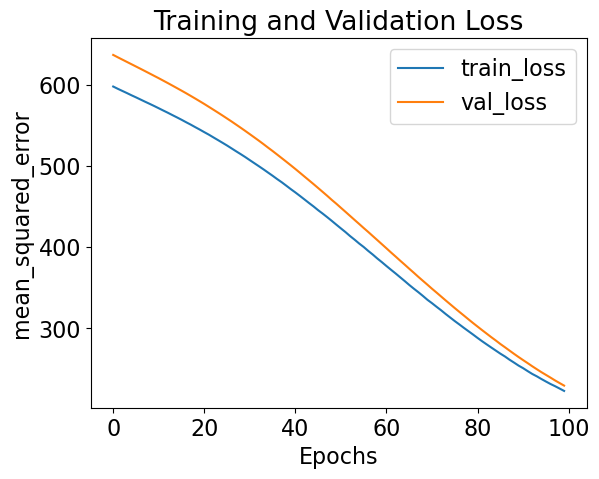

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:05:30,594] Trial 1 finished with value: 229.32553100585938 and parameters: {'batch_size': 31, 'learning_rate': 9.661786051760184e-05, 'n_layers': 1, 'n_units_l0': 292, 'dropout_l0': 0.008882831582204764}. Best is trial 1 with value: 229.32553100585938.


Block: verbose not specified in input, defaulting to 1


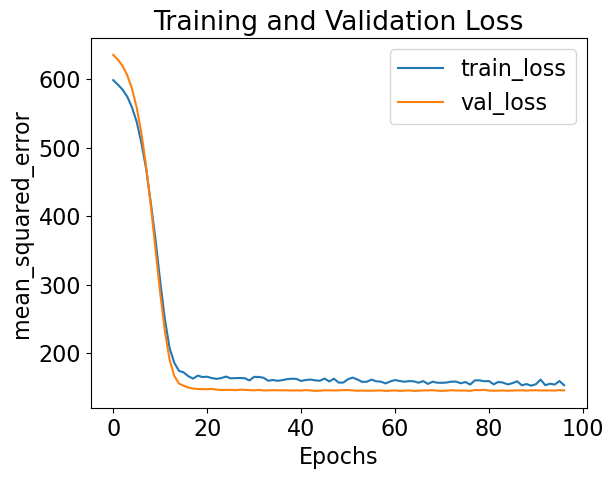

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:05:44,863] Trial 2 finished with value: 145.5599822998047 and parameters: {'batch_size': 40, 'learning_rate': 0.00010099928296082678, 'n_layers': 3, 'n_units_l0': 459, 'dropout_l0': 0.3453945691087387, 'n_units_l1': 104, 'dropout_l1': 0.13779504507826168, 'n_units_l2': 249, 'dropout_l2': 0.21700542122937116}. Best is trial 2 with value: 145.5599822998047.


Block: verbose not specified in input, defaulting to 1


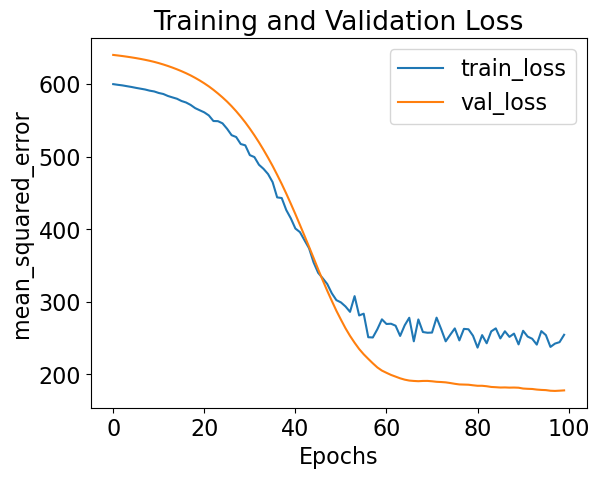

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:06:01,463] Trial 3 finished with value: 178.0359649658203 and parameters: {'batch_size': 123, 'learning_rate': 8.550984152135314e-05, 'n_layers': 4, 'n_units_l0': 136, 'dropout_l0': 0.29061718260181146, 'n_units_l1': 27, 'dropout_l1': 0.44404225370731026, 'n_units_l2': 500, 'dropout_l2': 0.16311971604657327, 'n_units_l3': 7, 'dropout_l3': 0.38616094769573805}. Best is trial 2 with value: 145.5599822998047.


Block: verbose not specified in input, defaulting to 1


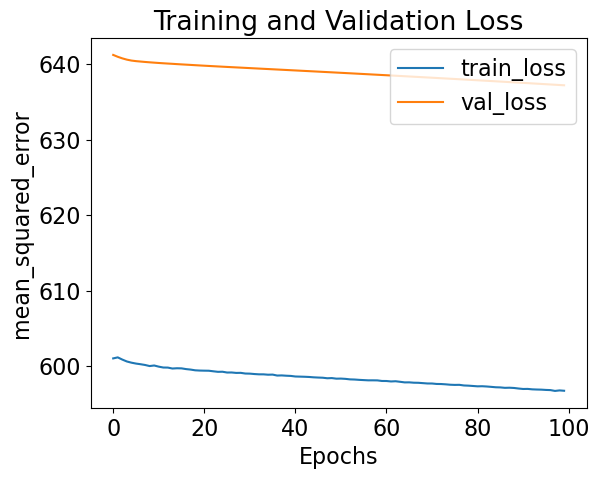

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:06:19,878] Trial 4 finished with value: 637.1812744140625 and parameters: {'batch_size': 73, 'learning_rate': 5.268317668997019e-05, 'n_layers': 5, 'n_units_l0': 325, 'dropout_l0': 0.15312256812556446, 'n_units_l1': 13, 'dropout_l1': 0.11981988696268253, 'n_units_l2': 4, 'dropout_l2': 0.4764234741335508, 'n_units_l3': 4, 'dropout_l3': 0.11433140711873374, 'n_units_l4': 11, 'dropout_l4': 0.3515434974529543}. Best is trial 2 with value: 145.5599822998047.


Block: verbose not specified in input, defaulting to 1


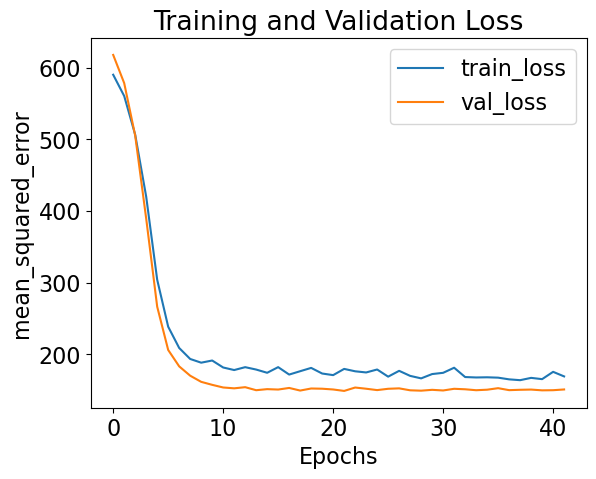

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:06:27,078] Trial 5 finished with value: 151.0842742919922 and parameters: {'batch_size': 37, 'learning_rate': 0.0009816204221604126, 'n_layers': 3, 'n_units_l0': 15, 'dropout_l0': 0.20412348310659806, 'n_units_l1': 19, 'dropout_l1': 0.24375713514465513, 'n_units_l2': 220, 'dropout_l2': 0.4243445399942824}. Best is trial 2 with value: 145.5599822998047.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:06:28,765] Trial 6 pruned. Trial was pruned at epoch 1.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:06:32,030] Trial 7 pruned. Trial was pruned at epoch 5.


Block: verbose not specified in input, defaulting to 1


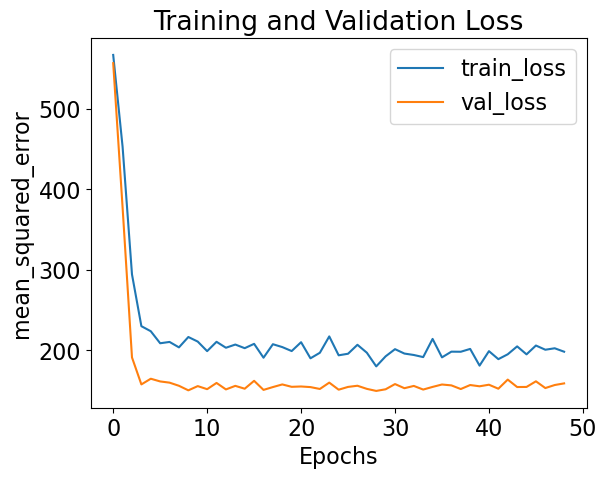

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:06:55,058] Trial 8 finished with value: 158.91131591796875 and parameters: {'batch_size': 21, 'learning_rate': 0.0007279572428623605, 'n_layers': 3, 'n_units_l0': 259, 'dropout_l0': 0.07716010747999363, 'n_units_l1': 105, 'dropout_l1': 0.03395523936347061, 'n_units_l2': 6, 'dropout_l2': 0.3070823386689971}. Best is trial 2 with value: 145.5599822998047.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:07:04,238] Trial 9 pruned. Trial was pruned at epoch 1.


All results from this run will be saved to demo_results\experiment0053
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


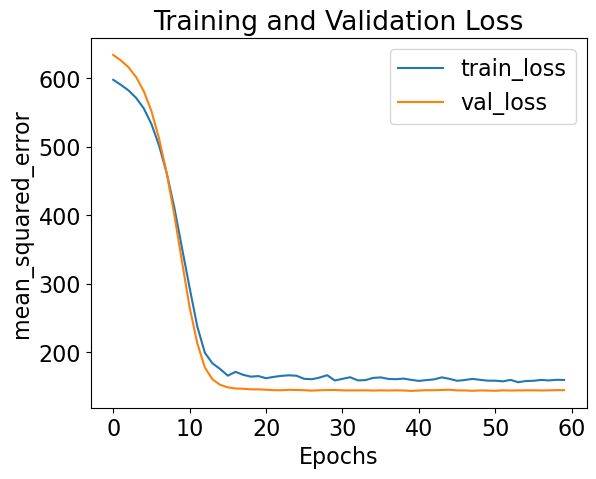

23/23 [==============================] - 0s 5ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-01 10:07:22,479] A new study created in memory with name: no-name-128d20df-6b24-429b-8c11-b6fdd4ad8c42


CauseClusterer training complete.
Experiment training complete.
50
Block: verbose not specified in input, defaulting to 1


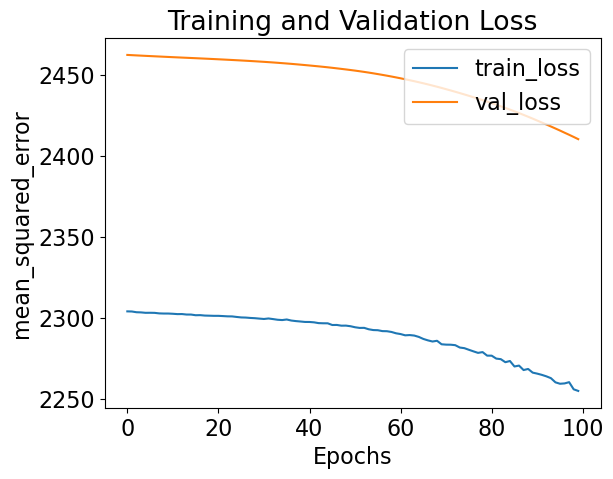

23/23 [==============================] - 0s 5ms/step


[I 2024-11-01 10:07:53,382] Trial 0 finished with value: 2410.340087890625 and parameters: {'batch_size': 80, 'learning_rate': 1.6626420327341624e-05, 'n_layers': 5, 'n_units_l0': 45, 'dropout_l0': 0.1070044736430214, 'n_units_l1': 141, 'dropout_l1': 0.1857335857092805, 'n_units_l2': 4, 'dropout_l2': 0.04673778721927291, 'n_units_l3': 10, 'dropout_l3': 0.3653035731016439, 'n_units_l4': 141, 'dropout_l4': 0.3342602269270426}. Best is trial 0 with value: 2410.340087890625.


Block: verbose not specified in input, defaulting to 1


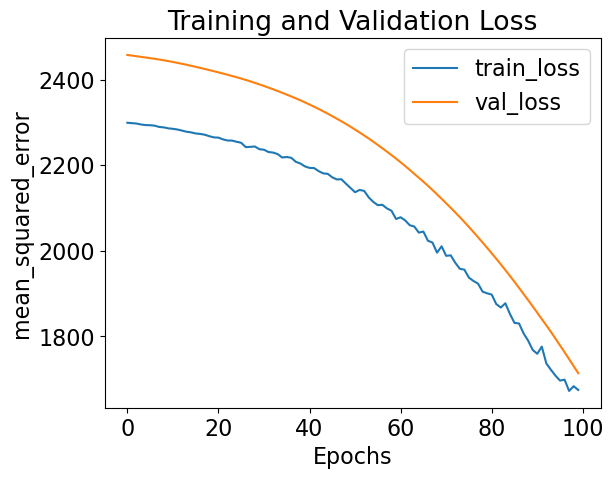

23/23 [==============================] - 0s 5ms/step


[I 2024-11-01 10:08:24,629] Trial 1 finished with value: 1714.0445556640625 and parameters: {'batch_size': 128, 'learning_rate': 3.0271704249956534e-05, 'n_layers': 4, 'n_units_l0': 495, 'dropout_l0': 0.23674483463799156, 'n_units_l1': 289, 'dropout_l1': 0.2567958837690048, 'n_units_l2': 22, 'dropout_l2': 0.2755627164269378, 'n_units_l3': 21, 'dropout_l3': 0.4564720140648028}. Best is trial 1 with value: 1714.0445556640625.


Block: verbose not specified in input, defaulting to 1


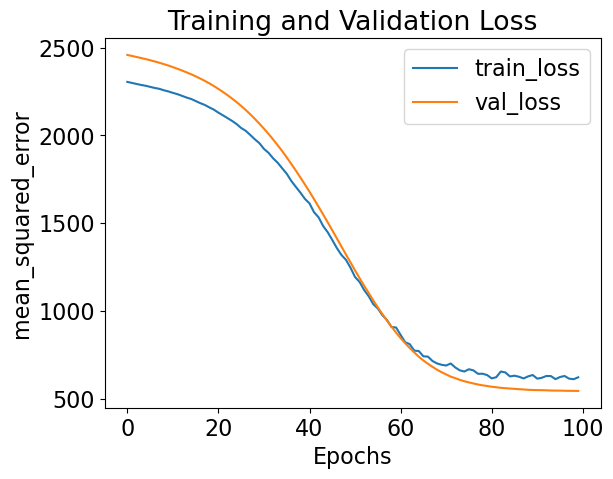

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:09:01,295] Trial 2 finished with value: 545.359619140625 and parameters: {'batch_size': 31, 'learning_rate': 7.186136961991085e-05, 'n_layers': 3, 'n_units_l0': 55, 'dropout_l0': 0.11005477824484244, 'n_units_l1': 47, 'dropout_l1': 0.15615648833045315, 'n_units_l2': 19, 'dropout_l2': 0.047812827117044765}. Best is trial 2 with value: 545.359619140625.


Block: verbose not specified in input, defaulting to 1


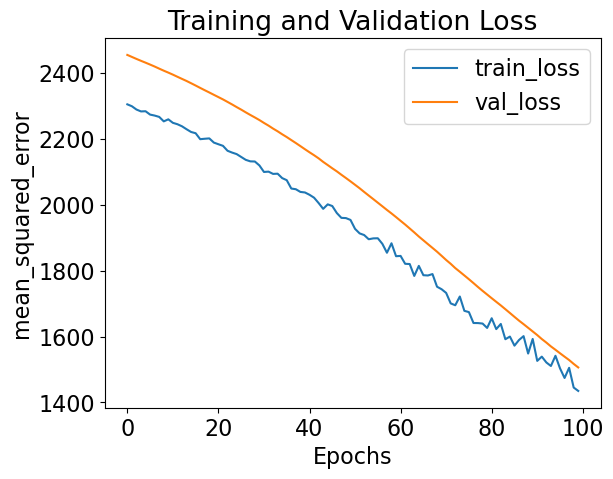

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:09:35,882] Trial 3 finished with value: 1506.117431640625 and parameters: {'batch_size': 18, 'learning_rate': 0.00045284360524645937, 'n_layers': 1, 'n_units_l0': 6, 'dropout_l0': 0.4542579759979044}. Best is trial 2 with value: 545.359619140625.


Block: verbose not specified in input, defaulting to 1


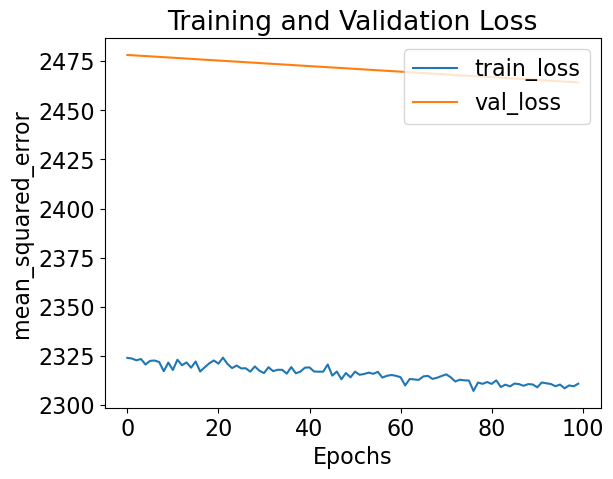

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:09:58,149] Trial 4 finished with value: 2464.230712890625 and parameters: {'batch_size': 106, 'learning_rate': 5.0869781156873294e-05, 'n_layers': 1, 'n_units_l0': 6, 'dropout_l0': 0.17786729582948219}. Best is trial 2 with value: 545.359619140625.


Block: verbose not specified in input, defaulting to 1


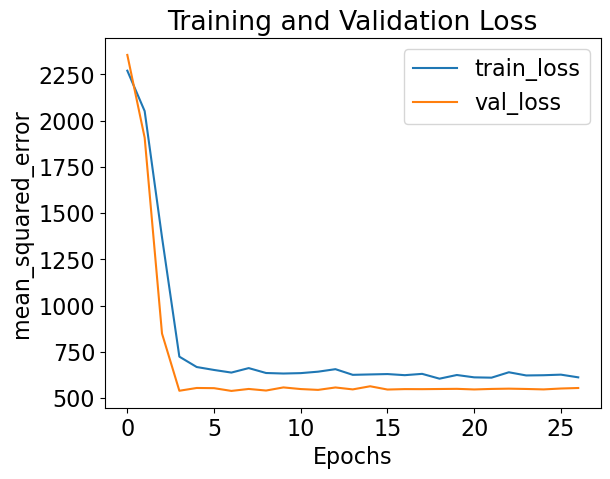

23/23 [==============================] - 0s 5ms/step


[I 2024-11-01 10:10:07,740] Trial 5 finished with value: 555.5579833984375 and parameters: {'batch_size': 25, 'learning_rate': 0.0007569980076443684, 'n_layers': 3, 'n_units_l0': 127, 'dropout_l0': 0.11448081880385436, 'n_units_l1': 59, 'dropout_l1': 0.3659617227331186, 'n_units_l2': 163, 'dropout_l2': 0.3800049725639451}. Best is trial 2 with value: 545.359619140625.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:10:10,694] Trial 6 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


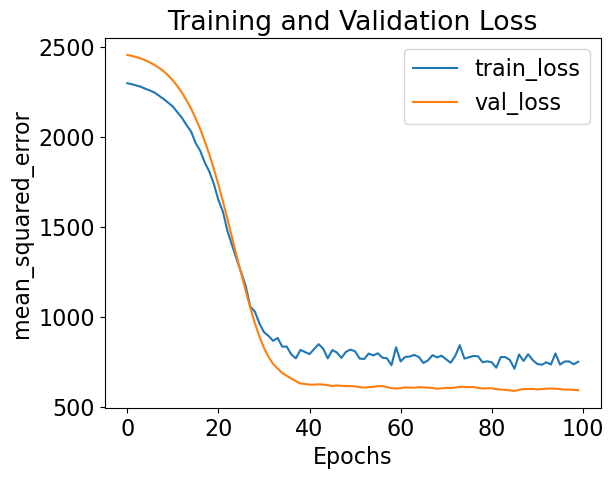

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:10:36,399] Trial 7 finished with value: 595.0718383789062 and parameters: {'batch_size': 48, 'learning_rate': 8.380051372562307e-05, 'n_layers': 4, 'n_units_l0': 27, 'dropout_l0': 0.20653926052488625, 'n_units_l1': 48, 'dropout_l1': 0.2919539368613238, 'n_units_l2': 474, 'dropout_l2': 0.257625697338653, 'n_units_l3': 12, 'dropout_l3': 0.2927830947582954}. Best is trial 2 with value: 545.359619140625.


Block: verbose not specified in input, defaulting to 1


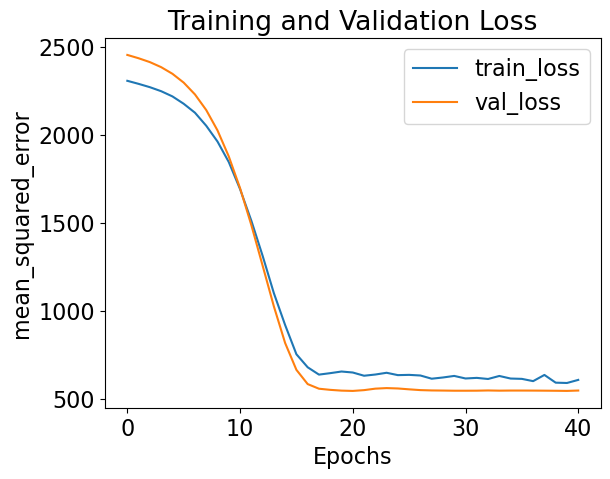

23/23 [==============================] - 0s 5ms/step


[I 2024-11-01 10:10:48,896] Trial 8 finished with value: 547.9661865234375 and parameters: {'batch_size': 110, 'learning_rate': 0.0005839897703443093, 'n_layers': 3, 'n_units_l0': 145, 'dropout_l0': 0.15686039716911682, 'n_units_l1': 103, 'dropout_l1': 0.38532551547389654, 'n_units_l2': 82, 'dropout_l2': 0.08326144231528987}. Best is trial 2 with value: 545.359619140625.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:10:51,516] Trial 9 pruned. Trial was pruned at epoch 0.


All results from this run will be saved to demo_results\experiment0054
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


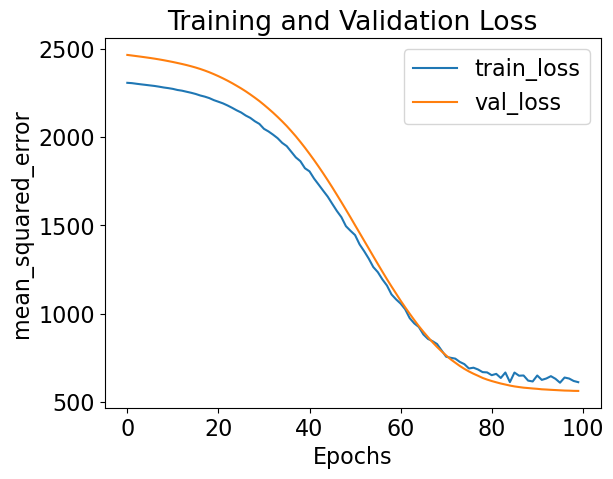

23/23 [==============================] - 0s 4ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-01 10:11:24,833] A new study created in memory with name: no-name-16cc73fe-dac7-4536-ad91-ae14b01f116f


CauseClusterer training complete.
Experiment training complete.
100
Block: verbose not specified in input, defaulting to 1


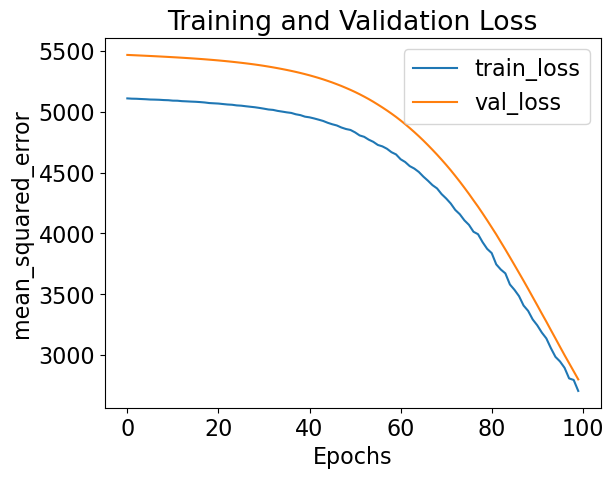

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:12:00,669] Trial 0 finished with value: 2801.56689453125 and parameters: {'batch_size': 37, 'learning_rate': 1.6399314736377236e-05, 'n_layers': 4, 'n_units_l0': 177, 'dropout_l0': 0.4384922028678115, 'n_units_l1': 141, 'dropout_l1': 0.16350636666145657, 'n_units_l2': 50, 'dropout_l2': 0.27987624630181307, 'n_units_l3': 54, 'dropout_l3': 0.01540195733214289}. Best is trial 0 with value: 2801.56689453125.


Block: verbose not specified in input, defaulting to 1


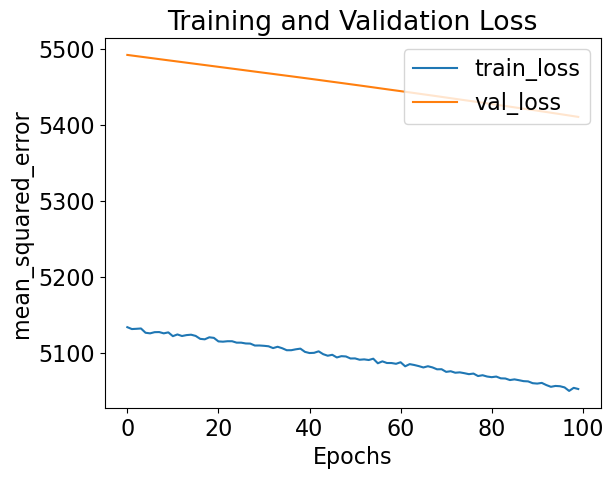

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:12:27,673] Trial 1 finished with value: 5410.201171875 and parameters: {'batch_size': 80, 'learning_rate': 3.476106048528501e-05, 'n_layers': 2, 'n_units_l0': 4, 'dropout_l0': 0.2420498062455142, 'n_units_l1': 105, 'dropout_l1': 0.46095549153780646}. Best is trial 0 with value: 2801.56689453125.


Block: verbose not specified in input, defaulting to 1


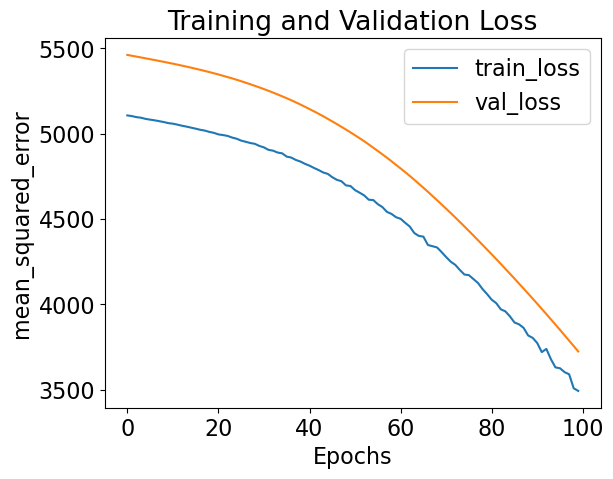

23/23 [==============================] - 0s 5ms/step


[I 2024-11-01 10:12:53,585] Trial 2 finished with value: 3724.6142578125 and parameters: {'batch_size': 76, 'learning_rate': 9.26509916706823e-05, 'n_layers': 2, 'n_units_l0': 14, 'dropout_l0': 0.28006095504482875, 'n_units_l1': 278, 'dropout_l1': 0.1486588595814855}. Best is trial 0 with value: 2801.56689453125.


Block: verbose not specified in input, defaulting to 1


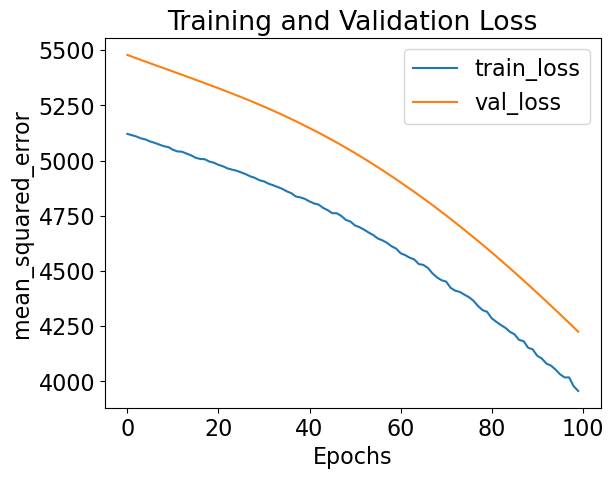

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:13:20,219] Trial 3 finished with value: 4225.0185546875 and parameters: {'batch_size': 43, 'learning_rate': 0.00020123460714349708, 'n_layers': 1, 'n_units_l0': 93, 'dropout_l0': 0.45222831933043034}. Best is trial 0 with value: 2801.56689453125.


Block: verbose not specified in input, defaulting to 1


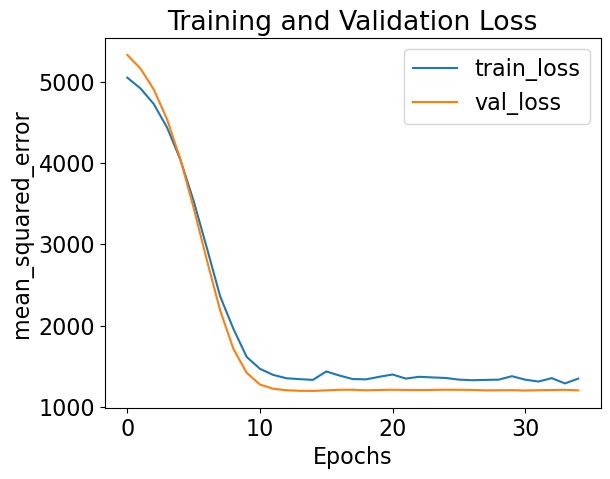

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:13:31,786] Trial 4 finished with value: 1201.3330078125 and parameters: {'batch_size': 28, 'learning_rate': 0.0004404945069161599, 'n_layers': 2, 'n_units_l0': 273, 'dropout_l0': 0.061917519065101456, 'n_units_l1': 85, 'dropout_l1': 0.42907121673037774}. Best is trial 4 with value: 1201.3330078125.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:13:39,454] Trial 5 pruned. Trial was pruned at epoch 18.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:13:41,453] Trial 6 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:13:44,953] Trial 7 pruned. Trial was pruned at epoch 4.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:13:47,686] Trial 8 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:13:50,319] Trial 9 pruned. Trial was pruned at epoch 0.


All results from this run will be saved to demo_results\experiment0055
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


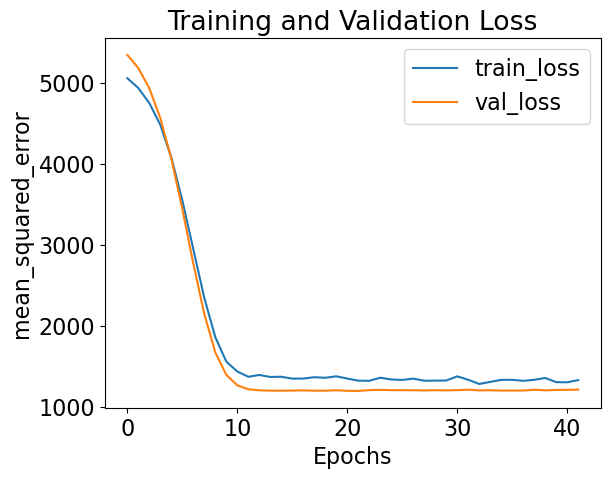

23/23 [==============================] - 0s 3ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-01 10:14:04,954] A new study created in memory with name: no-name-523afb06-32ee-4b93-8d4c-6751b4ccfc42


CauseClusterer training complete.
Experiment training complete.
150
Block: verbose not specified in input, defaulting to 1


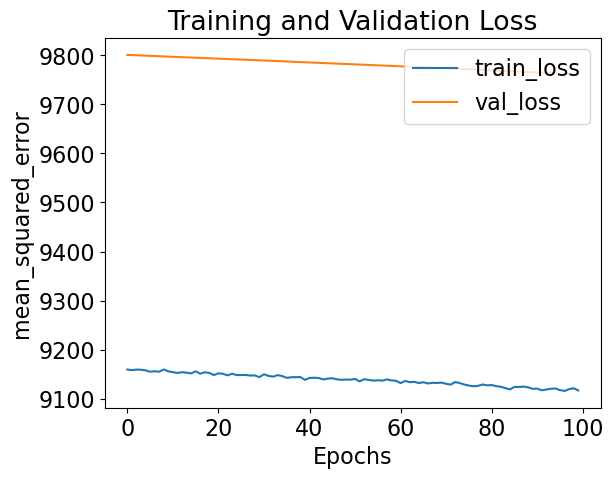

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:14:31,989] Trial 0 finished with value: 9760.884765625 and parameters: {'batch_size': 55, 'learning_rate': 1.0298056420248575e-05, 'n_layers': 4, 'n_units_l0': 4, 'dropout_l0': 0.40636194603131337, 'n_units_l1': 19, 'dropout_l1': 0.21678229437698188, 'n_units_l2': 21, 'dropout_l2': 0.1767773178096641, 'n_units_l3': 71, 'dropout_l3': 0.47750329419910614}. Best is trial 0 with value: 9760.884765625.


Block: verbose not specified in input, defaulting to 1


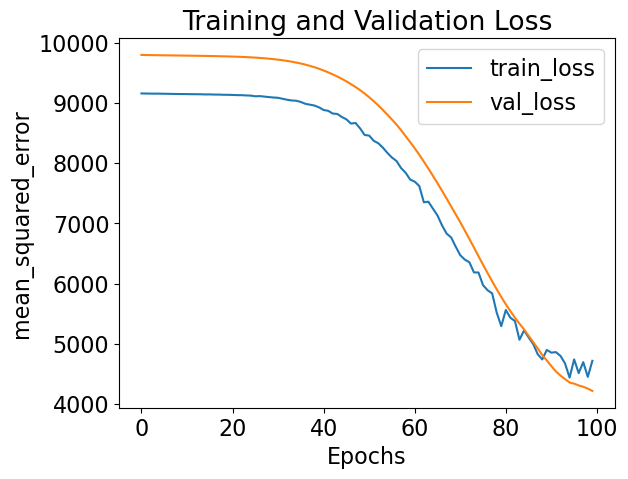

23/23 [==============================] - 0s 5ms/step


[I 2024-11-01 10:14:57,195] Trial 1 finished with value: 4219.61279296875 and parameters: {'batch_size': 76, 'learning_rate': 6.785114053899998e-05, 'n_layers': 5, 'n_units_l0': 5, 'dropout_l0': 0.4533090369013802, 'n_units_l1': 52, 'dropout_l1': 0.10044384662987993, 'n_units_l2': 260, 'dropout_l2': 0.08968646401080338, 'n_units_l3': 6, 'dropout_l3': 0.13203896578290436, 'n_units_l4': 91, 'dropout_l4': 0.4202910138755514}. Best is trial 1 with value: 4219.61279296875.


Block: verbose not specified in input, defaulting to 1


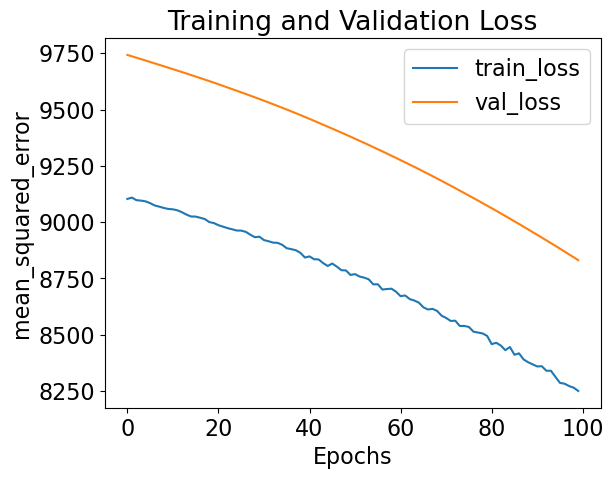

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:15:22,920] Trial 2 finished with value: 8831.1923828125 and parameters: {'batch_size': 24, 'learning_rate': 0.0001239918988532156, 'n_layers': 1, 'n_units_l0': 30, 'dropout_l0': 0.38500097858930044}. Best is trial 1 with value: 4219.61279296875.


Block: verbose not specified in input, defaulting to 1


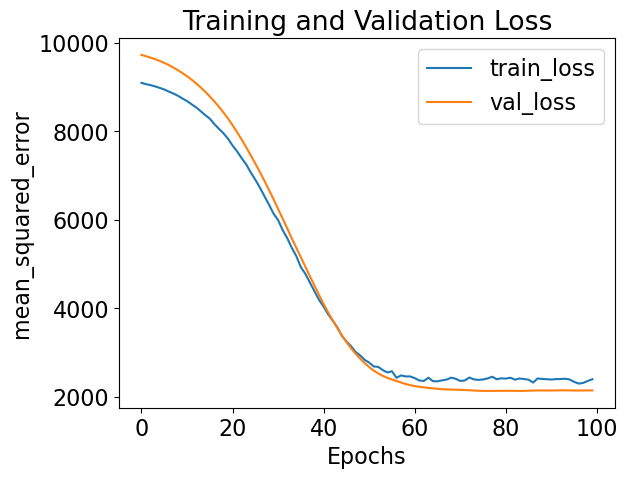

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:15:42,137] Trial 3 finished with value: 2145.15478515625 and parameters: {'batch_size': 89, 'learning_rate': 0.00043317605701308475, 'n_layers': 2, 'n_units_l0': 163, 'dropout_l0': 0.44771457046329327, 'n_units_l1': 23, 'dropout_l1': 0.046321568810609726}. Best is trial 3 with value: 2145.15478515625.


Block: verbose not specified in input, defaulting to 1


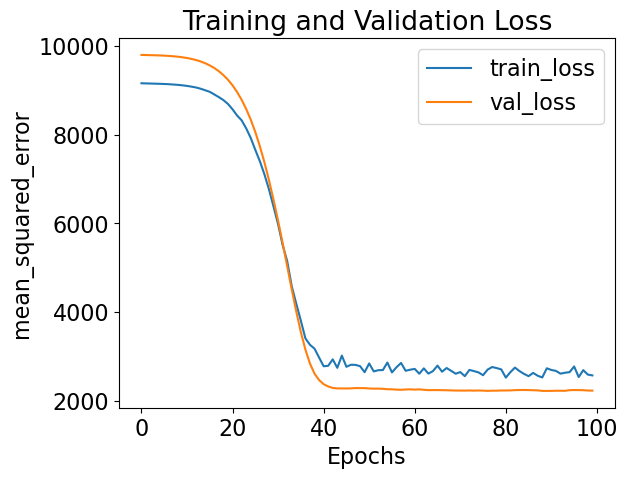

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:16:03,630] Trial 4 finished with value: 2231.960693359375 and parameters: {'batch_size': 115, 'learning_rate': 0.00011650963781239103, 'n_layers': 5, 'n_units_l0': 154, 'dropout_l0': 0.22148885474531715, 'n_units_l1': 236, 'dropout_l1': 0.29085823445325515, 'n_units_l2': 52, 'dropout_l2': 0.0009533551427352016, 'n_units_l3': 11, 'dropout_l3': 0.23106523054301253, 'n_units_l4': 361, 'dropout_l4': 0.4778432552542555}. Best is trial 3 with value: 2145.15478515625.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:16:06,143] Trial 5 pruned. Trial was pruned at epoch 4.


Block: verbose not specified in input, defaulting to 1


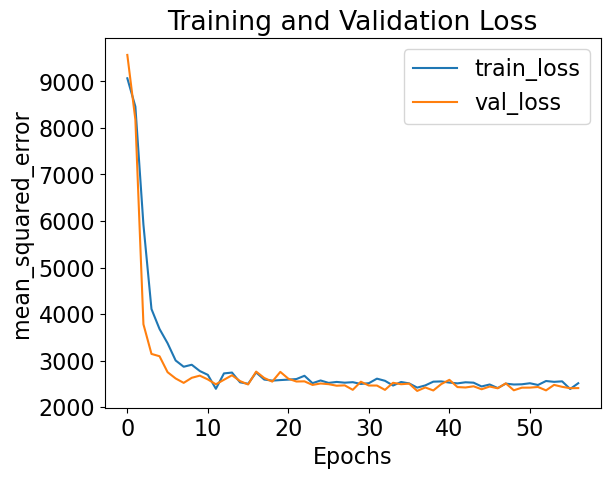

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:16:23,860] Trial 6 finished with value: 2411.900634765625 and parameters: {'batch_size': 17, 'learning_rate': 0.0003473853744266685, 'n_layers': 5, 'n_units_l0': 4, 'dropout_l0': 0.43473323450547646, 'n_units_l1': 36, 'dropout_l1': 0.2568270040436996, 'n_units_l2': 420, 'dropout_l2': 0.19845830599605224, 'n_units_l3': 59, 'dropout_l3': 0.4210953543727255, 'n_units_l4': 161, 'dropout_l4': 0.40108331408906156}. Best is trial 3 with value: 2145.15478515625.


Block: verbose not specified in input, defaulting to 1


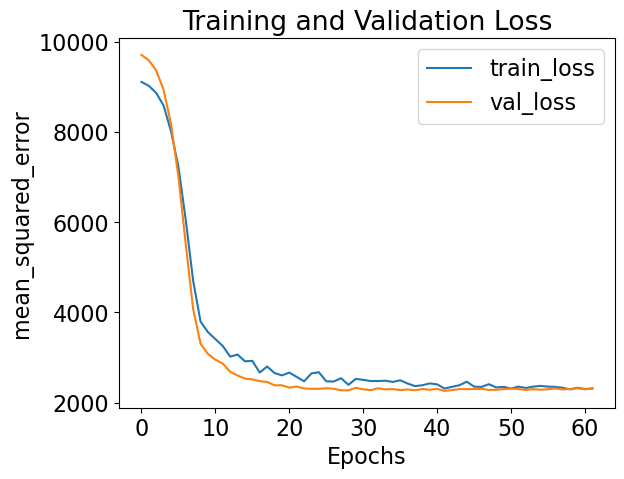

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:16:39,356] Trial 7 finished with value: 2308.8427734375 and parameters: {'batch_size': 40, 'learning_rate': 0.00018541974883812915, 'n_layers': 5, 'n_units_l0': 5, 'dropout_l0': 0.22212955822906683, 'n_units_l1': 213, 'dropout_l1': 0.024352258533428595, 'n_units_l2': 354, 'dropout_l2': 0.3443540380308774, 'n_units_l3': 95, 'dropout_l3': 0.04676900145144858, 'n_units_l4': 14, 'dropout_l4': 0.011494903069379836}. Best is trial 3 with value: 2145.15478515625.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:16:42,740] Trial 8 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:16:44,694] Trial 9 pruned. Trial was pruned at epoch 0.


All results from this run will be saved to demo_results\experiment0056
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


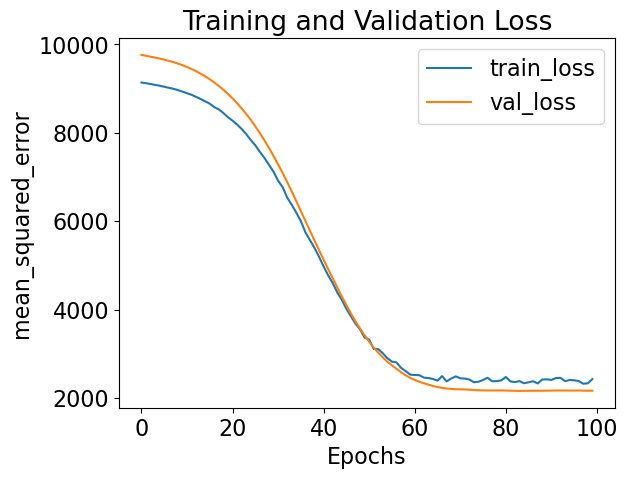

23/23 [==============================] - 0s 2ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-01 10:17:04,690] A new study created in memory with name: no-name-b6a5a89b-f180-4491-814b-f3ec1216ee73


CauseClusterer training complete.
Experiment training complete.
200
Block: verbose not specified in input, defaulting to 1


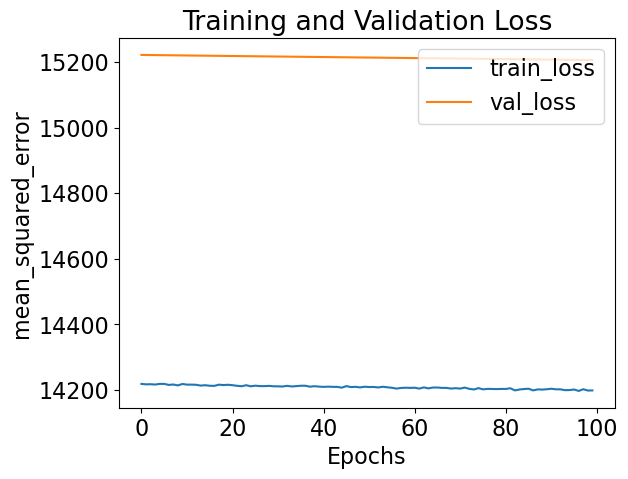

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:17:27,312] Trial 0 finished with value: 15205.99609375 and parameters: {'batch_size': 125, 'learning_rate': 2.204048631534345e-05, 'n_layers': 3, 'n_units_l0': 29, 'dropout_l0': 0.378446557689294, 'n_units_l1': 4, 'dropout_l1': 0.2743049231869661, 'n_units_l2': 20, 'dropout_l2': 0.42720177935686315}. Best is trial 0 with value: 15205.99609375.


Block: verbose not specified in input, defaulting to 1


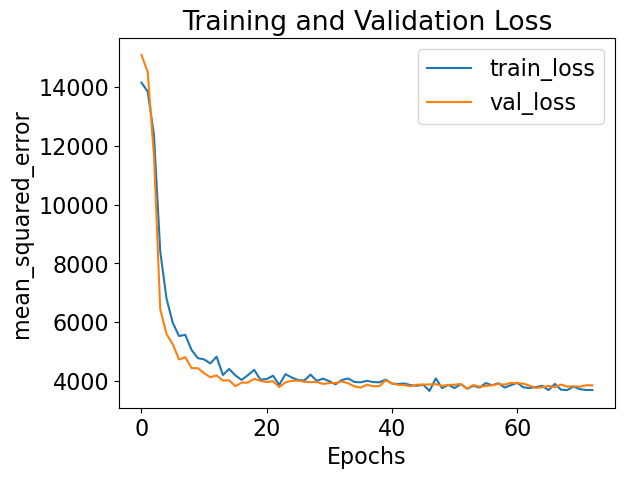

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:17:46,486] Trial 1 finished with value: 3852.072509765625 and parameters: {'batch_size': 18, 'learning_rate': 0.0005714509441021767, 'n_layers': 5, 'n_units_l0': 6, 'dropout_l0': 0.39501129177398525, 'n_units_l1': 52, 'dropout_l1': 0.2663298992254304, 'n_units_l2': 10, 'dropout_l2': 0.30330658786196607, 'n_units_l3': 30, 'dropout_l3': 0.17891572059385913, 'n_units_l4': 271, 'dropout_l4': 0.06070630565243079}. Best is trial 1 with value: 3852.072509765625.


Block: verbose not specified in input, defaulting to 1


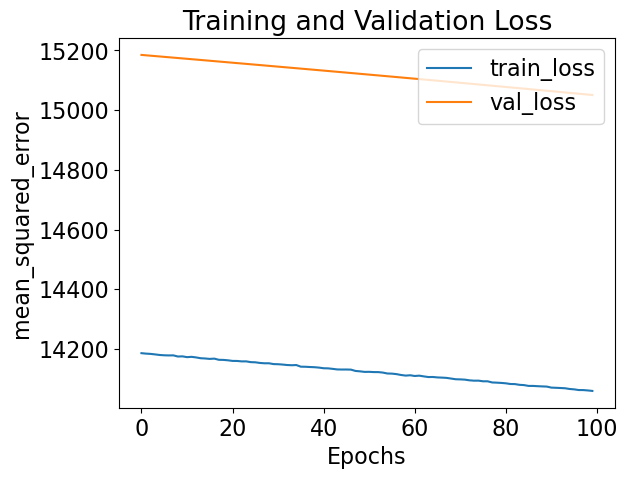

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:18:07,263] Trial 2 finished with value: 15050.6435546875 and parameters: {'batch_size': 70, 'learning_rate': 3.2390644329413486e-05, 'n_layers': 1, 'n_units_l0': 115, 'dropout_l0': 0.1084891592160005}. Best is trial 1 with value: 3852.072509765625.


Block: verbose not specified in input, defaulting to 1


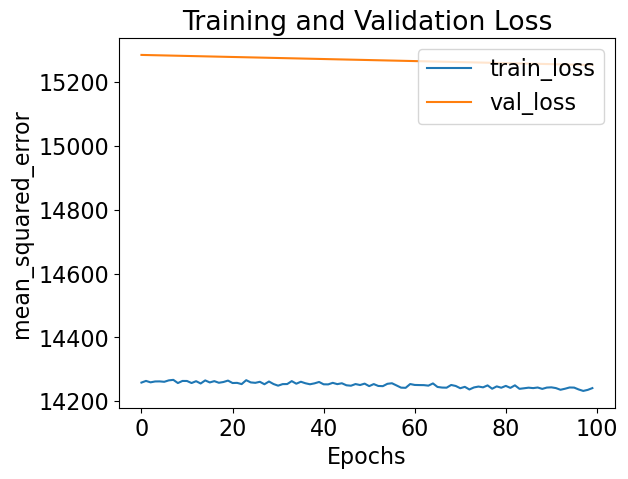

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:18:32,464] Trial 3 finished with value: 15253.79296875 and parameters: {'batch_size': 40, 'learning_rate': 1.1312363024221543e-05, 'n_layers': 1, 'n_units_l0': 17, 'dropout_l0': 0.39743669404801246}. Best is trial 1 with value: 3852.072509765625.


Block: verbose not specified in input, defaulting to 1


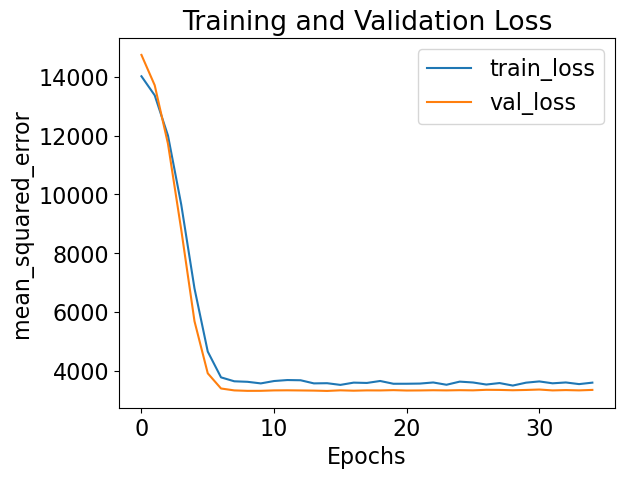

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:18:41,860] Trial 4 finished with value: 3356.453125 and parameters: {'batch_size': 17, 'learning_rate': 0.0006538057827195606, 'n_layers': 2, 'n_units_l0': 170, 'dropout_l0': 0.2871936835756569, 'n_units_l1': 91, 'dropout_l1': 0.0468130590341132}. Best is trial 4 with value: 3356.453125.


Block: verbose not specified in input, defaulting to 1


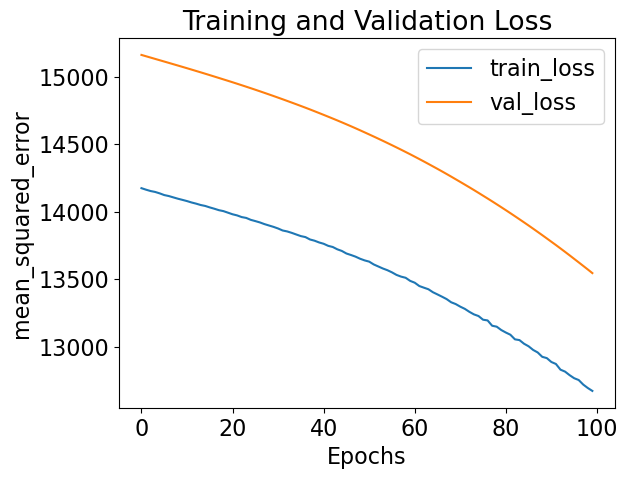

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:19:02,383] Trial 5 finished with value: 13545.0126953125 and parameters: {'batch_size': 123, 'learning_rate': 0.0005427274360968603, 'n_layers': 1, 'n_units_l0': 44, 'dropout_l0': 0.07779155076192451}. Best is trial 4 with value: 3356.453125.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:19:05,194] Trial 6 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:19:06,915] Trial 7 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:19:08,617] Trial 8 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:19:10,672] Trial 9 pruned. Trial was pruned at epoch 0.


All results from this run will be saved to demo_results\experiment0057
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


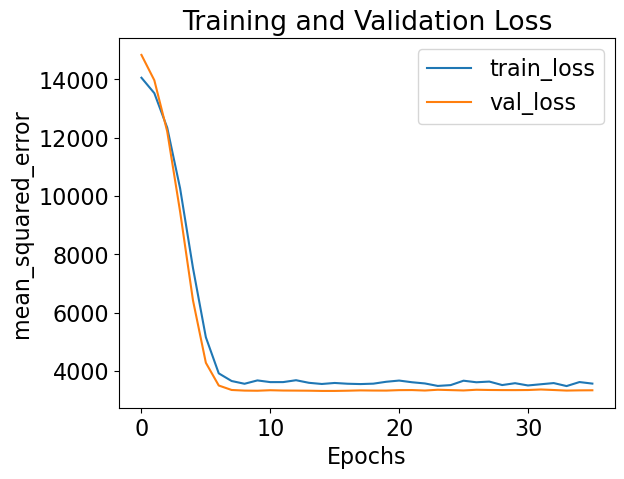

23/23 [==============================] - 0s 3ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...
CauseClusterer training complete.
Experiment training complete.


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-01 10:19:21,190] A new study created in memory with name: no-name-f538ea7d-f1ec-43f9-be24-713a36df35f2


250
Block: verbose not specified in input, defaulting to 1


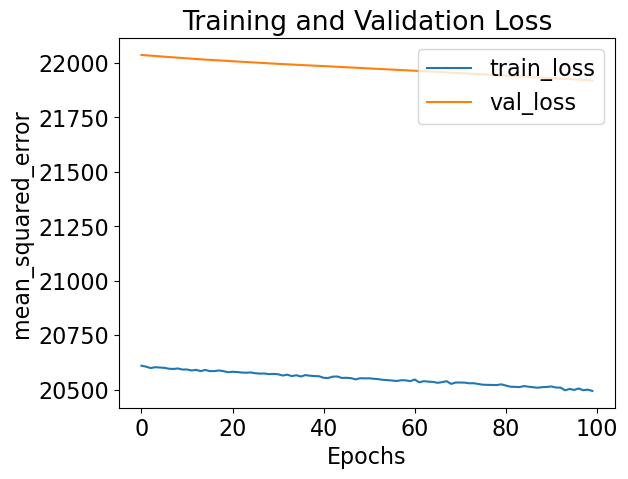

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:19:42,700] Trial 0 finished with value: 21919.62109375 and parameters: {'batch_size': 90, 'learning_rate': 7.139931963198845e-05, 'n_layers': 3, 'n_units_l0': 6, 'dropout_l0': 0.015024616816980807, 'n_units_l1': 26, 'dropout_l1': 0.31822401211295687, 'n_units_l2': 5, 'dropout_l2': 0.24389472131223822}. Best is trial 0 with value: 21919.62109375.


Block: verbose not specified in input, defaulting to 1


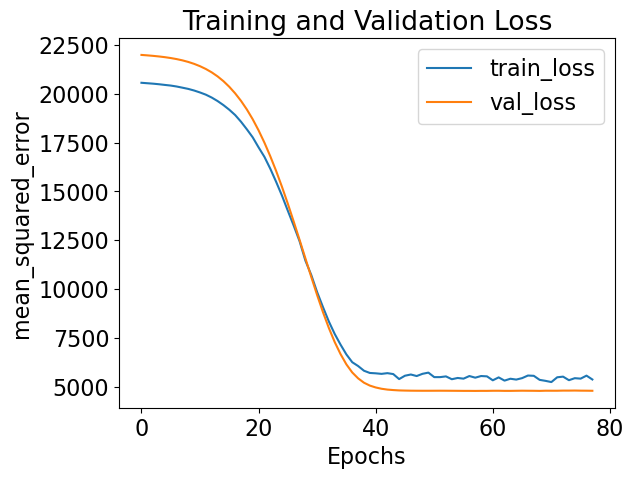

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:19:59,198] Trial 1 finished with value: 4784.0302734375 and parameters: {'batch_size': 116, 'learning_rate': 0.00021927356299293667, 'n_layers': 3, 'n_units_l0': 184, 'dropout_l0': 0.39163468326066003, 'n_units_l1': 50, 'dropout_l1': 0.060968678579155555, 'n_units_l2': 355, 'dropout_l2': 0.3351215878040967}. Best is trial 1 with value: 4784.0302734375.


Block: verbose not specified in input, defaulting to 1


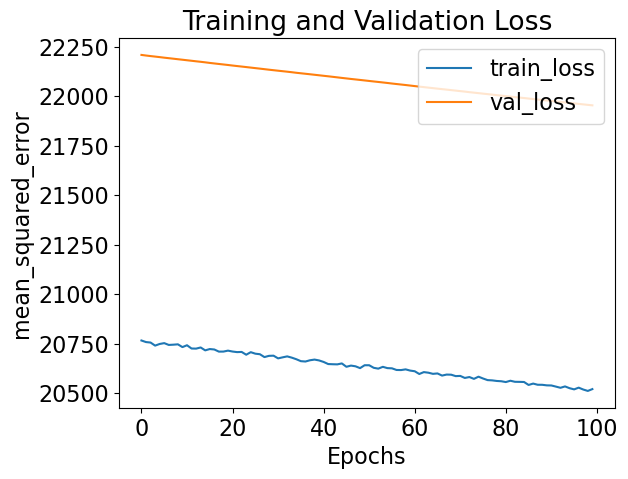

23/23 [==============================] - 0s 5ms/step


[I 2024-11-01 10:20:24,008] Trial 2 finished with value: 21954.251953125 and parameters: {'batch_size': 27, 'learning_rate': 9.274714684960757e-05, 'n_layers': 1, 'n_units_l0': 4, 'dropout_l0': 0.15177990273759723}. Best is trial 1 with value: 4784.0302734375.


Block: verbose not specified in input, defaulting to 1


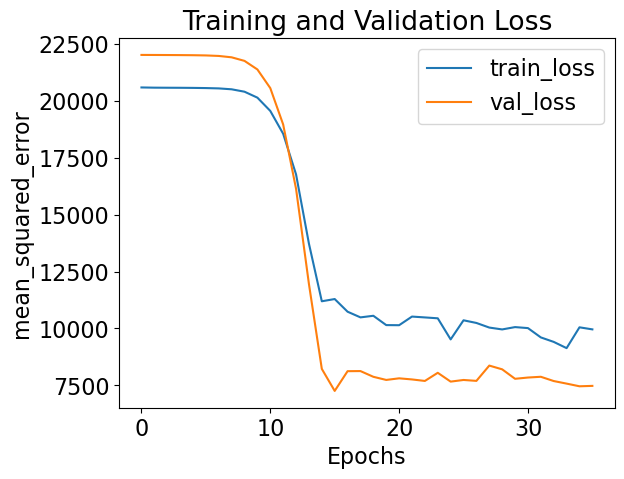

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:20:32,961] Trial 3 finished with value: 7477.23486328125 and parameters: {'batch_size': 51, 'learning_rate': 0.0005579457677386168, 'n_layers': 5, 'n_units_l0': 88, 'dropout_l0': 0.2625504696425585, 'n_units_l1': 8, 'dropout_l1': 0.46240256636238886, 'n_units_l2': 63, 'dropout_l2': 0.35306487886059024, 'n_units_l3': 267, 'dropout_l3': 0.3393152597919749, 'n_units_l4': 7, 'dropout_l4': 0.3719767305347131}. Best is trial 1 with value: 4784.0302734375.


Block: verbose not specified in input, defaulting to 1


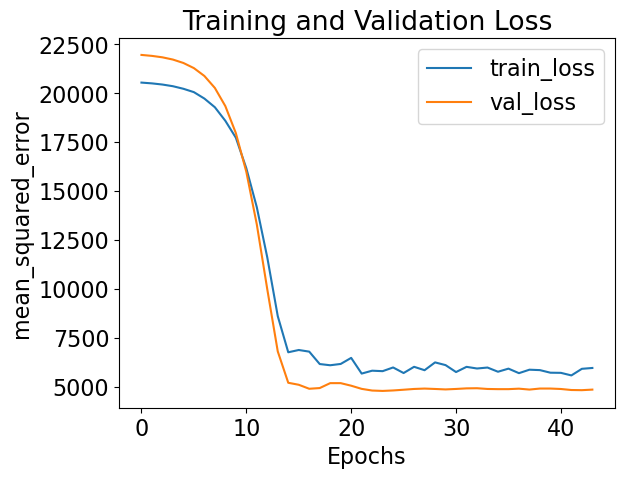

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:20:41,999] Trial 4 finished with value: 4854.62109375 and parameters: {'batch_size': 116, 'learning_rate': 0.0009127660884373656, 'n_layers': 5, 'n_units_l0': 50, 'dropout_l0': 0.005027979081355716, 'n_units_l1': 21, 'dropout_l1': 0.1718892171860265, 'n_units_l2': 83, 'dropout_l2': 0.23084924327073575, 'n_units_l3': 41, 'dropout_l3': 0.0559609536114517, 'n_units_l4': 23, 'dropout_l4': 0.1663319471651622}. Best is trial 1 with value: 4784.0302734375.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:20:46,174] Trial 5 pruned. Trial was pruned at epoch 7.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:20:49,682] Trial 6 pruned. Trial was pruned at epoch 7.


Block: verbose not specified in input, defaulting to 1


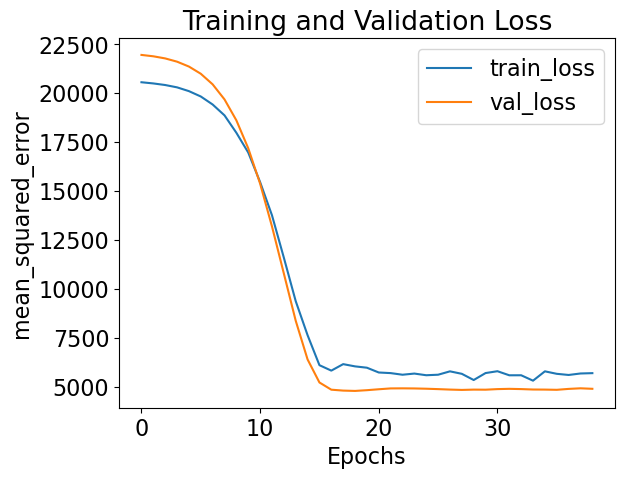

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:20:58,551] Trial 7 finished with value: 4898.98779296875 and parameters: {'batch_size': 99, 'learning_rate': 0.0007853376466023812, 'n_layers': 3, 'n_units_l0': 269, 'dropout_l0': 0.41840586836224136, 'n_units_l1': 38, 'dropout_l1': 0.41685697574521346, 'n_units_l2': 93, 'dropout_l2': 0.015474913351381181}. Best is trial 1 with value: 4784.0302734375.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:21:01,532] Trial 8 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:21:02,807] Trial 9 pruned. Trial was pruned at epoch 1.


All results from this run will be saved to demo_results\experiment0058
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


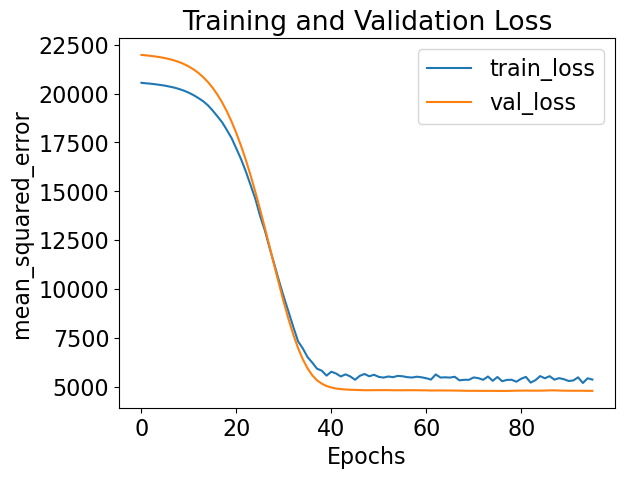

23/23 [==============================] - 0s 3ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-01 10:21:21,802] A new study created in memory with name: no-name-0c341c89-f1ee-4ffe-a159-c46a5c7bbbb8


CauseClusterer training complete.
Experiment training complete.
300
Block: verbose not specified in input, defaulting to 1


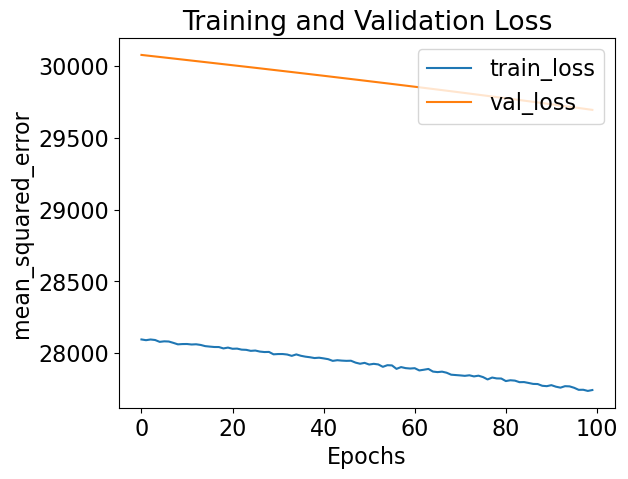

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:21:42,166] Trial 0 finished with value: 29694.69140625 and parameters: {'batch_size': 91, 'learning_rate': 0.00012037137475226903, 'n_layers': 1, 'n_units_l0': 52, 'dropout_l0': 0.4658667893810106}. Best is trial 0 with value: 29694.69140625.


Block: verbose not specified in input, defaulting to 1


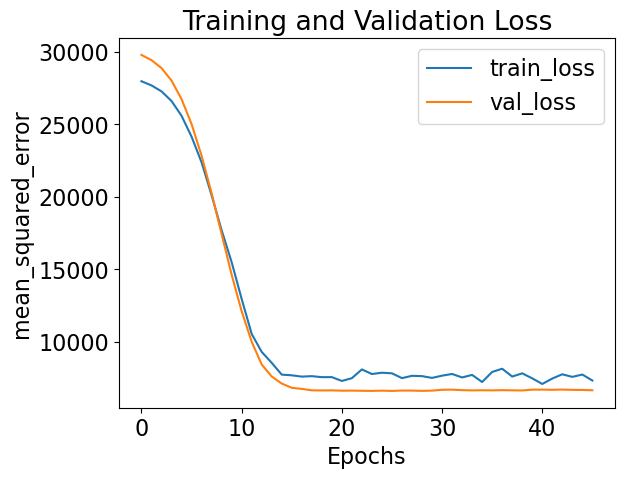

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:21:54,497] Trial 1 finished with value: 6666.25537109375 and parameters: {'batch_size': 22, 'learning_rate': 0.0009261266984183836, 'n_layers': 2, 'n_units_l0': 374, 'dropout_l0': 0.10243762131262679, 'n_units_l1': 8, 'dropout_l1': 0.060700733687572506}. Best is trial 1 with value: 6666.25537109375.


Block: verbose not specified in input, defaulting to 1


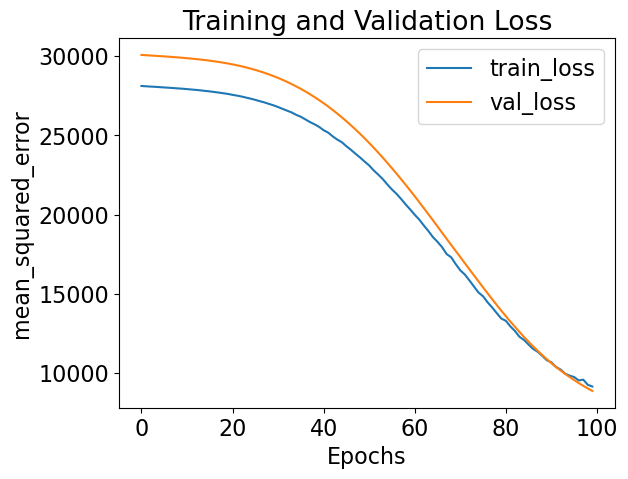

23/23 [==============================] - 0s 7ms/step


[I 2024-11-01 10:22:26,567] Trial 2 finished with value: 8854.333984375 and parameters: {'batch_size': 72, 'learning_rate': 2.6971099091714157e-05, 'n_layers': 3, 'n_units_l0': 152, 'dropout_l0': 0.2046480361639474, 'n_units_l1': 435, 'dropout_l1': 0.21584543597024386, 'n_units_l2': 309, 'dropout_l2': 0.15712483072594163}. Best is trial 1 with value: 6666.25537109375.


Block: verbose not specified in input, defaulting to 1


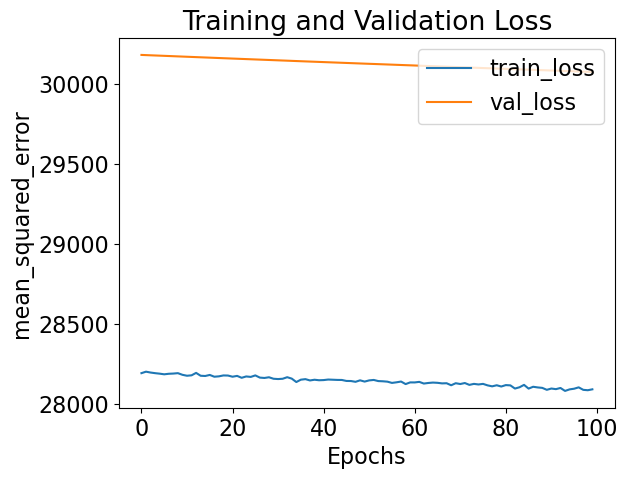

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:22:47,283] Trial 3 finished with value: 30072.720703125 and parameters: {'batch_size': 61, 'learning_rate': 9.595042324151726e-05, 'n_layers': 1, 'n_units_l0': 4, 'dropout_l0': 0.4244833182167339}. Best is trial 1 with value: 6666.25537109375.


Block: verbose not specified in input, defaulting to 1


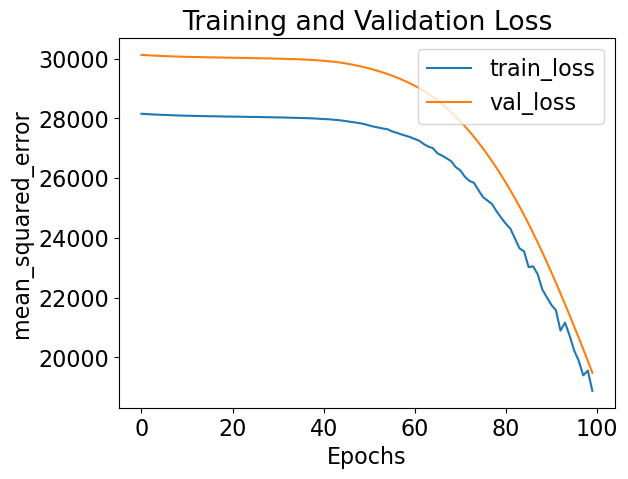

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:23:09,452] Trial 4 finished with value: 19481.5390625 and parameters: {'batch_size': 124, 'learning_rate': 0.0004105057355802811, 'n_layers': 3, 'n_units_l0': 61, 'dropout_l0': 0.0017773898160106105, 'n_units_l1': 6, 'dropout_l1': 0.3718432631615795, 'n_units_l2': 15, 'dropout_l2': 0.09625347076571539}. Best is trial 1 with value: 6666.25537109375.


Block: verbose not specified in input, defaulting to 1


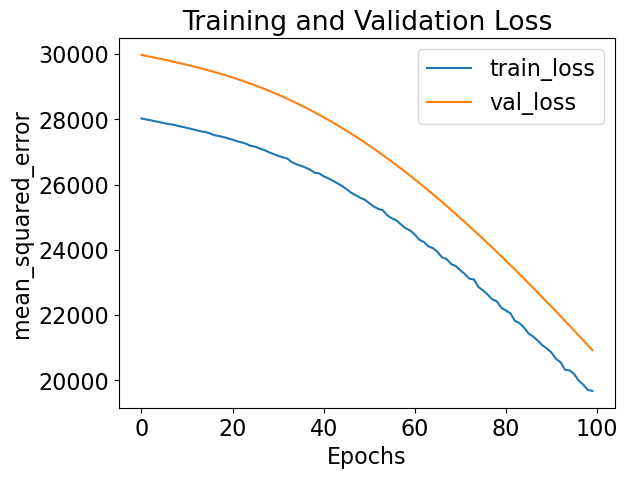

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:23:29,002] Trial 5 finished with value: 20930.3125 and parameters: {'batch_size': 116, 'learning_rate': 0.0009072844894301889, 'n_layers': 1, 'n_units_l0': 74, 'dropout_l0': 0.35276764404425787}. Best is trial 1 with value: 6666.25537109375.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:23:33,236] Trial 6 pruned. Trial was pruned at epoch 2.


Block: verbose not specified in input, defaulting to 1


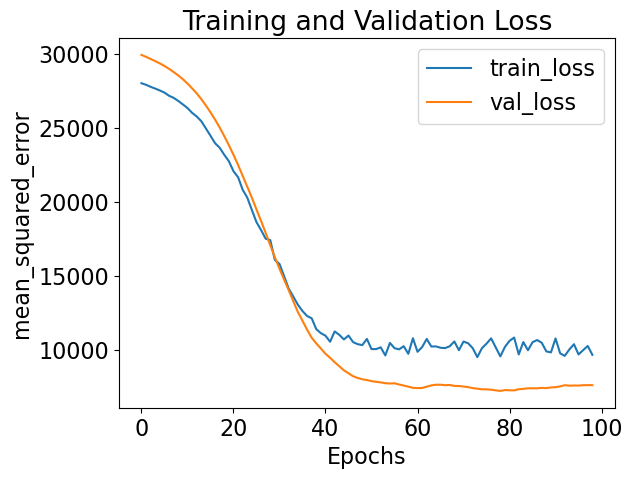

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:23:53,466] Trial 7 finished with value: 7614.16357421875 and parameters: {'batch_size': 54, 'learning_rate': 0.0005786335633183808, 'n_layers': 2, 'n_units_l0': 353, 'dropout_l0': 0.4975810966328813, 'n_units_l1': 6, 'dropout_l1': 0.40472906902412364}. Best is trial 1 with value: 6666.25537109375.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:23:56,439] Trial 8 pruned. Trial was pruned at epoch 4.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:23:58,066] Trial 9 pruned. Trial was pruned at epoch 0.


All results from this run will be saved to demo_results\experiment0059
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


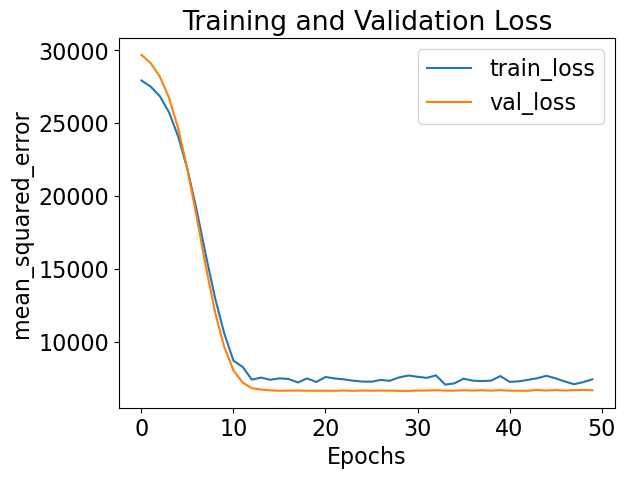

23/23 [==============================] - 0s 2ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...
CauseClusterer training complete.
Experiment training complete.
350


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-01 10:24:10,714] A new study created in memory with name: no-name-a9c93256-65fa-404e-bbee-0dd3cf07356f


Block: verbose not specified in input, defaulting to 1


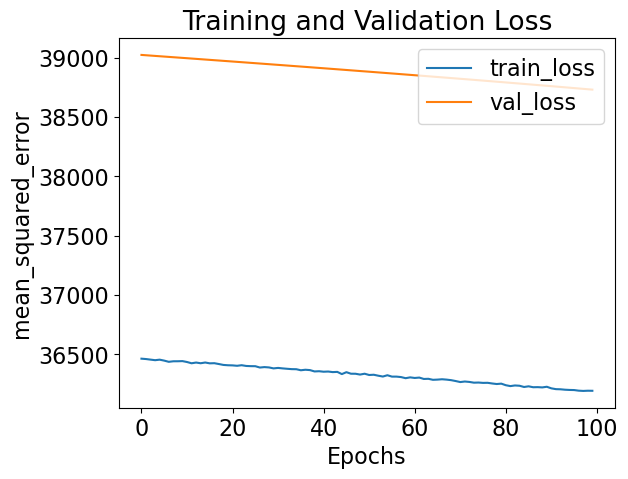

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:24:31,138] Trial 0 finished with value: 38732.31640625 and parameters: {'batch_size': 80, 'learning_rate': 7.467189330534685e-05, 'n_layers': 1, 'n_units_l0': 44, 'dropout_l0': 0.30047389454965306}. Best is trial 0 with value: 38732.31640625.


Block: verbose not specified in input, defaulting to 1


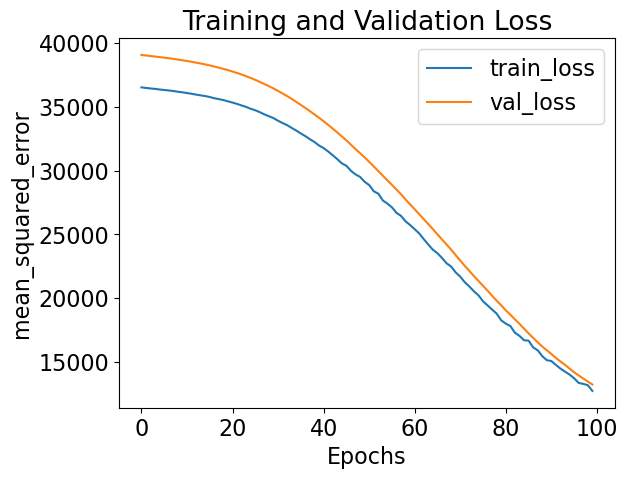

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:24:58,783] Trial 1 finished with value: 13231.9033203125 and parameters: {'batch_size': 30, 'learning_rate': 0.00012650232234300975, 'n_layers': 2, 'n_units_l0': 377, 'dropout_l0': 0.3521618289555779, 'n_units_l1': 9, 'dropout_l1': 0.03751605037997974}. Best is trial 1 with value: 13231.9033203125.


Block: verbose not specified in input, defaulting to 1


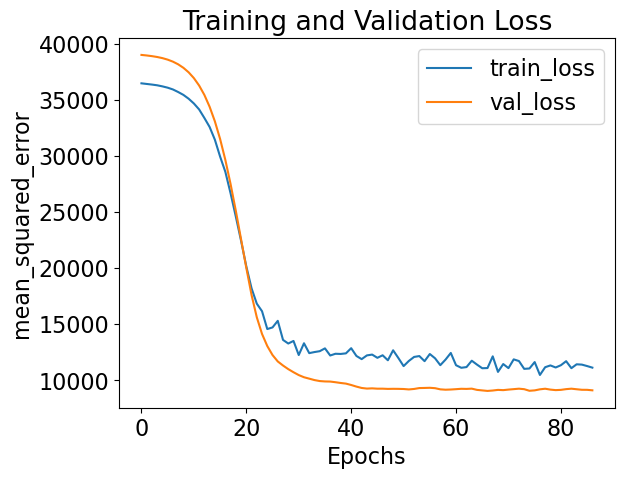

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:25:15,261] Trial 2 finished with value: 9107.3125 and parameters: {'batch_size': 116, 'learning_rate': 0.0007761781716086932, 'n_layers': 4, 'n_units_l0': 19, 'dropout_l0': 0.46601520318502365, 'n_units_l1': 79, 'dropout_l1': 0.025950571703297454, 'n_units_l2': 48, 'dropout_l2': 0.07232461692412107, 'n_units_l3': 10, 'dropout_l3': 0.1535534833989513}. Best is trial 2 with value: 9107.3125.


Block: verbose not specified in input, defaulting to 1


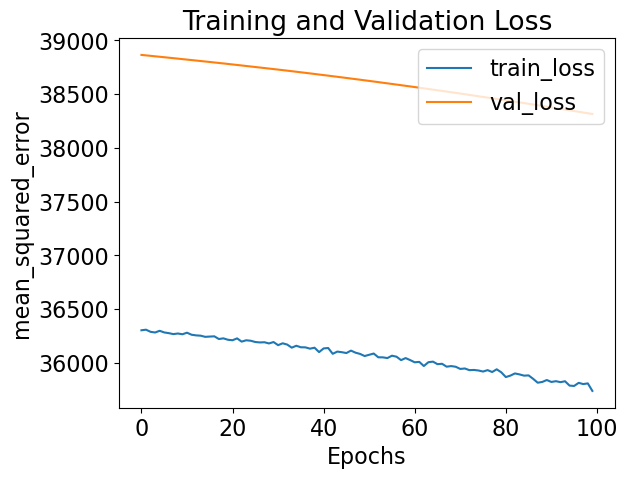

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:25:40,717] Trial 3 finished with value: 38314.9296875 and parameters: {'batch_size': 25, 'learning_rate': 9.060039164147934e-05, 'n_layers': 1, 'n_units_l0': 8, 'dropout_l0': 0.3833946909412955}. Best is trial 2 with value: 9107.3125.


Block: verbose not specified in input, defaulting to 1


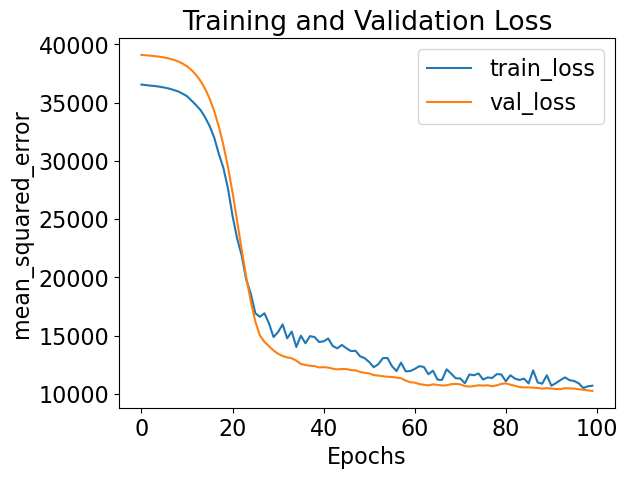

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:26:03,101] Trial 4 finished with value: 10249.7001953125 and parameters: {'batch_size': 82, 'learning_rate': 0.0004341755803672592, 'n_layers': 5, 'n_units_l0': 6, 'dropout_l0': 0.4360154108253374, 'n_units_l1': 7, 'dropout_l1': 0.1927278944162883, 'n_units_l2': 16, 'dropout_l2': 0.4054205998005744, 'n_units_l3': 86, 'dropout_l3': 0.4559429563339898, 'n_units_l4': 88, 'dropout_l4': 0.22390666373028484}. Best is trial 2 with value: 9107.3125.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:26:05,756] Trial 5 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:26:07,076] Trial 6 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:26:08,823] Trial 7 pruned. Trial was pruned at epoch 2.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:26:11,720] Trial 8 pruned. Trial was pruned at epoch 3.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:26:14,833] Trial 9 pruned. Trial was pruned at epoch 0.


All results from this run will be saved to demo_results\experiment0060
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


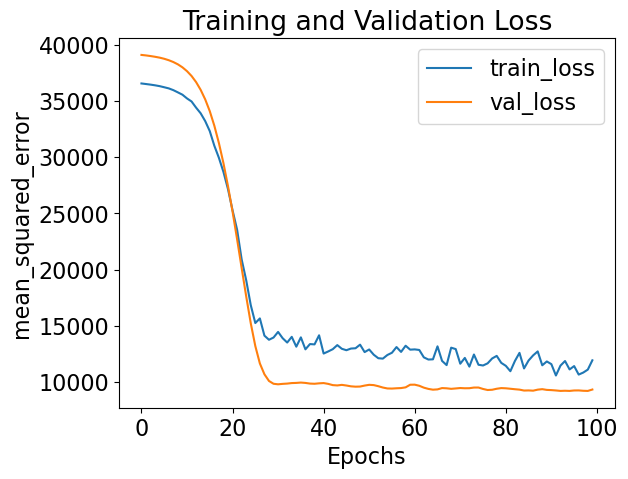

23/23 [==============================] - 0s 3ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-01 10:26:32,877] A new study created in memory with name: no-name-a2519a13-00d0-49be-8558-302dbf95f288


CauseClusterer training complete.
Experiment training complete.
400
Block: verbose not specified in input, defaulting to 1


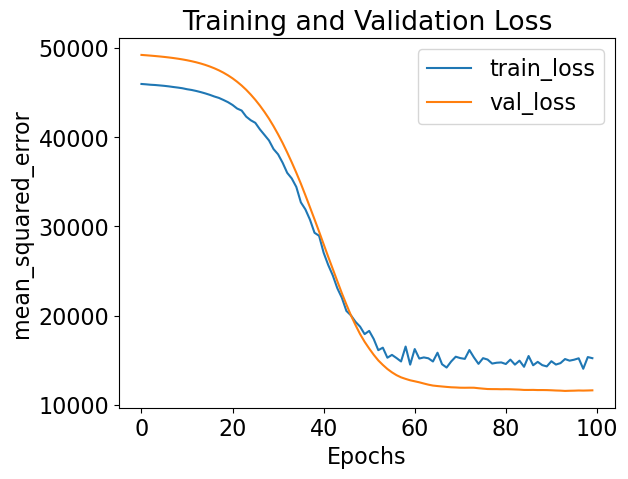

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:26:55,304] Trial 0 finished with value: 11611.9189453125 and parameters: {'batch_size': 61, 'learning_rate': 0.00031146502807074915, 'n_layers': 3, 'n_units_l0': 36, 'dropout_l0': 0.3816378705461269, 'n_units_l1': 29, 'dropout_l1': 0.43485208413893195, 'n_units_l2': 27, 'dropout_l2': 0.281595733278363}. Best is trial 0 with value: 11611.9189453125.


Block: verbose not specified in input, defaulting to 1


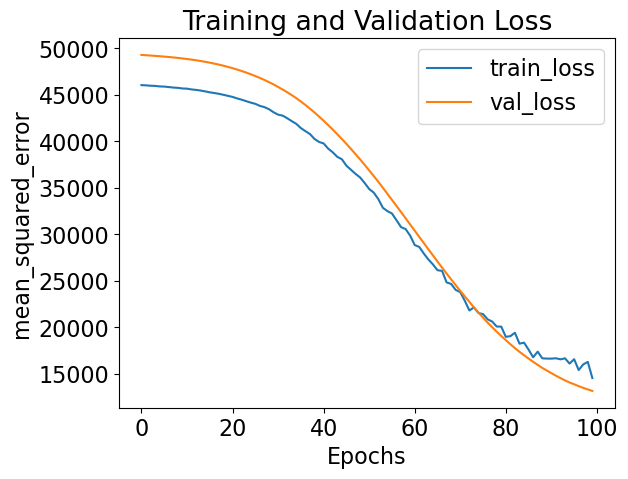

23/23 [==============================] - 0s 6ms/step


[I 2024-11-01 10:27:18,669] Trial 1 finished with value: 13184.4423828125 and parameters: {'batch_size': 51, 'learning_rate': 0.0005781043425598212, 'n_layers': 2, 'n_units_l0': 18, 'dropout_l0': 0.28190912416856967, 'n_units_l1': 9, 'dropout_l1': 0.28487484298535487}. Best is trial 0 with value: 11611.9189453125.


Block: verbose not specified in input, defaulting to 1


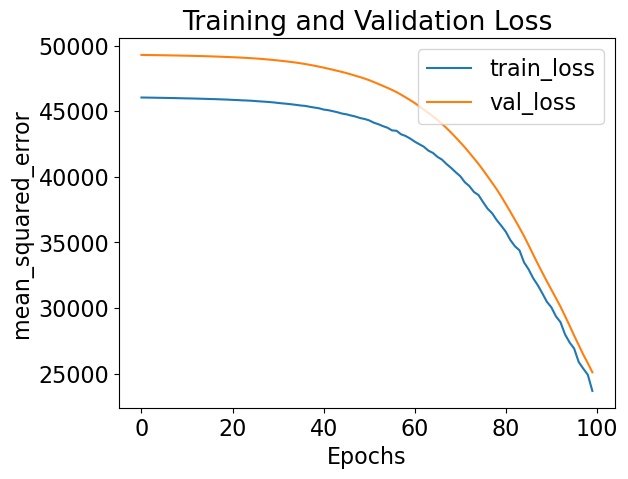

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:27:45,557] Trial 2 finished with value: 25112.2734375 and parameters: {'batch_size': 90, 'learning_rate': 3.816322015021565e-05, 'n_layers': 4, 'n_units_l0': 186, 'dropout_l0': 0.25923726509850853, 'n_units_l1': 108, 'dropout_l1': 0.3505762318654016, 'n_units_l2': 34, 'dropout_l2': 0.22050717357434246, 'n_units_l3': 438, 'dropout_l3': 0.397814540618872}. Best is trial 0 with value: 11611.9189453125.


Block: verbose not specified in input, defaulting to 1


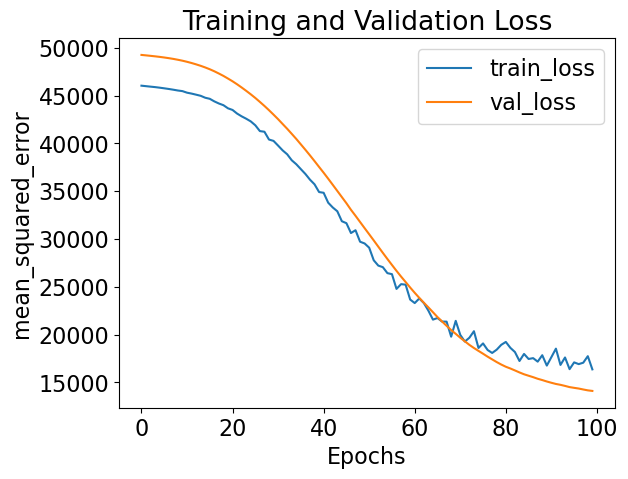

23/23 [==============================] - 0s 2ms/step


[I 2024-11-01 10:28:12,069] Trial 3 finished with value: 14100.755859375 and parameters: {'batch_size': 33, 'learning_rate': 0.00019526556449259795, 'n_layers': 2, 'n_units_l0': 7, 'dropout_l0': 0.4633782531039863, 'n_units_l1': 260, 'dropout_l1': 0.1199311845304416}. Best is trial 0 with value: 11611.9189453125.


Block: verbose not specified in input, defaulting to 1


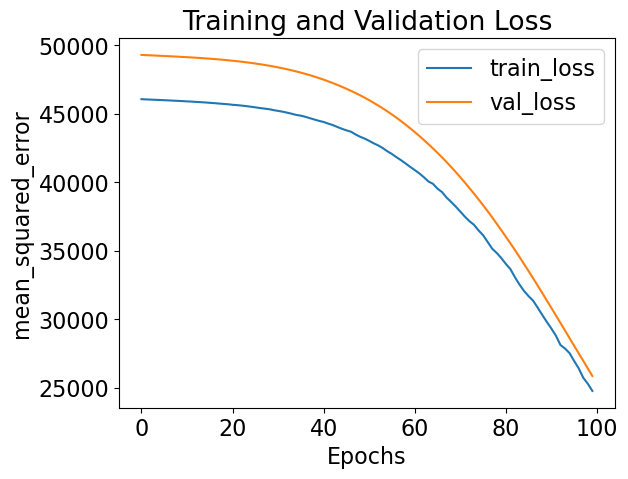

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:28:35,171] Trial 4 finished with value: 25857.53515625 and parameters: {'batch_size': 125, 'learning_rate': 0.00011957435198119054, 'n_layers': 3, 'n_units_l0': 26, 'dropout_l0': 0.14050121266428894, 'n_units_l1': 27, 'dropout_l1': 0.06748428671225809, 'n_units_l2': 384, 'dropout_l2': 0.1560541763380432}. Best is trial 0 with value: 11611.9189453125.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:28:38,122] Trial 5 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:28:40,319] Trial 6 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


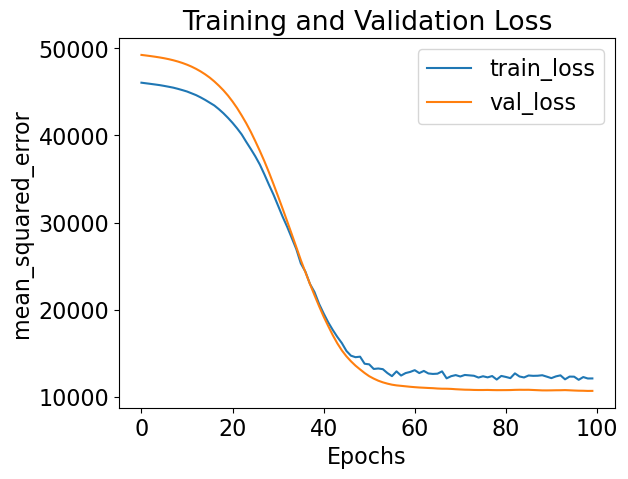

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:29:04,657] Trial 7 finished with value: 10697.3125 and parameters: {'batch_size': 89, 'learning_rate': 9.766038642588033e-05, 'n_layers': 3, 'n_units_l0': 125, 'dropout_l0': 0.3449224325994556, 'n_units_l1': 475, 'dropout_l1': 0.05026354910510439, 'n_units_l2': 112, 'dropout_l2': 0.19523503727748698}. Best is trial 7 with value: 10697.3125.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:29:07,032] Trial 8 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


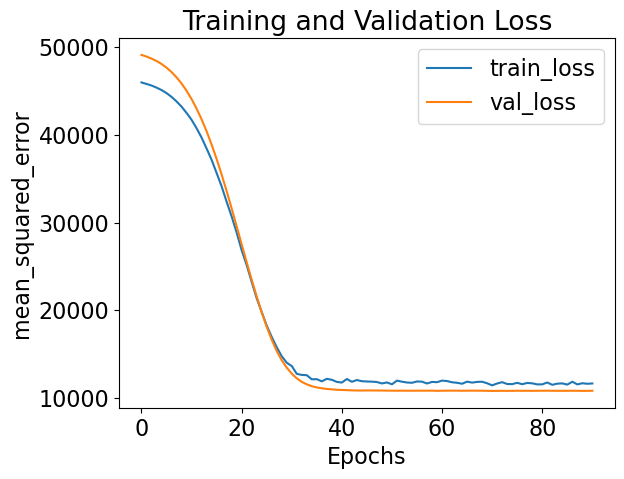

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:29:24,714] Trial 9 finished with value: 10818.744140625 and parameters: {'batch_size': 70, 'learning_rate': 0.0004291087759313996, 'n_layers': 2, 'n_units_l0': 225, 'dropout_l0': 0.25553771140101067, 'n_units_l1': 171, 'dropout_l1': 0.2518977713005021}. Best is trial 7 with value: 10697.3125.


All results from this run will be saved to demo_results\experiment0061
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


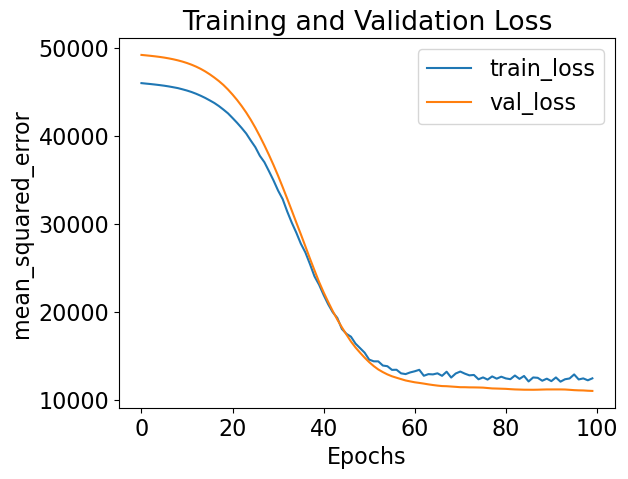

23/23 [==============================] - 0s 2ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-01 10:29:51,592] A new study created in memory with name: no-name-7fd7e00a-1746-424c-bc9e-3b2dd2ba8d3c


CauseClusterer training complete.
Experiment training complete.
450
Block: verbose not specified in input, defaulting to 1


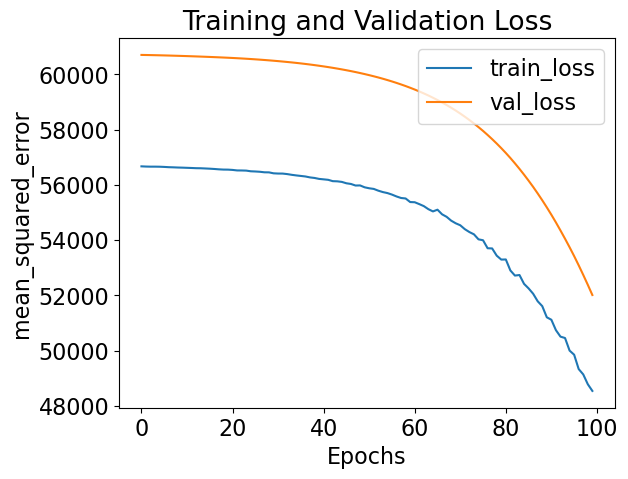

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:30:18,775] Trial 0 finished with value: 52016.44140625 and parameters: {'batch_size': 109, 'learning_rate': 3.6167137808795674e-05, 'n_layers': 5, 'n_units_l0': 101, 'dropout_l0': 0.37088949629111406, 'n_units_l1': 56, 'dropout_l1': 0.4422247673355191, 'n_units_l2': 77, 'dropout_l2': 0.27133965775429186, 'n_units_l3': 202, 'dropout_l3': 0.2688284462110803, 'n_units_l4': 8, 'dropout_l4': 0.16453686817087732}. Best is trial 0 with value: 52016.44140625.


Block: verbose not specified in input, defaulting to 1


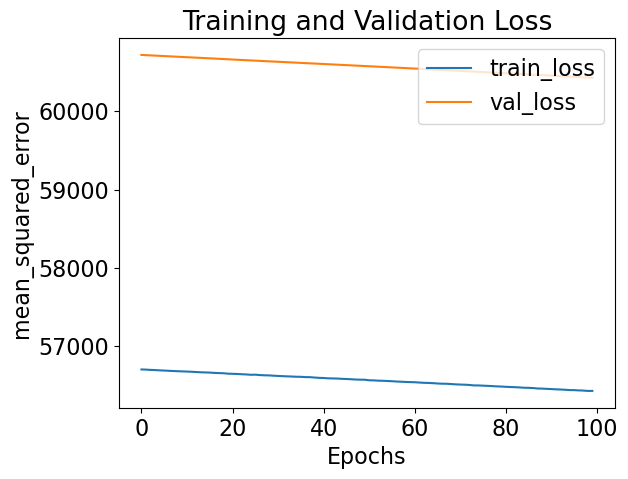

23/23 [==============================] - 0s 4ms/step


[I 2024-11-01 10:30:39,653] Trial 1 finished with value: 60427.81640625 and parameters: {'batch_size': 67, 'learning_rate': 4.849824517302431e-05, 'n_layers': 1, 'n_units_l0': 50, 'dropout_l0': 0.021762982671248376}. Best is trial 0 with value: 52016.44140625.


Block: verbose not specified in input, defaulting to 1


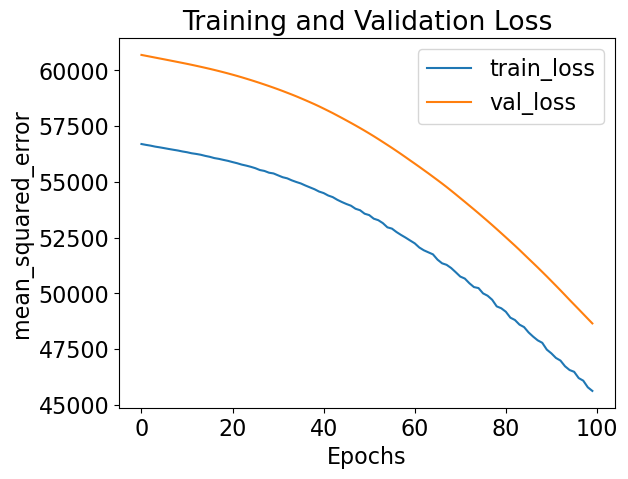

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:31:00,097] Trial 2 finished with value: 48656.80078125 and parameters: {'batch_size': 88, 'learning_rate': 0.0008135339538862242, 'n_layers': 1, 'n_units_l0': 48, 'dropout_l0': 0.16292234323993543}. Best is trial 2 with value: 48656.80078125.


Block: verbose not specified in input, defaulting to 1


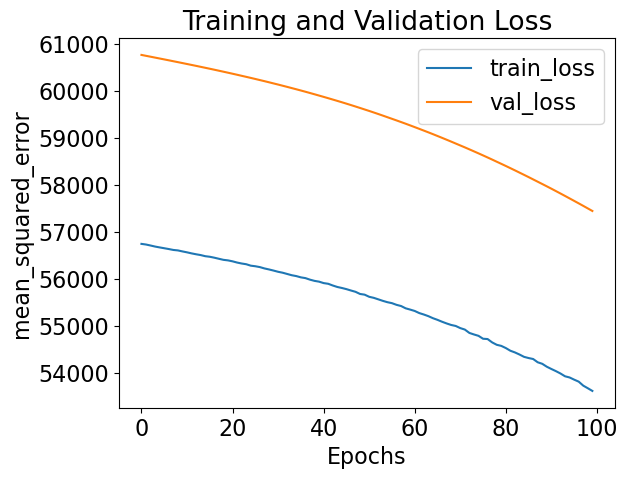

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:31:23,242] Trial 3 finished with value: 57445.8515625 and parameters: {'batch_size': 55, 'learning_rate': 0.00024307484463730674, 'n_layers': 1, 'n_units_l0': 63, 'dropout_l0': 0.18034906053791705}. Best is trial 2 with value: 48656.80078125.


Block: verbose not specified in input, defaulting to 1


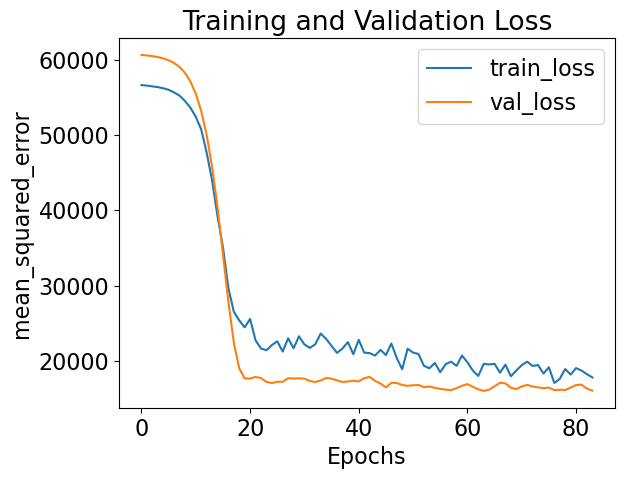

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:31:38,527] Trial 4 finished with value: 16032.6708984375 and parameters: {'batch_size': 61, 'learning_rate': 0.0005336394191492996, 'n_layers': 5, 'n_units_l0': 12, 'dropout_l0': 0.3502460212618406, 'n_units_l1': 7, 'dropout_l1': 0.33078675900792665, 'n_units_l2': 36, 'dropout_l2': 0.23212471571636395, 'n_units_l3': 56, 'dropout_l3': 0.47445694882383765, 'n_units_l4': 42, 'dropout_l4': 0.49756927294965403}. Best is trial 4 with value: 16032.6708984375.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:31:42,560] Trial 5 pruned. Trial was pruned at epoch 13.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:31:43,819] Trial 6 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:31:47,026] Trial 7 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


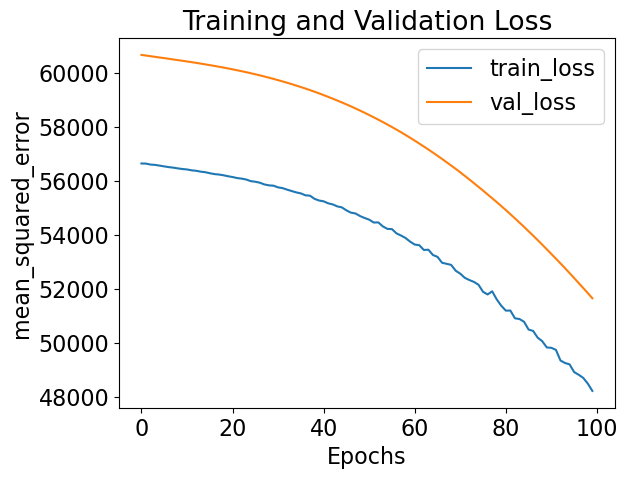

23/23 [==============================] - 0s 3ms/step


[I 2024-11-01 10:32:07,748] Trial 8 finished with value: 51658.2890625 and parameters: {'batch_size': 116, 'learning_rate': 0.00034269306069606236, 'n_layers': 2, 'n_units_l0': 9, 'dropout_l0': 0.17629833659239913, 'n_units_l1': 55, 'dropout_l1': 0.12634763524002757}. Best is trial 4 with value: 16032.6708984375.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-01 10:32:10,480] Trial 9 pruned. Trial was pruned at epoch 0.


All results from this run will be saved to demo_results\experiment0062
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


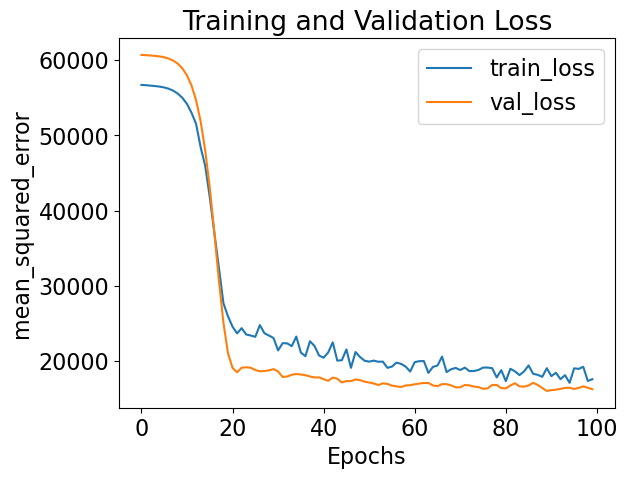

23/23 [==============================] - 0s 3ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...
CauseClusterer training complete.
Experiment training complete.
500


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [ ]:
tab = []

import tensorflow as tf
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

for i in [50, 100, 150, 200, 250, 300, 350, 400, 450, 500]:
    data = data.dropna()
    Y = (data['re78']-data['re75']).values.reshape(-1, 1)
    Y = pd.qcut(Y.flatten(), i, labels=False, duplicates='drop').reshape(-1, 1)
    X = data[['treat','age', 'education']].values
    import sklearn.preprocessing as skp
    scaler = skp.StandardScaler()
    X = scaler.fit_transform(X)
    in_sample_idx, out_sample_idx = train_test_split(np.arange(X.shape[0]),
                                                    train_size=0.75,
                                                    random_state=42)

    study = optuna.create_study(direction="minimize", pruner=optuna.pruners.MedianPruner())
    study.optimize(objective, n_trials=10)

    pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
    complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

    trial = study.best_trial

    def build_optimized_model():
        # vary number of layers
        n_layers = study.best_trial.params['n_layers']
        model = Sequential()
        for i in range(n_layers):
            # vary size of each layer
            num_hidden = study.best_trial.params[f'n_units_l{i}']
            model.add(Dense(num_hidden, activation="relu"))
            # vary amount of dropout for each layer
            dropout = study.best_trial.params[f'dropout_l{i}']
            model.add(Dropout(rate=dropout))

        # add output layer with size of target
        model.add(Dense(Y.shape[1], activation="linear"))
        return model

    data_info = {'X_dims': X.shape, 'Y_dims': Y.shape, 'Y_type': 'categorical'}

    CDE_params = {
    'model'        : 'CondExpDIY',
    'model_params' : {
        'build_network'   : build_optimized_model,
        'batch_size'      : study.best_trial.params['batch_size'],
        'n_epochs'        : 100,
        'optimizer'       : 'adam',
        'opt_config'      : {'learning_rate' : study.best_trial.params['learning_rate']},
        'loss'            : 'mean_squared_error',
        'best'            : True,
        'verbose'         : 0,
        'early_stopping'  : True
    }
    }

    cause_cluster_params =  {'model' : 'KMeans', 'model_params' : {'n_clusters' : 4},
        'verbose' : 0}
    # effect_cluster_params = {'model' : 'KMeans', 'model_params' : {'n_clusters' : 3},
    #     'verbose' : 0}

    block_names = ['CondDensityEstimator', 'CauseClusterer']
    block_params = [CDE_params, cause_cluster_params]

    my_exp = Experiment(X_train=X, Y_train=Y, data_info=data_info,
                    in_sample_idx=in_sample_idx, out_sample_idx=out_sample_idx,
                    block_names=block_names, block_params=block_params,
                    results_path='demo_results')

    train_results = my_exp.train()

    import pandas as pd
    data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
    data_lbs = pd.DataFrame(train_results['CauseClusterer']['x_lbls'])
    data_lbs.to_csv('data_lbs_'+str(i)+'.csv')
    data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']
    # for each cluster, calculate the difference between the proportion of treated and untreated units
    treat_max = data_cluster.groupby('cluster')['treat'].mean().min()
    tab.append([i, treat_max])
    print(i)

[I 2024-11-02 01:48:43,555] A new study created in memory with name: no-name-f9bc541b-425c-4e21-842d-9d0b098c44fa


Block: verbose not specified in input, defaulting to 1





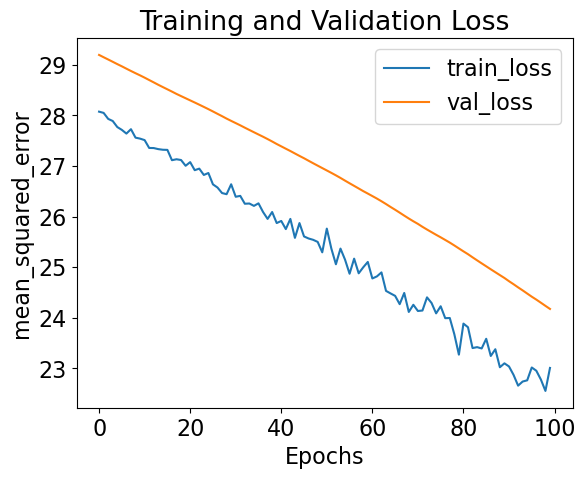

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:49:17,964] Trial 0 finished with value: 24.175857543945312 and parameters: {'batch_size': 67, 'learning_rate': 1.4748145683822622e-05, 'n_layers': 5, 'n_units_l0': 26, 'dropout_l0': 0.4603328712658913, 'n_units_l1': 13, 'dropout_l1': 0.26927299629026447, 'n_units_l2': 10, 'dropout_l2': 0.3977384510338176, 'n_units_l3': 502, 'dropout_l3': 0.26466296442428305, 'n_units_l4': 5, 'dropout_l4': 0.285883193825963}. Best is trial 0 with value: 24.175857543945312.


Block: verbose not specified in input, defaulting to 1


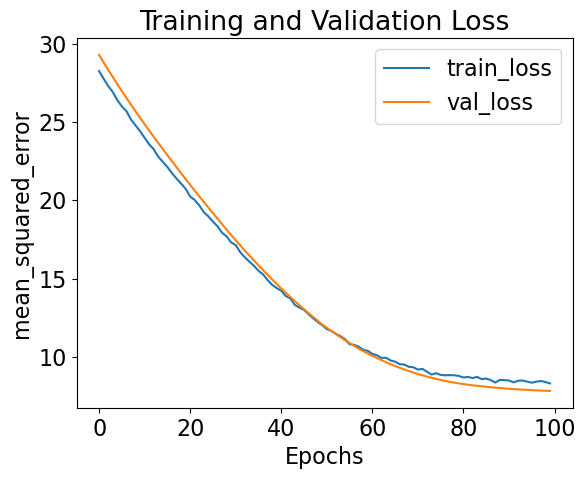

23/23 [==============================] - 0s 1ms/step


[I 2024-11-02 01:49:32,315] Trial 1 finished with value: 7.839563846588135 and parameters: {'batch_size': 86, 'learning_rate': 0.00022438845384852626, 'n_layers': 1, 'n_units_l0': 204, 'dropout_l0': 0.19134897606877888}. Best is trial 1 with value: 7.839563846588135.


Block: verbose not specified in input, defaulting to 1


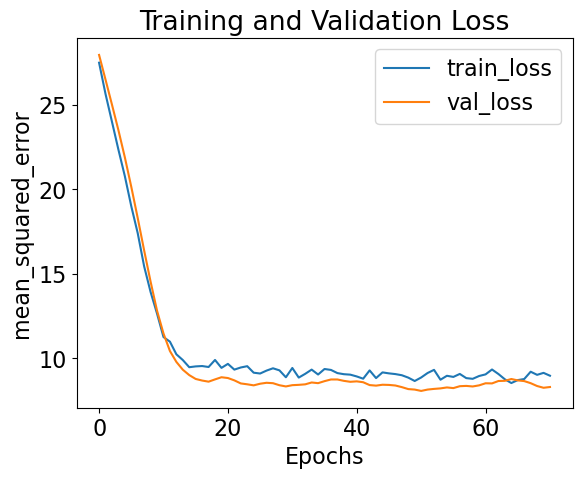

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:49:40,680] Trial 2 finished with value: 8.307207107543945 and parameters: {'batch_size': 77, 'learning_rate': 0.00016073987972035737, 'n_layers': 3, 'n_units_l0': 85, 'dropout_l0': 0.43351912849259056, 'n_units_l1': 156, 'dropout_l1': 0.46967466458625967, 'n_units_l2': 298, 'dropout_l2': 0.1849000324490735}. Best is trial 1 with value: 7.839563846588135.


Block: verbose not specified in input, defaulting to 1


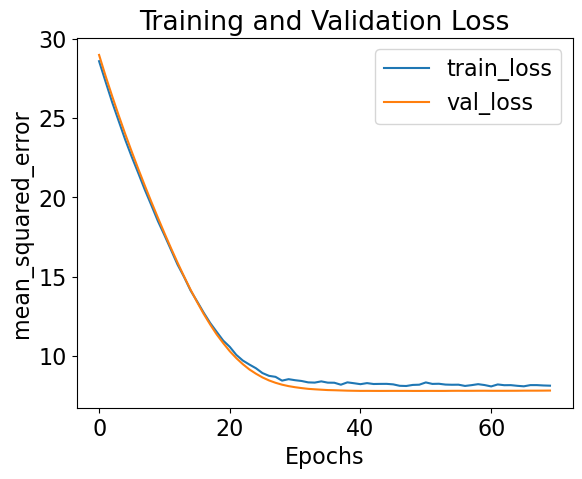

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:49:48,834] Trial 3 finished with value: 7.826573848724365 and parameters: {'batch_size': 82, 'learning_rate': 0.0009518014975396703, 'n_layers': 1, 'n_units_l0': 94, 'dropout_l0': 0.05787532687276442}. Best is trial 3 with value: 7.826573848724365.


Block: verbose not specified in input, defaulting to 1


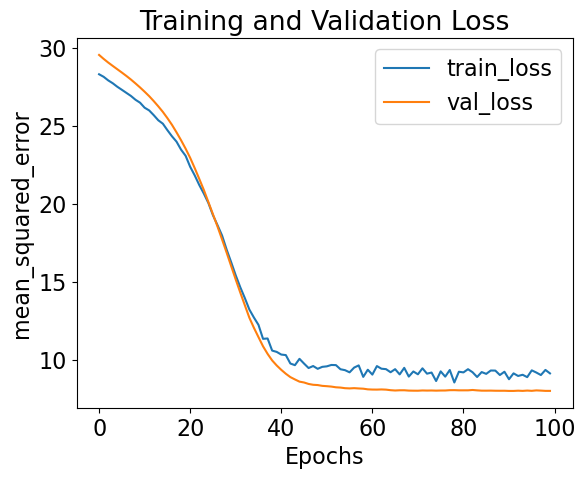

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:50:09,356] Trial 4 finished with value: 7.989612579345703 and parameters: {'batch_size': 20, 'learning_rate': 1.3928613906607346e-05, 'n_layers': 5, 'n_units_l0': 131, 'dropout_l0': 0.03282219733054598, 'n_units_l1': 85, 'dropout_l1': 0.18303687532710372, 'n_units_l2': 74, 'dropout_l2': 0.006841211316465978, 'n_units_l3': 102, 'dropout_l3': 0.45695060763129397, 'n_units_l4': 87, 'dropout_l4': 0.04701325888227437}. Best is trial 3 with value: 7.826573848724365.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:50:11,331] Trial 5 pruned. Trial was pruned at epoch 8.


Block: verbose not specified in input, defaulting to 1


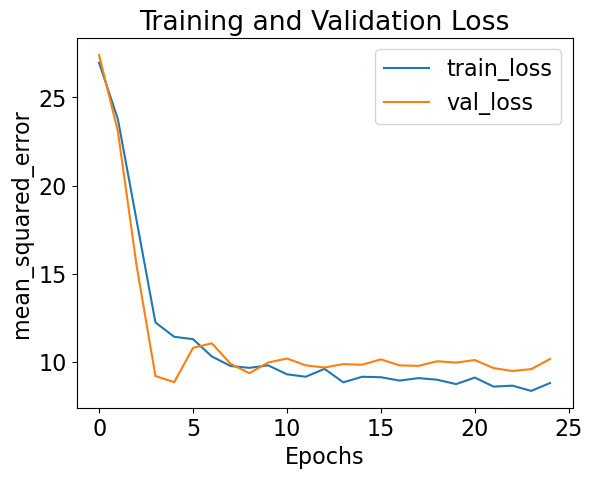

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:50:15,481] Trial 6 finished with value: 10.168706893920898 and parameters: {'batch_size': 70, 'learning_rate': 0.0009010417554939073, 'n_layers': 5, 'n_units_l0': 23, 'dropout_l0': 0.4869008346287019, 'n_units_l1': 181, 'dropout_l1': 0.15119964703619954, 'n_units_l2': 10, 'dropout_l2': 0.2810328974436573, 'n_units_l3': 20, 'dropout_l3': 0.10776761742967778, 'n_units_l4': 243, 'dropout_l4': 0.32746063156619437}. Best is trial 3 with value: 7.826573848724365.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:50:18,105] Trial 7 pruned. Trial was pruned at epoch 6.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:50:19,452] Trial 8 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:50:21,465] Trial 9 pruned. Trial was pruned at epoch 2.


All results from this run will be saved to demo_results\experiment0066
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


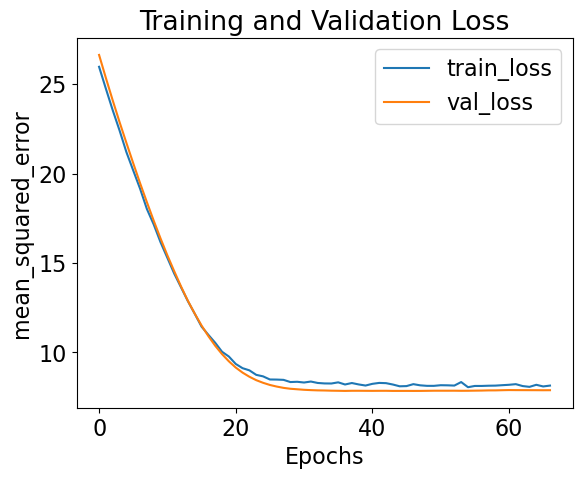

23/23 [==============================] - 0s 2ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-02 01:50:31,865] A new study created in memory with name: no-name-6b2f99ef-903b-450c-92c9-07023a5143b2


CauseClusterer training complete.
Experiment training complete.
10
Block: verbose not specified in input, defaulting to 1


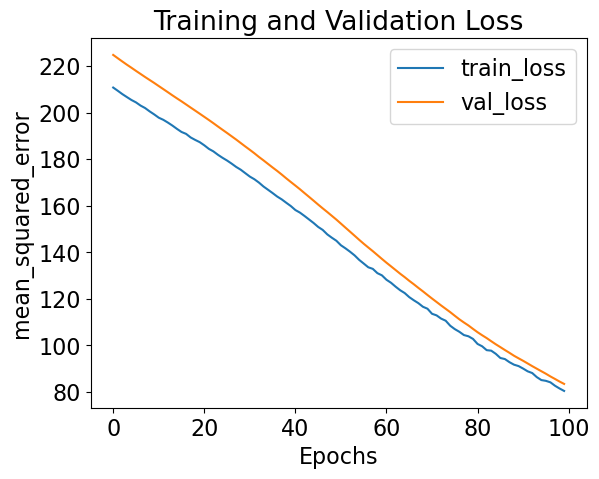

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:50:49,349] Trial 0 finished with value: 83.47692108154297 and parameters: {'batch_size': 30, 'learning_rate': 7.153479119965441e-05, 'n_layers': 1, 'n_units_l0': 340, 'dropout_l0': 0.2572809655132042}. Best is trial 0 with value: 83.47692108154297.


Block: verbose not specified in input, defaulting to 1


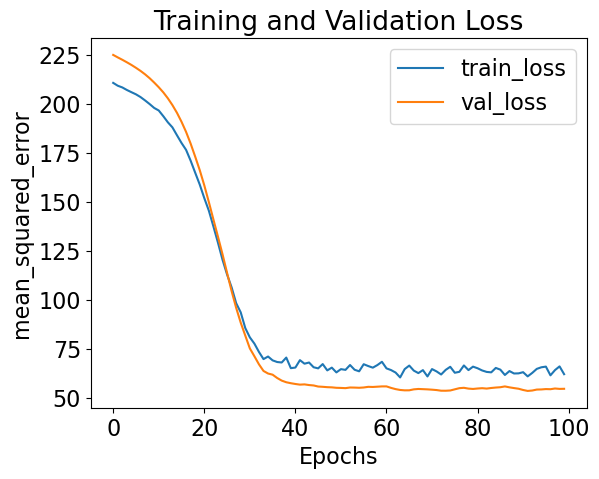

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:51:03,450] Trial 1 finished with value: 54.49738693237305 and parameters: {'batch_size': 60, 'learning_rate': 5.854382541400915e-05, 'n_layers': 4, 'n_units_l0': 61, 'dropout_l0': 0.040756209796157794, 'n_units_l1': 175, 'dropout_l1': 0.01555951009062656, 'n_units_l2': 234, 'dropout_l2': 0.4014618591223838, 'n_units_l3': 37, 'dropout_l3': 0.3372849474168681}. Best is trial 1 with value: 54.49738693237305.


Block: verbose not specified in input, defaulting to 1


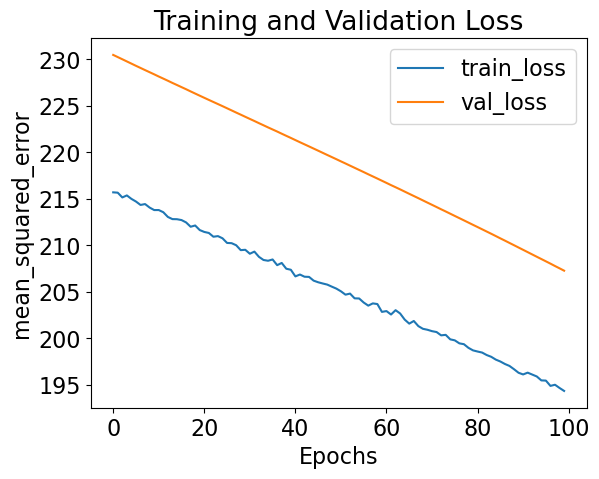

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:51:21,088] Trial 2 finished with value: 207.28982543945312 and parameters: {'batch_size': 24, 'learning_rate': 1.8518259598664083e-05, 'n_layers': 2, 'n_units_l0': 8, 'dropout_l0': 0.14821914421161048, 'n_units_l1': 38, 'dropout_l1': 0.052168426181647576}. Best is trial 1 with value: 54.49738693237305.


Block: verbose not specified in input, defaulting to 1


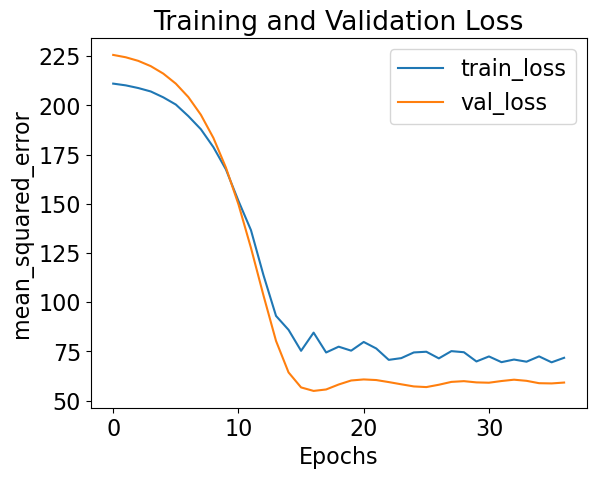

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:51:26,451] Trial 3 finished with value: 59.12522506713867 and parameters: {'batch_size': 110, 'learning_rate': 0.0005921207614256556, 'n_layers': 5, 'n_units_l0': 341, 'dropout_l0': 0.4801181055284546, 'n_units_l1': 11, 'dropout_l1': 0.05486479351501833, 'n_units_l2': 50, 'dropout_l2': 0.3213305352761072, 'n_units_l3': 10, 'dropout_l3': 0.34538360279232816, 'n_units_l4': 48, 'dropout_l4': 0.14252563711969474}. Best is trial 1 with value: 54.49738693237305.


Block: verbose not specified in input, defaulting to 1


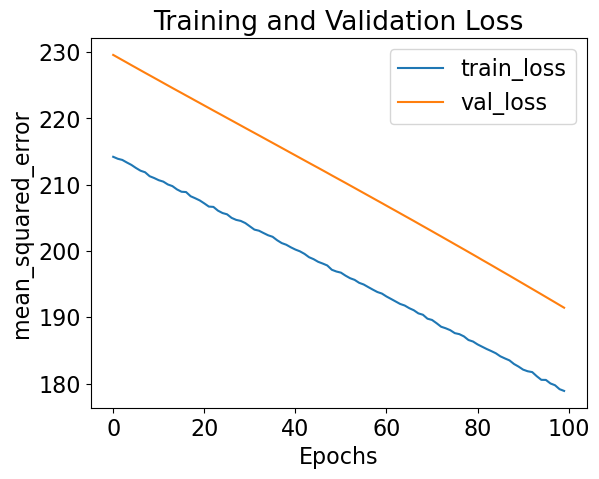

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:51:42,074] Trial 4 finished with value: 191.44088745117188 and parameters: {'batch_size': 61, 'learning_rate': 4.358137228460056e-05, 'n_layers': 1, 'n_units_l0': 260, 'dropout_l0': 0.16960653272532733}. Best is trial 1 with value: 54.49738693237305.


Block: verbose not specified in input, defaulting to 1


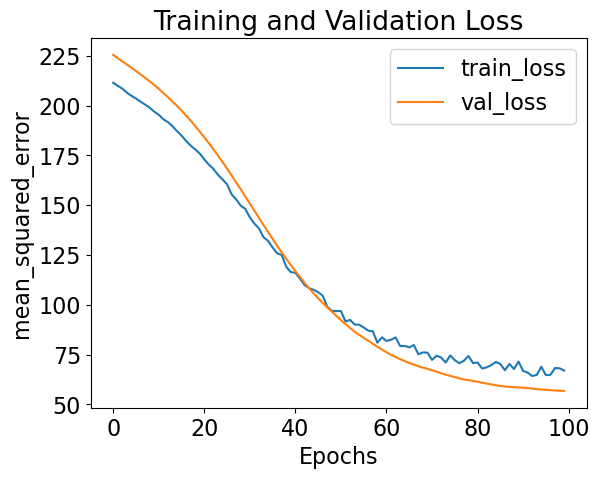

23/23 [==============================] - 0s 3ms/step


[I 2024-11-02 01:51:56,618] Trial 5 finished with value: 56.774845123291016 and parameters: {'batch_size': 104, 'learning_rate': 0.000252632542975636, 'n_layers': 2, 'n_units_l0': 10, 'dropout_l0': 0.26238300584077834, 'n_units_l1': 229, 'dropout_l1': 0.46895959846349955}. Best is trial 1 with value: 54.49738693237305.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:51:57,970] Trial 6 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:51:59,603] Trial 7 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:52:00,354] Trial 8 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:52:01,704] Trial 9 pruned. Trial was pruned at epoch 0.


All results from this run will be saved to demo_results\experiment0067
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


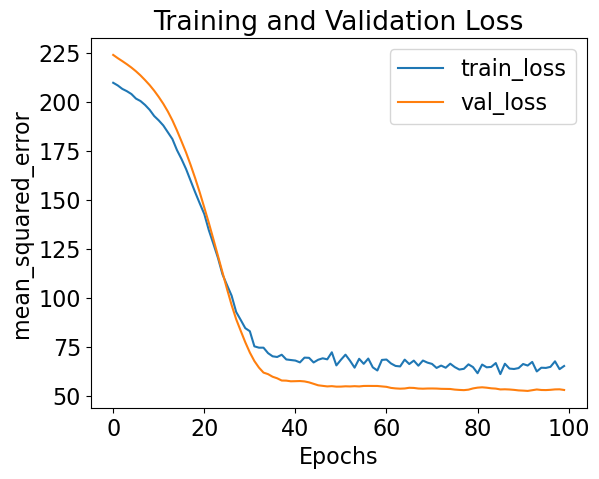

23/23 [==============================] - 0s 2ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-02 01:52:17,135] A new study created in memory with name: no-name-755414ee-c26d-49a8-b5e4-7a05f9bf3922


CauseClusterer training complete.
Experiment training complete.
30
Block: verbose not specified in input, defaulting to 1


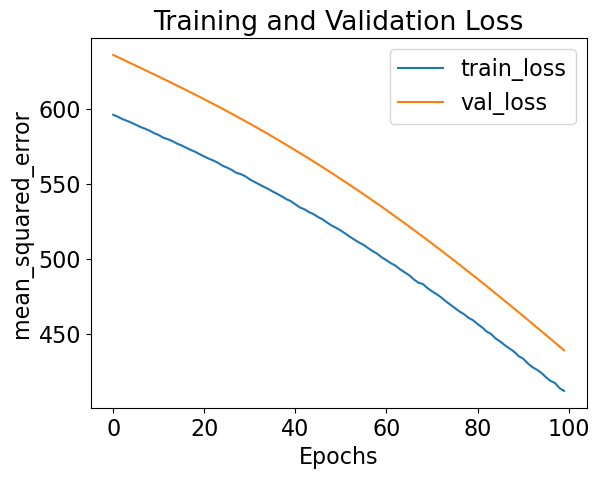

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:52:32,503] Trial 0 finished with value: 438.88482666015625 and parameters: {'batch_size': 39, 'learning_rate': 0.00012825431395709896, 'n_layers': 1, 'n_units_l0': 72, 'dropout_l0': 0.060576448031608165}. Best is trial 0 with value: 438.88482666015625.


Block: verbose not specified in input, defaulting to 1


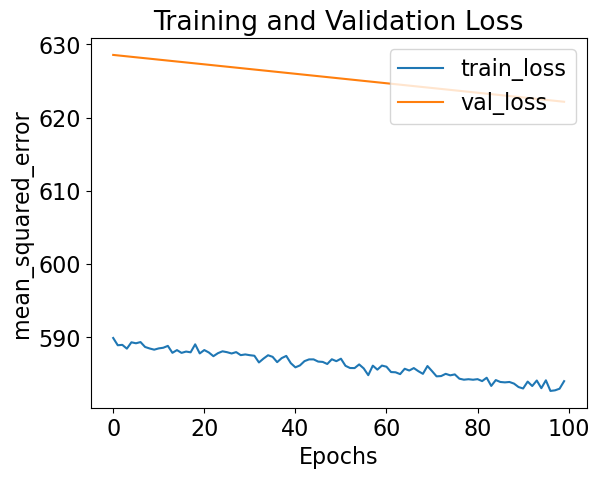

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:52:45,790] Trial 1 finished with value: 622.1715087890625 and parameters: {'batch_size': 117, 'learning_rate': 2.6619313703994575e-05, 'n_layers': 1, 'n_units_l0': 23, 'dropout_l0': 0.15815935142320897}. Best is trial 0 with value: 438.88482666015625.


Block: verbose not specified in input, defaulting to 1


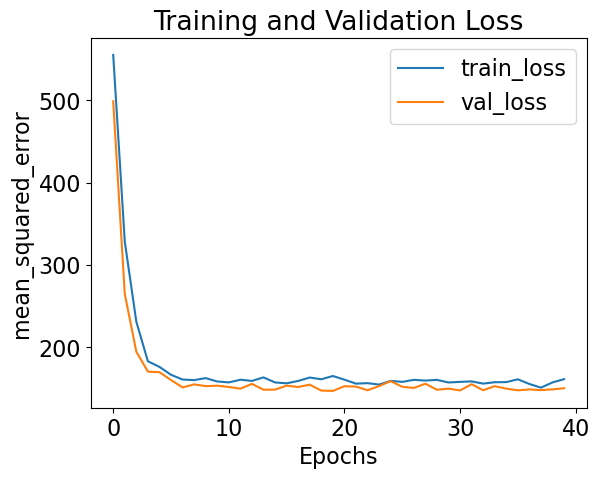

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:52:53,303] Trial 2 finished with value: 150.4055633544922 and parameters: {'batch_size': 17, 'learning_rate': 0.0006065241713508733, 'n_layers': 4, 'n_units_l0': 5, 'dropout_l0': 0.07564857060973323, 'n_units_l1': 140, 'dropout_l1': 0.08819873203494755, 'n_units_l2': 72, 'dropout_l2': 0.2595114756218045, 'n_units_l3': 404, 'dropout_l3': 0.21775747248680194}. Best is trial 2 with value: 150.4055633544922.


Block: verbose not specified in input, defaulting to 1


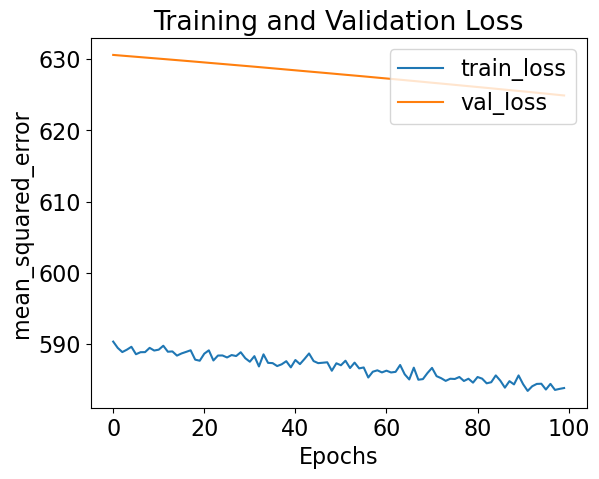

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:53:08,055] Trial 3 finished with value: 624.8948364257812 and parameters: {'batch_size': 65, 'learning_rate': 1.5373846883160465e-05, 'n_layers': 3, 'n_units_l0': 6, 'dropout_l0': 0.11050373291192389, 'n_units_l1': 10, 'dropout_l1': 0.1216188477281685, 'n_units_l2': 8, 'dropout_l2': 0.39278602460791945}. Best is trial 2 with value: 150.4055633544922.


Block: verbose not specified in input, defaulting to 1


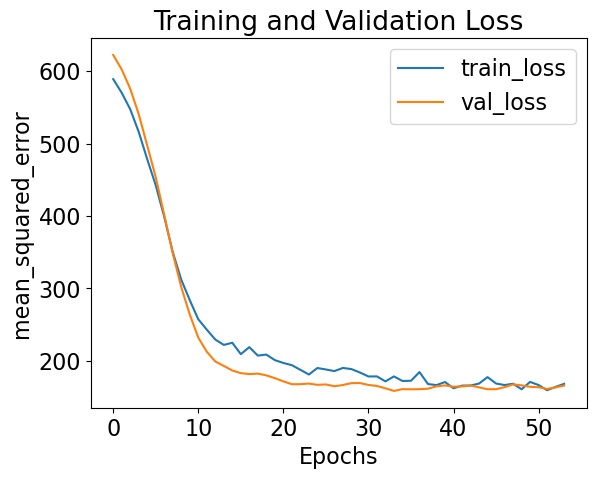

23/23 [==============================] - 0s 1ms/step


[I 2024-11-02 01:53:17,057] Trial 4 finished with value: 165.93753051757812 and parameters: {'batch_size': 36, 'learning_rate': 0.0002226191770768683, 'n_layers': 3, 'n_units_l0': 7, 'dropout_l0': 0.3919449492756625, 'n_units_l1': 313, 'dropout_l1': 0.3970215543634025, 'n_units_l2': 170, 'dropout_l2': 0.47611739711275003}. Best is trial 2 with value: 150.4055633544922.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:53:18,138] Trial 5 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:53:18,918] Trial 6 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:53:19,685] Trial 7 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:53:20,991] Trial 8 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:53:22,005] Trial 9 pruned. Trial was pruned at epoch 0.


All results from this run will be saved to demo_results\experiment0068
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


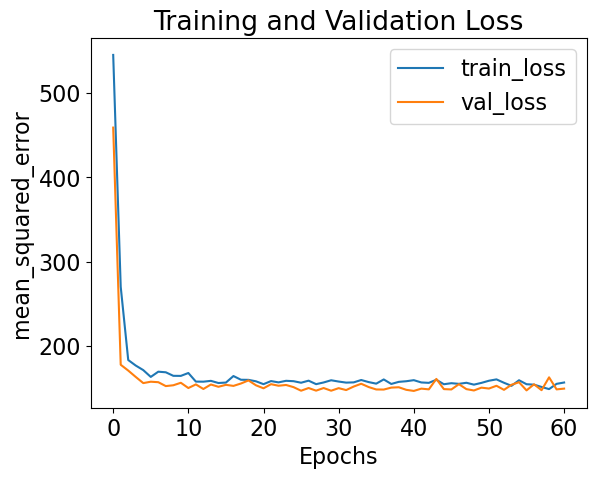

23/23 [==============================] - 0s 2ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-02 01:53:32,425] A new study created in memory with name: no-name-198a904b-4057-4724-ac1d-3be3cdd81390


CauseClusterer training complete.
Experiment training complete.
50
Block: verbose not specified in input, defaulting to 1


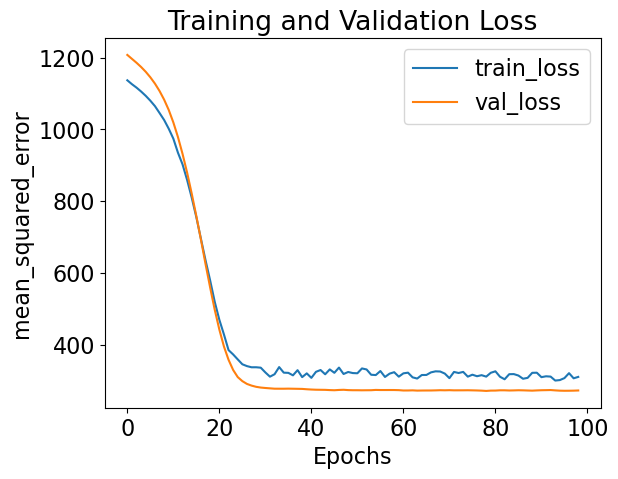

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:53:45,034] Trial 0 finished with value: 271.977783203125 and parameters: {'batch_size': 72, 'learning_rate': 0.0001895316990085236, 'n_layers': 3, 'n_units_l0': 95, 'dropout_l0': 0.2871342218586751, 'n_units_l1': 201, 'dropout_l1': 0.19739559997614792, 'n_units_l2': 33, 'dropout_l2': 0.18411872952194325}. Best is trial 0 with value: 271.977783203125.


Block: verbose not specified in input, defaulting to 1


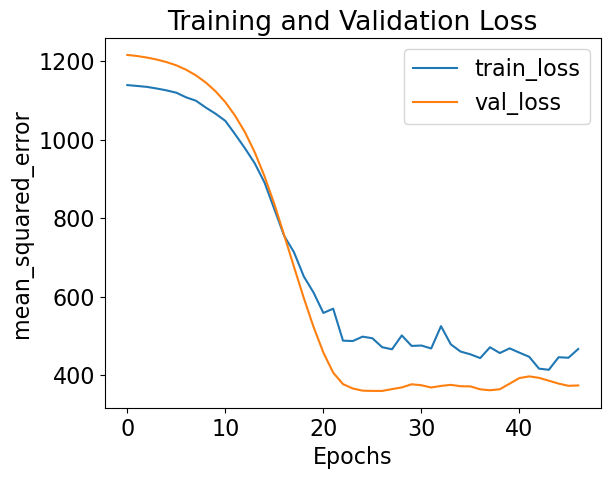

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:53:52,302] Trial 1 finished with value: 373.94378662109375 and parameters: {'batch_size': 107, 'learning_rate': 0.00027258068452646716, 'n_layers': 5, 'n_units_l0': 378, 'dropout_l0': 0.2685996849404733, 'n_units_l1': 108, 'dropout_l1': 0.36207976045602874, 'n_units_l2': 8, 'dropout_l2': 0.37079428987847013, 'n_units_l3': 5, 'dropout_l3': 0.23575523469547732, 'n_units_l4': 106, 'dropout_l4': 0.05480207117700925}. Best is trial 0 with value: 271.977783203125.


Block: verbose not specified in input, defaulting to 1


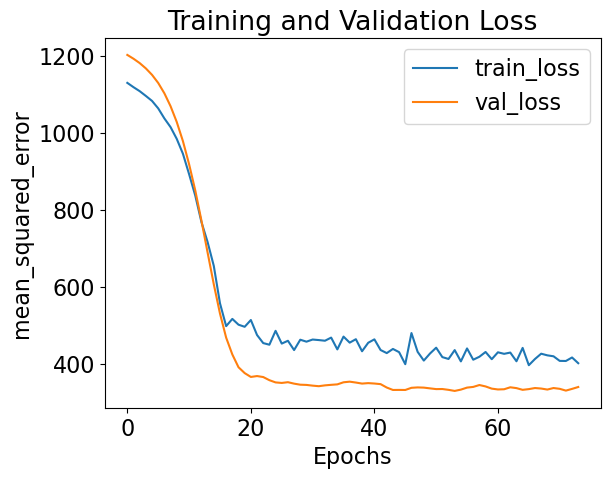

23/23 [==============================] - 0s 1ms/step


[I 2024-11-02 01:54:01,939] Trial 2 finished with value: 339.6634521484375 and parameters: {'batch_size': 42, 'learning_rate': 0.00026390793368795716, 'n_layers': 4, 'n_units_l0': 9, 'dropout_l0': 0.286887801008781, 'n_units_l1': 395, 'dropout_l1': 0.06103408060354415, 'n_units_l2': 6, 'dropout_l2': 0.3675566865986088, 'n_units_l3': 11, 'dropout_l3': 0.09623249468896067}. Best is trial 0 with value: 271.977783203125.


Block: verbose not specified in input, defaulting to 1


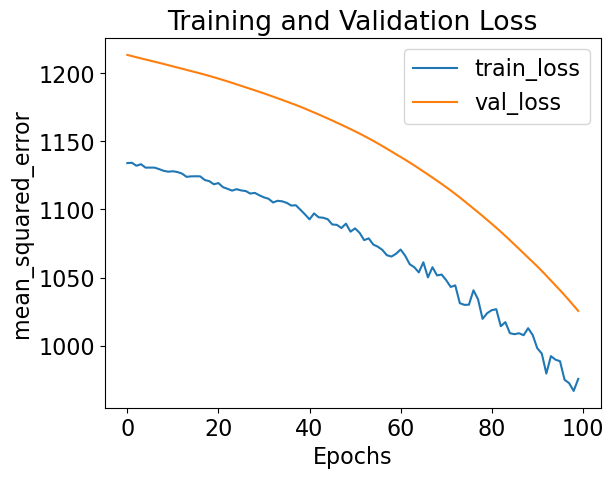

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:54:19,142] Trial 3 finished with value: 1025.4654541015625 and parameters: {'batch_size': 80, 'learning_rate': 8.378860455160496e-05, 'n_layers': 3, 'n_units_l0': 5, 'dropout_l0': 0.3394275180572232, 'n_units_l1': 128, 'dropout_l1': 0.4644419392247608, 'n_units_l2': 5, 'dropout_l2': 0.45883820947766063}. Best is trial 0 with value: 271.977783203125.


Block: verbose not specified in input, defaulting to 1


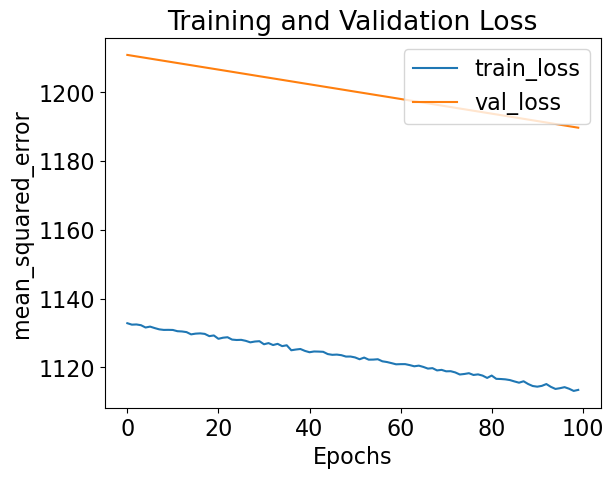

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:54:39,549] Trial 4 finished with value: 1189.739990234375 and parameters: {'batch_size': 79, 'learning_rate': 2.688350230058925e-05, 'n_layers': 1, 'n_units_l0': 65, 'dropout_l0': 0.10309115847892625}. Best is trial 0 with value: 271.977783203125.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:54:42,227] Trial 5 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


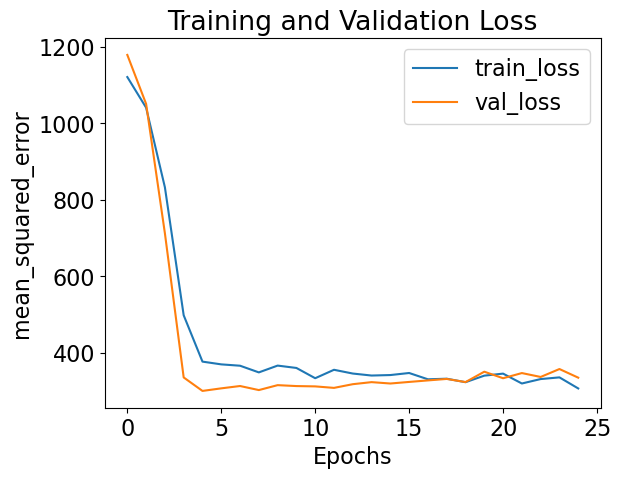

23/23 [==============================] - 0s 5ms/step


[I 2024-11-02 01:54:51,688] Trial 6 finished with value: 335.1910705566406 and parameters: {'batch_size': 29, 'learning_rate': 0.00033637940873018364, 'n_layers': 4, 'n_units_l0': 358, 'dropout_l0': 0.24334311956351656, 'n_units_l1': 11, 'dropout_l1': 0.49775800628671557, 'n_units_l2': 379, 'dropout_l2': 0.2825712132552421, 'n_units_l3': 93, 'dropout_l3': 0.45943730811003236}. Best is trial 0 with value: 271.977783203125.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:54:53,104] Trial 7 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:54:55,742] Trial 8 pruned. Trial was pruned at epoch 1.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:54:58,593] Trial 9 pruned. Trial was pruned at epoch 0.


All results from this run will be saved to demo_results\experiment0069
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


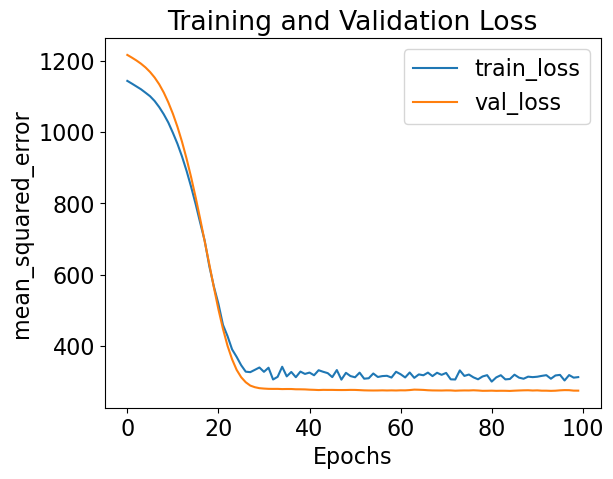

23/23 [==============================] - 0s 3ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-02 01:55:21,151] A new study created in memory with name: no-name-a96ddd0f-4ada-4bb7-8388-585d26527be2


CauseClusterer training complete.
Experiment training complete.
70
Block: verbose not specified in input, defaulting to 1


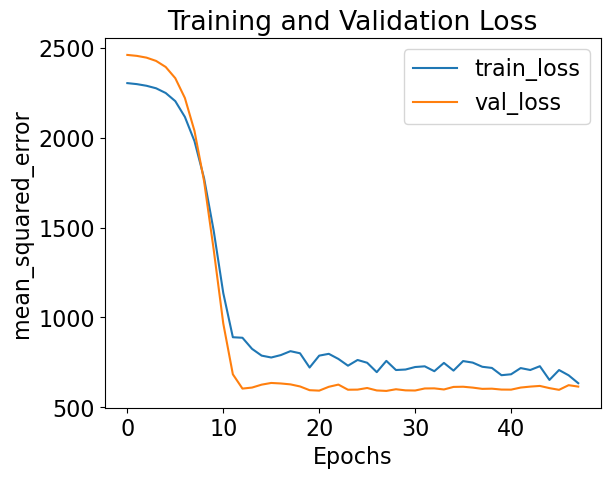

23/23 [==============================] - 0s 5ms/step


[I 2024-11-02 01:55:35,327] Trial 0 finished with value: 615.9542236328125 and parameters: {'batch_size': 56, 'learning_rate': 0.0002699547585648572, 'n_layers': 5, 'n_units_l0': 108, 'dropout_l0': 0.42534185929117785, 'n_units_l1': 8, 'dropout_l1': 0.2911663905388177, 'n_units_l2': 380, 'dropout_l2': 0.19392410018832384, 'n_units_l3': 189, 'dropout_l3': 0.029418463652914617, 'n_units_l4': 15, 'dropout_l4': 0.16306157909435803}. Best is trial 0 with value: 615.9542236328125.


Block: verbose not specified in input, defaulting to 1


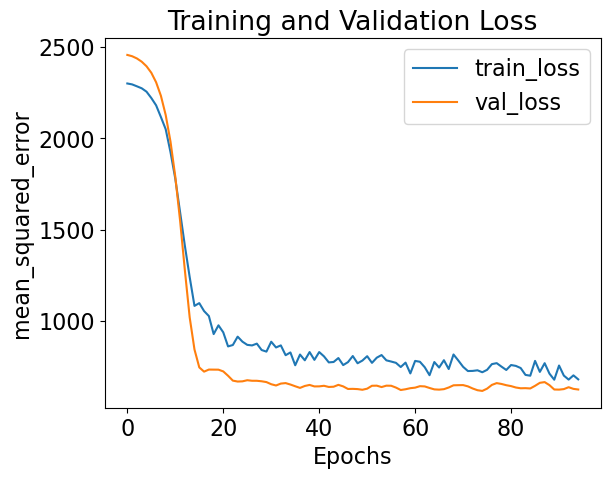

23/23 [==============================] - 0s 4ms/step


[I 2024-11-02 01:55:53,244] Trial 1 finished with value: 624.437255859375 and parameters: {'batch_size': 95, 'learning_rate': 0.0006778592866979537, 'n_layers': 5, 'n_units_l0': 12, 'dropout_l0': 0.328619492201751, 'n_units_l1': 106, 'dropout_l1': 0.44678189532663815, 'n_units_l2': 134, 'dropout_l2': 0.23349596817022467, 'n_units_l3': 5, 'dropout_l3': 0.053359658577030566, 'n_units_l4': 27, 'dropout_l4': 0.3704639417199749}. Best is trial 0 with value: 615.9542236328125.


Block: verbose not specified in input, defaulting to 1


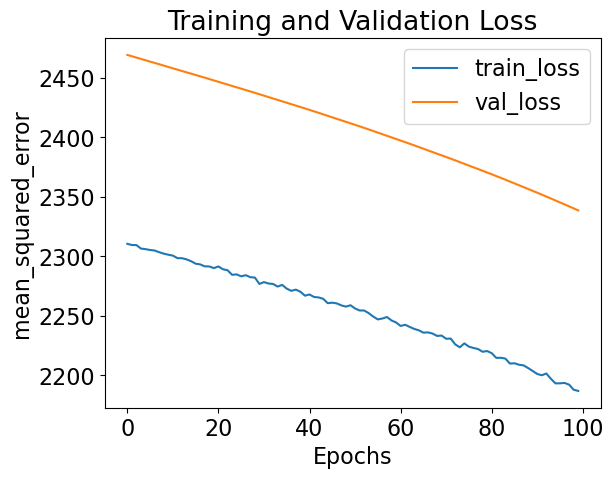

23/23 [==============================] - 0s 3ms/step


[I 2024-11-02 01:56:23,932] Trial 2 finished with value: 2338.633056640625 and parameters: {'batch_size': 24, 'learning_rate': 1.1764632984547818e-05, 'n_layers': 2, 'n_units_l0': 38, 'dropout_l0': 0.45825106441065533, 'n_units_l1': 99, 'dropout_l1': 0.08440570066040198}. Best is trial 0 with value: 615.9542236328125.


Block: verbose not specified in input, defaulting to 1


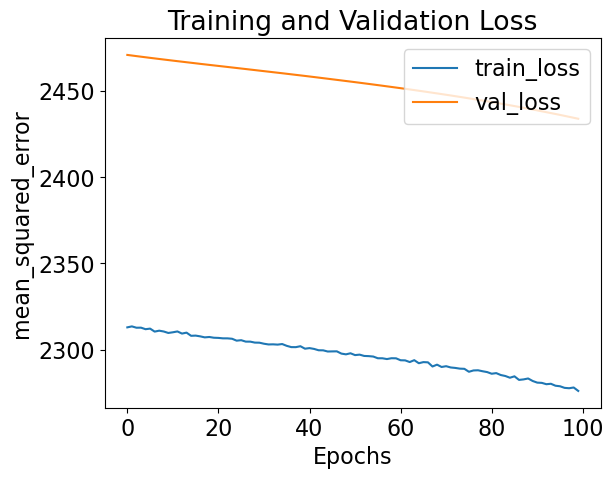

23/23 [==============================] - 0s 4ms/step


[I 2024-11-02 01:56:50,333] Trial 3 finished with value: 2434.040283203125 and parameters: {'batch_size': 64, 'learning_rate': 1.5036932305849099e-05, 'n_layers': 3, 'n_units_l0': 121, 'dropout_l0': 0.29719280081547195, 'n_units_l1': 22, 'dropout_l1': 0.01304974704318912, 'n_units_l2': 67, 'dropout_l2': 0.3954656692946753}. Best is trial 0 with value: 615.9542236328125.


Block: verbose not specified in input, defaulting to 1


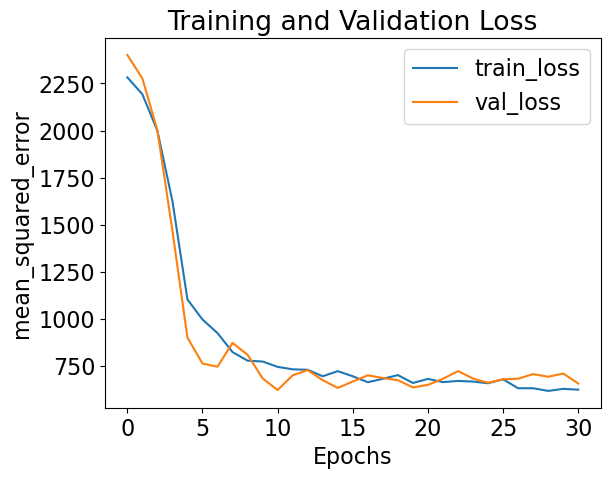

23/23 [==============================] - 0s 5ms/step


[I 2024-11-02 01:57:02,173] Trial 4 finished with value: 656.2194213867188 and parameters: {'batch_size': 106, 'learning_rate': 0.00037345237298446436, 'n_layers': 5, 'n_units_l0': 18, 'dropout_l0': 0.40652509196668996, 'n_units_l1': 191, 'dropout_l1': 0.23211309303593136, 'n_units_l2': 440, 'dropout_l2': 0.08193761375226832, 'n_units_l3': 389, 'dropout_l3': 0.35794616155013886, 'n_units_l4': 306, 'dropout_l4': 0.09198007151892396}. Best is trial 0 with value: 615.9542236328125.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:57:04,123] Trial 5 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:57:06,575] Trial 6 pruned. Trial was pruned at epoch 1.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:57:08,641] Trial 7 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:57:10,774] Trial 8 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:57:11,924] Trial 9 pruned. Trial was pruned at epoch 0.


All results from this run will be saved to demo_results\experiment0070
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


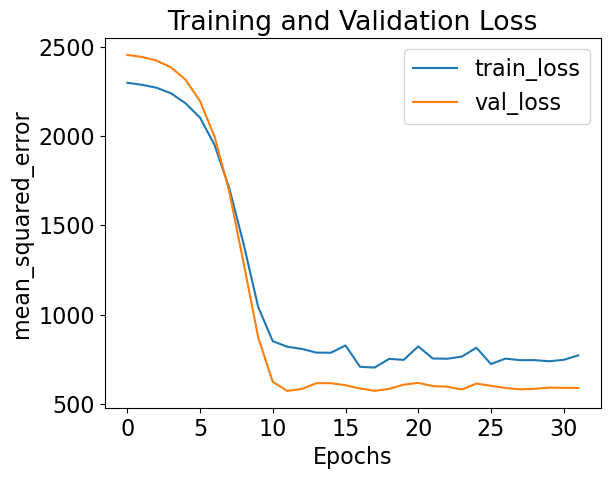

23/23 [==============================] - 0s 5ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-02 01:57:21,374] A new study created in memory with name: no-name-e277f9da-cc5f-47c8-88e1-eeffaa47d339


CauseClusterer training complete.
Experiment training complete.
100
Block: verbose not specified in input, defaulting to 1


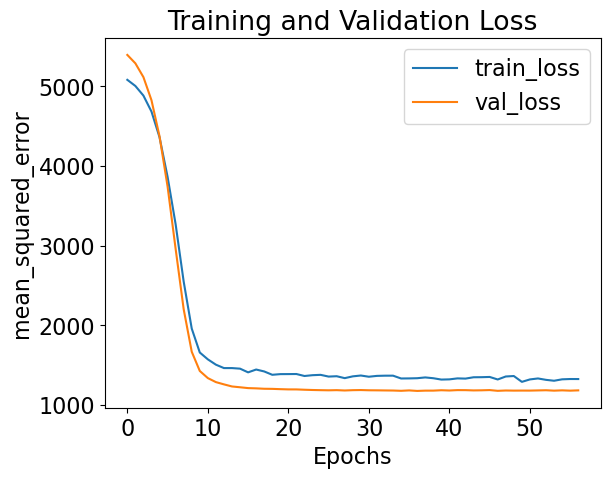

23/23 [==============================] - 0s 4ms/step


[I 2024-11-02 01:57:36,595] Trial 0 finished with value: 1185.9820556640625 and parameters: {'batch_size': 29, 'learning_rate': 0.0004309765326863688, 'n_layers': 3, 'n_units_l0': 7, 'dropout_l0': 0.0059847779224953546, 'n_units_l1': 97, 'dropout_l1': 0.06844067411100363, 'n_units_l2': 148, 'dropout_l2': 0.29144372342099234}. Best is trial 0 with value: 1185.9820556640625.


Block: verbose not specified in input, defaulting to 1


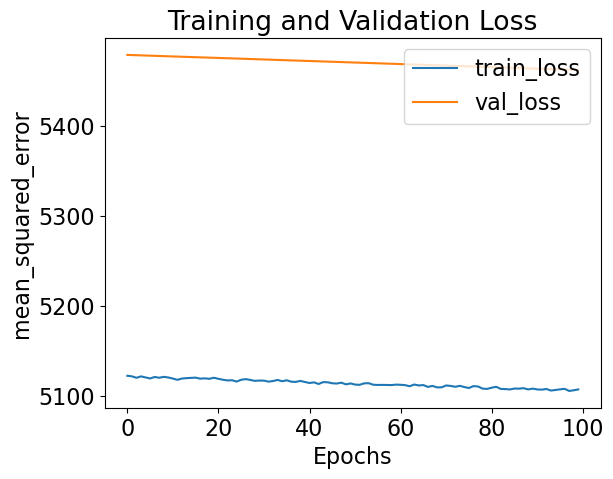

23/23 [==============================] - 0s 4ms/step


[I 2024-11-02 01:58:01,718] Trial 1 finished with value: 5462.0927734375 and parameters: {'batch_size': 41, 'learning_rate': 1.1240018277645484e-05, 'n_layers': 1, 'n_units_l0': 12, 'dropout_l0': 0.05775230959290928}. Best is trial 0 with value: 1185.9820556640625.


Block: verbose not specified in input, defaulting to 1


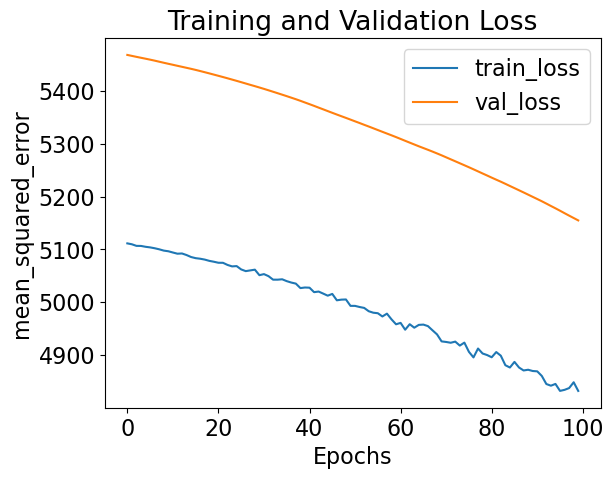

23/23 [==============================] - 0s 4ms/step


[I 2024-11-02 01:58:27,953] Trial 2 finished with value: 5154.73876953125 and parameters: {'batch_size': 61, 'learning_rate': 3.646671522886089e-05, 'n_layers': 3, 'n_units_l0': 244, 'dropout_l0': 0.02847364674965791, 'n_units_l1': 12, 'dropout_l1': 0.1795860119591226, 'n_units_l2': 5, 'dropout_l2': 0.36263031950641933}. Best is trial 0 with value: 1185.9820556640625.


Block: verbose not specified in input, defaulting to 1


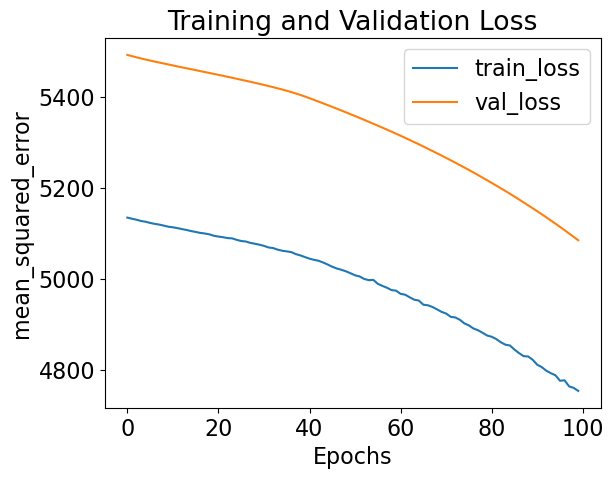

23/23 [==============================] - 0s 3ms/step


[I 2024-11-02 01:58:52,345] Trial 3 finished with value: 5084.56494140625 and parameters: {'batch_size': 100, 'learning_rate': 9.907676619608178e-05, 'n_layers': 3, 'n_units_l0': 10, 'dropout_l0': 0.012478350549050277, 'n_units_l1': 65, 'dropout_l1': 0.02244914537014281, 'n_units_l2': 5, 'dropout_l2': 0.04928012722709818}. Best is trial 0 with value: 1185.9820556640625.


Block: verbose not specified in input, defaulting to 1


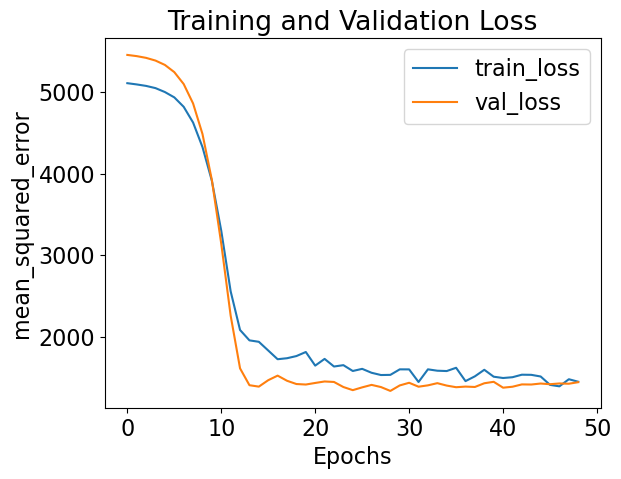

23/23 [==============================] - 0s 4ms/step


[I 2024-11-02 01:59:04,413] Trial 4 finished with value: 1441.67529296875 and parameters: {'batch_size': 83, 'learning_rate': 0.0007403699732401926, 'n_layers': 5, 'n_units_l0': 19, 'dropout_l0': 0.47315231994004203, 'n_units_l1': 56, 'dropout_l1': 0.01773852874281956, 'n_units_l2': 22, 'dropout_l2': 0.13035859919889037, 'n_units_l3': 6, 'dropout_l3': 0.09752182490700495, 'n_units_l4': 246, 'dropout_l4': 0.037888877902256146}. Best is trial 0 with value: 1185.9820556640625.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:59:06,236] Trial 5 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


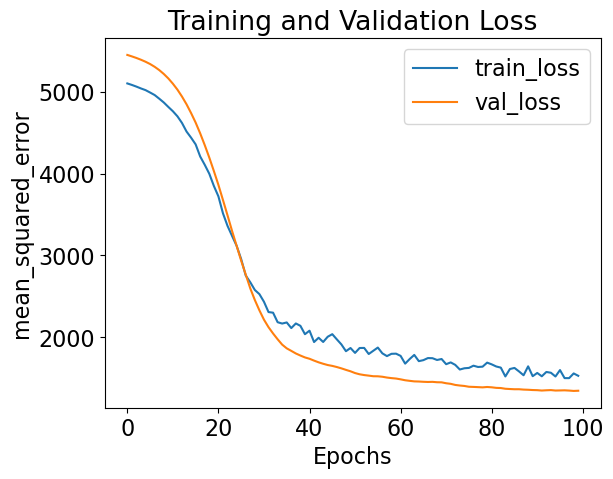

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 01:59:30,654] Trial 6 finished with value: 1347.7132568359375 and parameters: {'batch_size': 47, 'learning_rate': 8.61294949235284e-05, 'n_layers': 4, 'n_units_l0': 5, 'dropout_l0': 0.09929423794673792, 'n_units_l1': 12, 'dropout_l1': 0.42665128829458465, 'n_units_l2': 319, 'dropout_l2': 0.0031395304442166094, 'n_units_l3': 184, 'dropout_l3': 0.2881495361241554}. Best is trial 0 with value: 1185.9820556640625.


Block: verbose not specified in input, defaulting to 1


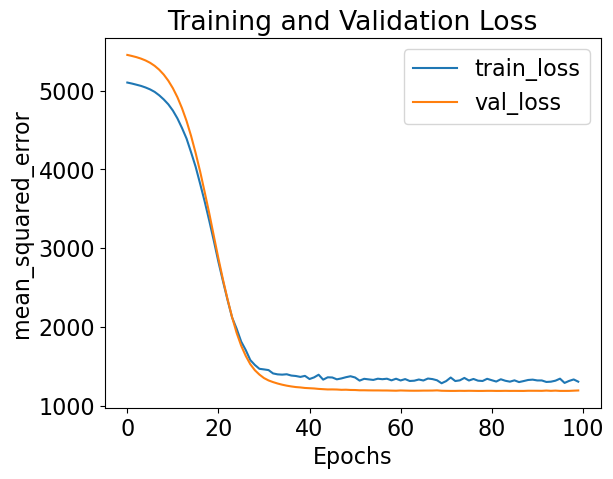

23/23 [==============================] - 0s 1ms/step


[I 2024-11-02 01:59:46,410] Trial 7 finished with value: 1196.312744140625 and parameters: {'batch_size': 32, 'learning_rate': 8.429019346381727e-05, 'n_layers': 3, 'n_units_l0': 122, 'dropout_l0': 0.20193746673126806, 'n_units_l1': 42, 'dropout_l1': 0.04958596281511973, 'n_units_l2': 290, 'dropout_l2': 0.044309205482213954}. Best is trial 0 with value: 1185.9820556640625.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 01:59:48,442] Trial 8 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


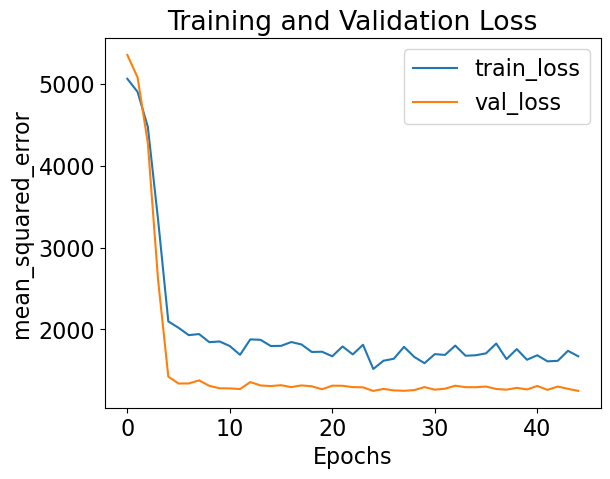

23/23 [==============================] - 0s 3ms/step


[I 2024-11-02 02:00:03,327] Trial 9 finished with value: 1246.76806640625 and parameters: {'batch_size': 20, 'learning_rate': 0.00019535448610398008, 'n_layers': 5, 'n_units_l0': 20, 'dropout_l0': 0.05164490401205951, 'n_units_l1': 182, 'dropout_l1': 0.0405607227068947, 'n_units_l2': 502, 'dropout_l2': 0.35523414032413436, 'n_units_l3': 42, 'dropout_l3': 0.043305250547966634, 'n_units_l4': 12, 'dropout_l4': 0.2910886622632541}. Best is trial 0 with value: 1185.9820556640625.


All results from this run will be saved to demo_results\experiment0071
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


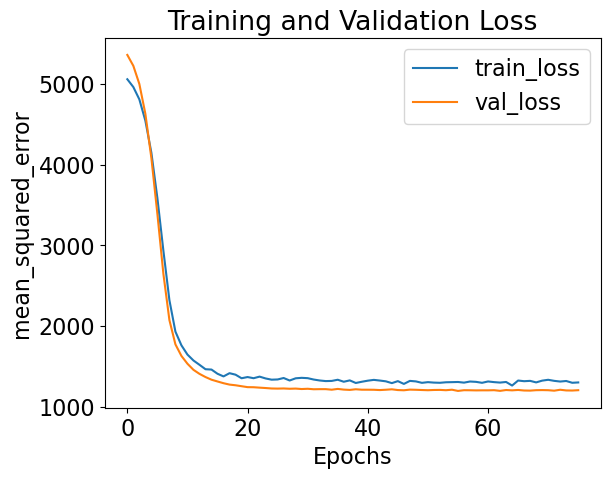

23/23 [==============================] - 0s 2ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-02 02:00:22,825] A new study created in memory with name: no-name-647081bd-88a9-4dca-bfbe-1b8ed7755734


CauseClusterer training complete.
Experiment training complete.
150
Block: verbose not specified in input, defaulting to 1


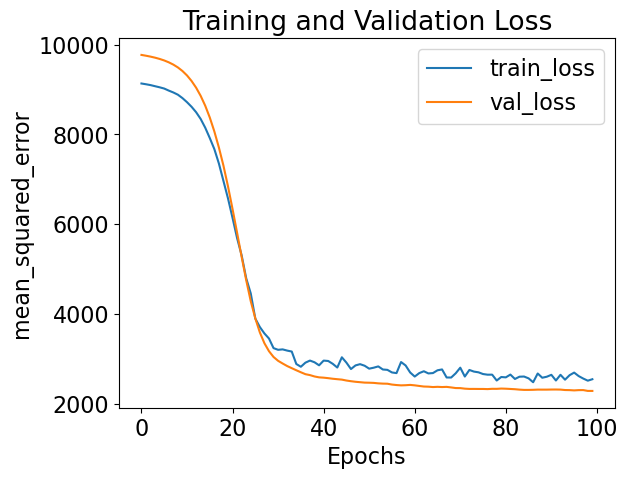

23/23 [==============================] - 0s 3ms/step


[I 2024-11-02 02:00:48,619] Trial 0 finished with value: 2286.48583984375 and parameters: {'batch_size': 73, 'learning_rate': 0.00020497451526731454, 'n_layers': 4, 'n_units_l0': 6, 'dropout_l0': 0.11428483548713692, 'n_units_l1': 95, 'dropout_l1': 0.4395680235688036, 'n_units_l2': 38, 'dropout_l2': 0.14093419969111365, 'n_units_l3': 238, 'dropout_l3': 0.4610547135801919}. Best is trial 0 with value: 2286.48583984375.


Block: verbose not specified in input, defaulting to 1


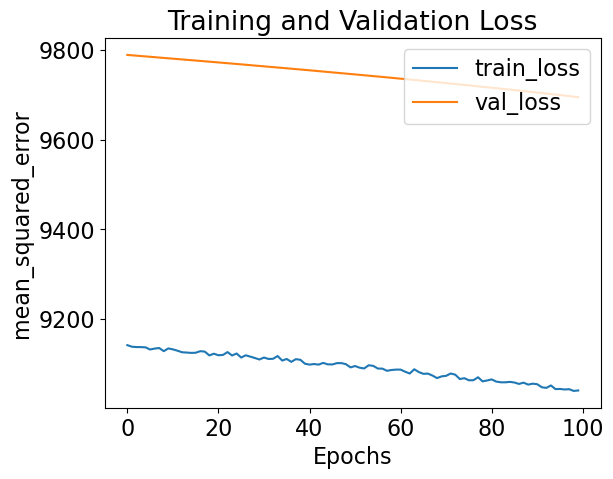

23/23 [==============================] - 0s 3ms/step


[I 2024-11-02 02:01:14,261] Trial 1 finished with value: 9694.87890625 and parameters: {'batch_size': 70, 'learning_rate': 1.697364067738289e-05, 'n_layers': 3, 'n_units_l0': 20, 'dropout_l0': 0.42064055943908785, 'n_units_l1': 33, 'dropout_l1': 0.3768616295396187, 'n_units_l2': 36, 'dropout_l2': 0.13373488069760348}. Best is trial 0 with value: 2286.48583984375.


Block: verbose not specified in input, defaulting to 1


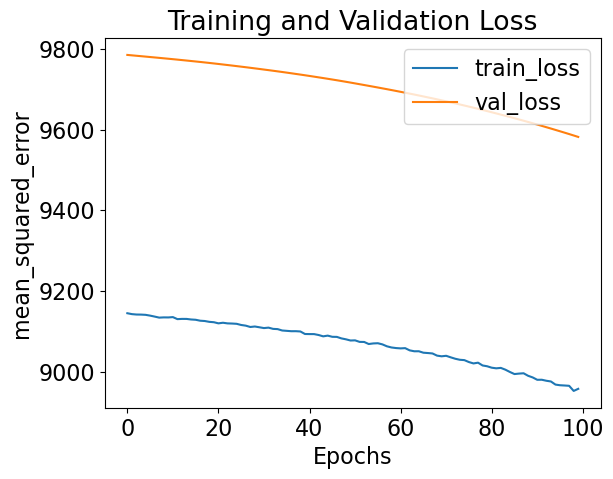

23/23 [==============================] - 0s 3ms/step


[I 2024-11-02 02:01:39,479] Trial 2 finished with value: 9581.951171875 and parameters: {'batch_size': 71, 'learning_rate': 2.2350140854840718e-05, 'n_layers': 3, 'n_units_l0': 80, 'dropout_l0': 0.13304620385453236, 'n_units_l1': 17, 'dropout_l1': 0.1984818648909254, 'n_units_l2': 65, 'dropout_l2': 0.32051308140965323}. Best is trial 0 with value: 2286.48583984375.


Block: verbose not specified in input, defaulting to 1


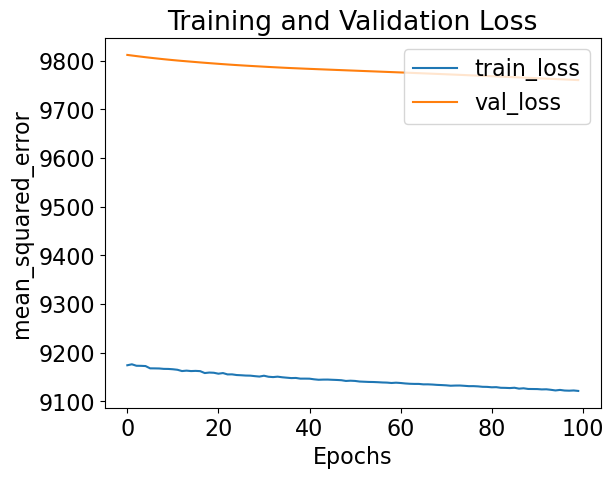

23/23 [==============================] - 0s 3ms/step


[I 2024-11-02 02:02:05,829] Trial 3 finished with value: 9760.1630859375 and parameters: {'batch_size': 101, 'learning_rate': 0.00013611575931350654, 'n_layers': 5, 'n_units_l0': 5, 'dropout_l0': 0.48484716601344674, 'n_units_l1': 5, 'dropout_l1': 0.08747834532403886, 'n_units_l2': 17, 'dropout_l2': 0.01740402889954512, 'n_units_l3': 4, 'dropout_l3': 0.027858493285200236, 'n_units_l4': 12, 'dropout_l4': 0.37944488490881784}. Best is trial 0 with value: 2286.48583984375.


Block: verbose not specified in input, defaulting to 1


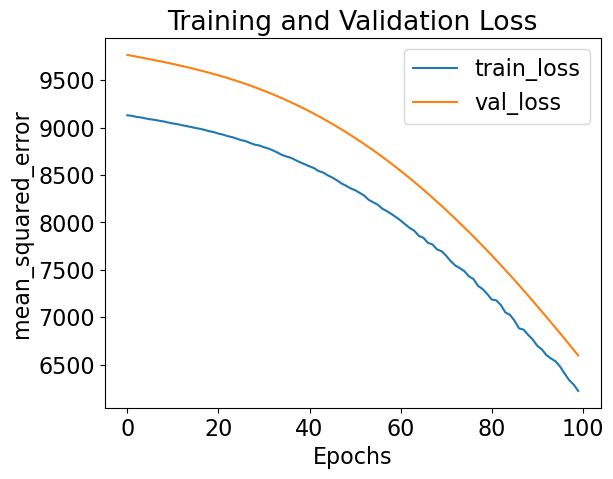

23/23 [==============================] - 0s 3ms/step


[I 2024-11-02 02:02:30,657] Trial 4 finished with value: 6595.74853515625 and parameters: {'batch_size': 91, 'learning_rate': 9.307815129971708e-05, 'n_layers': 2, 'n_units_l0': 171, 'dropout_l0': 0.3252634445076304, 'n_units_l1': 84, 'dropout_l1': 0.25678679226366513}. Best is trial 0 with value: 2286.48583984375.


Block: verbose not specified in input, defaulting to 1


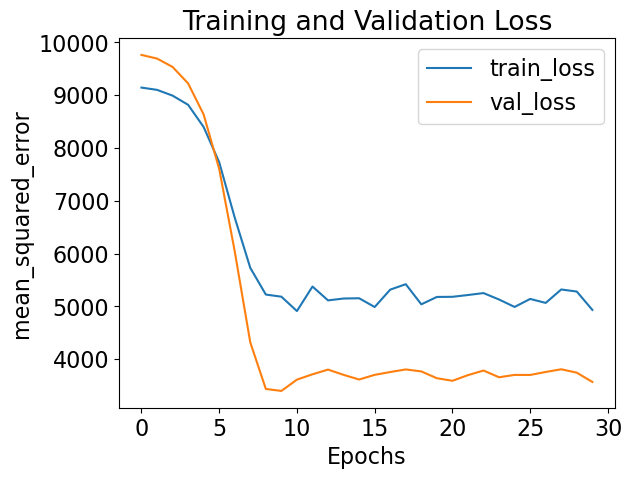

23/23 [==============================] - 0s 3ms/step


[I 2024-11-02 02:02:38,956] Trial 5 finished with value: 3569.046630859375 and parameters: {'batch_size': 52, 'learning_rate': 0.000676833266748399, 'n_layers': 4, 'n_units_l0': 357, 'dropout_l0': 0.3399662163764824, 'n_units_l1': 30, 'dropout_l1': 0.23002199545177998, 'n_units_l2': 91, 'dropout_l2': 0.014437676381721942, 'n_units_l3': 5, 'dropout_l3': 0.41389853149222544}. Best is trial 0 with value: 2286.48583984375.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 02:02:40,655] Trial 6 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 02:02:42,856] Trial 7 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 02:02:45,457] Trial 8 pruned. Trial was pruned at epoch 2.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 02:02:46,853] Trial 9 pruned. Trial was pruned at epoch 0.


All results from this run will be saved to demo_results\experiment0072
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


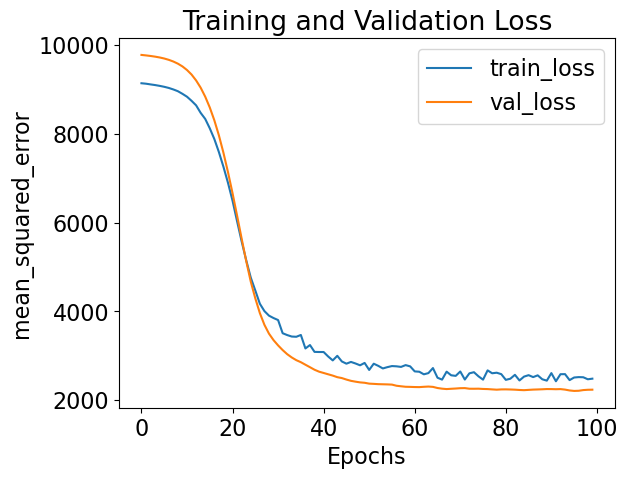

23/23 [==============================] - 0s 2ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
[I 2024-11-02 02:03:09,153] A new study created in memory with name: no-name-800f78e1-977b-4a44-95f7-6e1e2179bbd6


CauseClusterer training complete.
Experiment training complete.
200
Block: verbose not specified in input, defaulting to 1


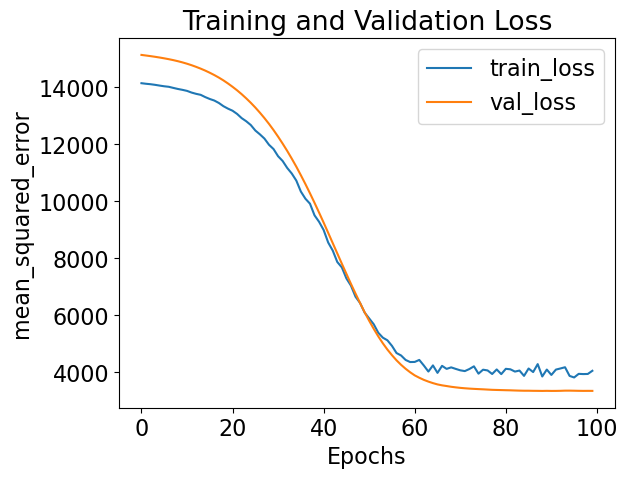

23/23 [==============================] - 0s 3ms/step


[I 2024-11-02 02:03:23,813] Trial 0 finished with value: 3354.00341796875 and parameters: {'batch_size': 92, 'learning_rate': 0.00016007910124943457, 'n_layers': 3, 'n_units_l0': 209, 'dropout_l0': 0.29084553354470005, 'n_units_l1': 56, 'dropout_l1': 0.13457291843632996, 'n_units_l2': 42, 'dropout_l2': 0.3966576246185672}. Best is trial 0 with value: 3354.00341796875.


Block: verbose not specified in input, defaulting to 1


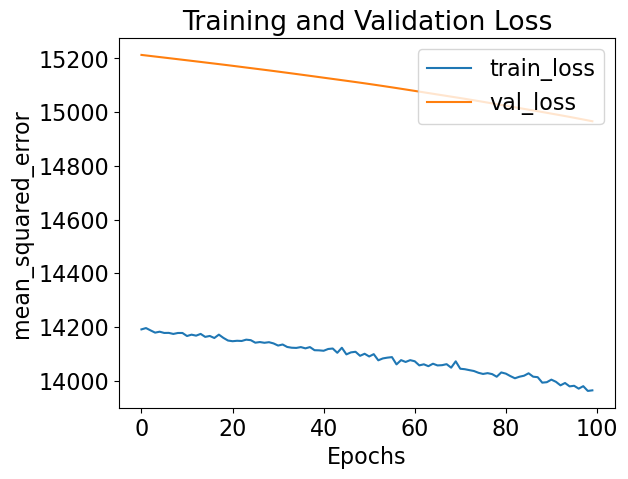

23/23 [==============================] - 0s 3ms/step


[I 2024-11-02 02:03:37,347] Trial 1 finished with value: 14965.9501953125 and parameters: {'batch_size': 118, 'learning_rate': 0.00010866774490049877, 'n_layers': 2, 'n_units_l0': 9, 'dropout_l0': 0.4506278721816402, 'n_units_l1': 16, 'dropout_l1': 0.2113980940784982}. Best is trial 0 with value: 3354.00341796875.


Block: verbose not specified in input, defaulting to 1


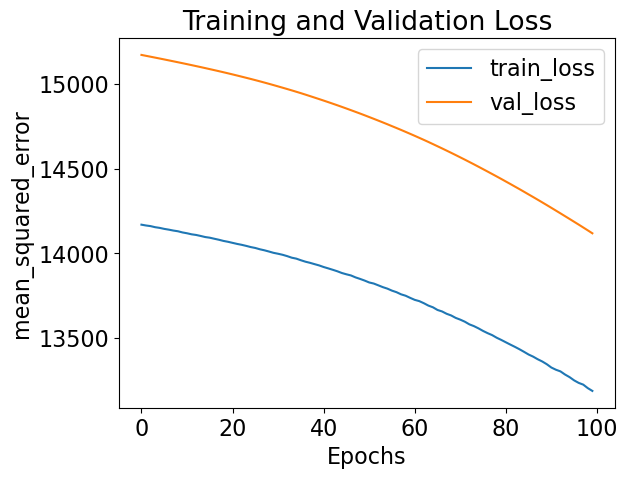

23/23 [==============================] - 0s 5ms/step


[I 2024-11-02 02:03:53,681] Trial 2 finished with value: 14118.6005859375 and parameters: {'batch_size': 70, 'learning_rate': 1.960314926185572e-05, 'n_layers': 2, 'n_units_l0': 131, 'dropout_l0': 0.011484115051448751, 'n_units_l1': 358, 'dropout_l1': 0.21523161583497213}. Best is trial 0 with value: 3354.00341796875.


Block: verbose not specified in input, defaulting to 1


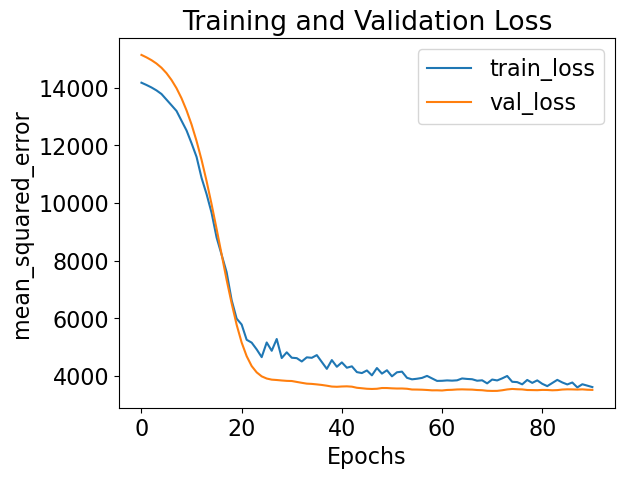

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 02:04:04,552] Trial 3 finished with value: 3523.95068359375 and parameters: {'batch_size': 79, 'learning_rate': 0.0004913187651418929, 'n_layers': 3, 'n_units_l0': 5, 'dropout_l0': 0.339037552788985, 'n_units_l1': 63, 'dropout_l1': 0.1576130222007645, 'n_units_l2': 477, 'dropout_l2': 0.4855689620712887}. Best is trial 0 with value: 3354.00341796875.


Block: verbose not specified in input, defaulting to 1


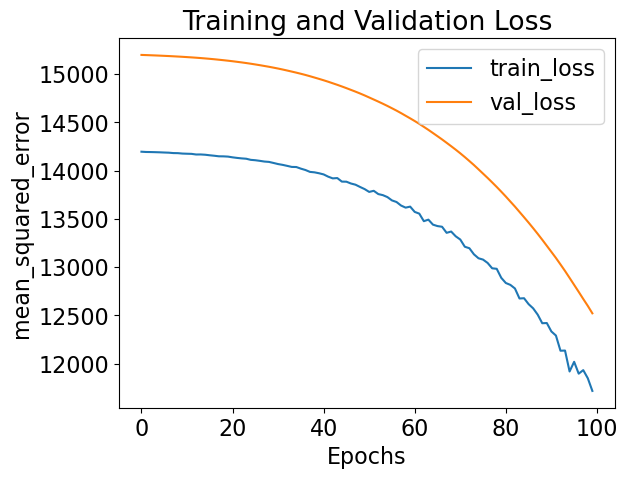

23/23 [==============================] - 0s 2ms/step


[I 2024-11-02 02:04:23,431] Trial 4 finished with value: 12521.490234375 and parameters: {'batch_size': 29, 'learning_rate': 2.7199373819584664e-05, 'n_layers': 4, 'n_units_l0': 162, 'dropout_l0': 0.1624379361802632, 'n_units_l1': 14, 'dropout_l1': 0.2429526533503245, 'n_units_l2': 6, 'dropout_l2': 0.1573848411508711, 'n_units_l3': 74, 'dropout_l3': 0.3563827640310246}. Best is trial 0 with value: 3354.00341796875.


Block: verbose not specified in input, defaulting to 1


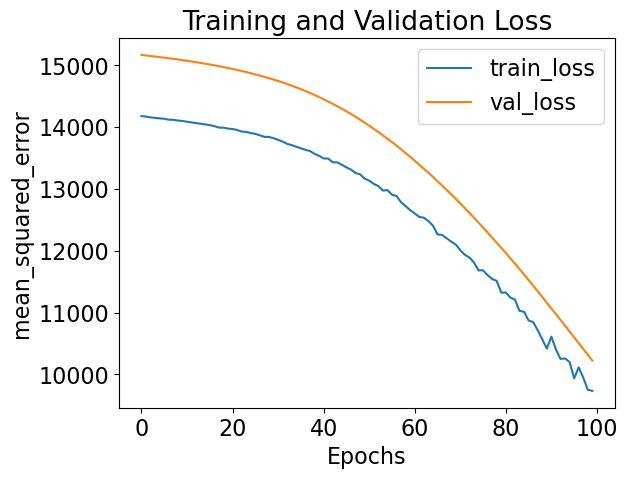

23/23 [==============================] - 0s 3ms/step


[I 2024-11-02 02:04:38,365] Trial 5 finished with value: 10222.3671875 and parameters: {'batch_size': 61, 'learning_rate': 0.00028248594565950645, 'n_layers': 2, 'n_units_l0': 5, 'dropout_l0': 0.3375697912845084, 'n_units_l1': 43, 'dropout_l1': 0.23960087265422514}. Best is trial 0 with value: 3354.00341796875.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 02:04:40,284] Trial 6 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 02:04:41,515] Trial 7 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 02:04:42,834] Trial 8 pruned. Trial was pruned at epoch 0.


Block: verbose not specified in input, defaulting to 1


[I 2024-11-02 02:04:44,465] Trial 9 pruned. Trial was pruned at epoch 0.


All results from this run will be saved to demo_results\experiment0073
Block: verbose not specified in input, defaulting to 1
#################### Beginning CFL Experiment training. ####################
Beginning CondDensityEstimator training...


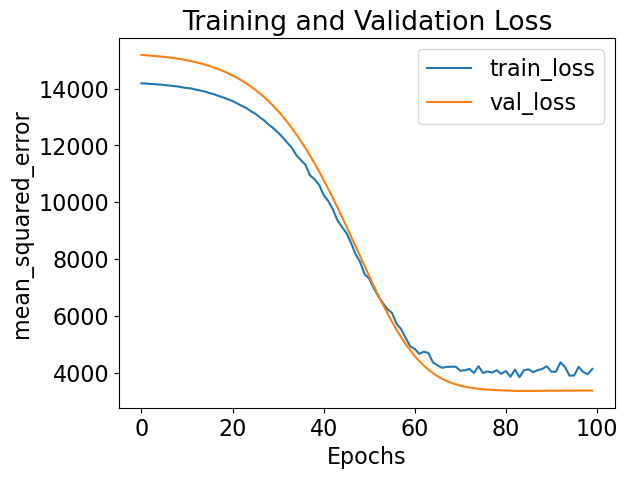

23/23 [==============================] - 0s 2ms/step
CondDensityEstimator training complete.
Beginning CauseClusterer training...
CauseClusterer training complete.
Experiment training complete.
250


c:\Users\huang\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [24]:
tab = []

for i in [10, 30, 50, 70, 100, 150, 200, 250]:
    data = data.dropna()
    Y = (data['re78']-data['re75']).values.reshape(-1, 1)
    Y = pd.qcut(Y.flatten(), i, labels=False, duplicates='drop').reshape(-1, 1)
    k = len(np.unique(Y))
    X = data[['treat','age', 'education']].values
    import sklearn.preprocessing as skp
    scaler = skp.StandardScaler()
    X = scaler.fit_transform(X)
    in_sample_idx, out_sample_idx = train_test_split(np.arange(X.shape[0]),
                                                    train_size=0.75,
                                                    random_state=42)

    study = optuna.create_study(direction="minimize", pruner=optuna.pruners.MedianPruner())
    study.optimize(objective, n_trials=10)

    pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
    complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

    trial = study.best_trial

    def build_optimized_model():
        # vary number of layers
        n_layers = study.best_trial.params['n_layers']
        model = Sequential()
        for i in range(n_layers):
            # vary size of each layer
            num_hidden = study.best_trial.params[f'n_units_l{i}']
            model.add(Dense(num_hidden, activation="relu"))
            # vary amount of dropout for each layer
            dropout = study.best_trial.params[f'dropout_l{i}']
            model.add(Dropout(rate=dropout))

        # add output layer with size of target
        model.add(Dense(Y.shape[1], activation="linear"))
        return model

    data_info = {'X_dims': X.shape, 'Y_dims': Y.shape, 'Y_type': 'categorical'}

    CDE_params = {
    'model'        : 'CondExpDIY',
    'model_params' : {
        'build_network'   : build_optimized_model,
        'batch_size'      : study.best_trial.params['batch_size'],
        'n_epochs'        : 100,
        'optimizer'       : 'adam',
        'opt_config'      : {'learning_rate' : study.best_trial.params['learning_rate']},
        'loss'            : 'mean_squared_error',
        'best'            : True,
        'verbose'         : 0,
        'early_stopping'  : True
    }
    }

    cause_cluster_params =  {'model' : 'KMeans', 'model_params' : {'n_clusters' : 4},
        'verbose' : 0}
    # effect_cluster_params = {'model' : 'KMeans', 'model_params' : {'n_clusters' : 3},
    #     'verbose' : 0}

    block_names = ['CondDensityEstimator', 'CauseClusterer']
    block_params = [CDE_params, cause_cluster_params]

    my_exp = Experiment(X_train=X, Y_train=Y, data_info=data_info,
                    in_sample_idx=in_sample_idx, out_sample_idx=out_sample_idx,
                    block_names=block_names, block_params=block_params,
                    results_path='demo_results')

    train_results = my_exp.train()

    import pandas as pd
    data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
    data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']
    # for each cluster, calculate the difference between the proportion of treated and untreated units
    treat_diff = (data_cluster.groupby('cluster')['treat'].mean() - (1-data_cluster.groupby('cluster')['treat'].mean())).abs().mean()
    tab.append([k, treat_diff])
    print(i)

In [25]:
tab

[[10, 0.32116282886431347],
 [27, 0.12902831990532232],
 [45, 0.33602612669781873],
 [62, 0.22995953223187476],
 [88, 0.29203796094241385],
 [131, 0.19784603692756675],
 [174, 0.32014318091426197],
 [218, 0.22106872110042952]]

In [14]:
tab

[[50, 0.5384615384615384],
 [100, 0.5353982300884956],
 [150, 0.8],
 [200, 0.5091743119266054],
 [250, 0.5757575757575758],
 [300, 0.5263157894736842],
 [350, 0.6470588235294118],
 [400, 0.5826086956521739],
 [450, 0.6736842105263158],
 [500, 0.6666666666666666]]

In [32]:
Y = (data['re78']-data['re75']).values.reshape(-1, 1)
len(np.unique(pd.qcut(Y.flatten(), 500, labels=False, duplicates='drop').reshape(-1, 1)))

435

In [33]:
for i in [300, 350, 400, 450, 500]:
    Y = (data['re78']-data['re75']).values.reshape(-1, 1)
    print(len(np.unique(pd.qcut(Y.flatten(), i, labels=False, duplicates='drop').reshape(-1, 1))))

262
305
348
392
435


In [30]:
tab

[[50, 0.3169811320754717],
 [100, 0.29901960784313725],
 [150, 0.02459016393442623],
 [200, 0.2391304347826087],
 [250, 0.0],
 [300, 0.31135531135531136],
 [350, 0.10232558139534884],
 [400, 0.2066115702479339],
 [450, 0.32710280373831774],
 [500, 0.0]]

In [42]:
import pandas as pd

# Convert the list to a DataFrame
tab

[[10, 0.32116282886431347],
 [27, 0.12902831990532232],
 [45, 0.33602612669781873],
 [62, 0.22995953223187476],
 [88, 0.29203796094241385],
 [131, 0.19784603692756675],
 [174, 0.32014318091426197],
 [218, 0.22106872110042952],
 [262, 0.31135531135531136],
 [305, 0.10232558139534884],
 [348, 0.2066115702479339],
 [392, 0.32710280373831774],
 [435, 0.0]]

In [36]:
(data_cluster.groupby('cluster')['treat'].mean() - (1-data_cluster.groupby('cluster')['treat'].mean())).abs().mean()

0.2025357022540899

In [14]:
# org_prop = (data_cluster.groupby('cluster')['treat'].mean() - (1-data_cluster.groupby('cluster')['treat'].mean())).abs().mean()
org_prop

0.3698875937130486

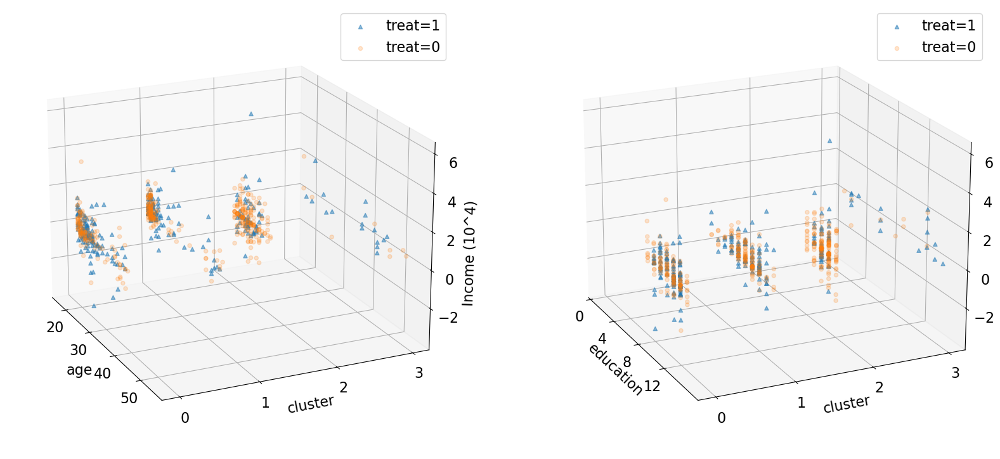

In [54]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator

data_cluster = pd.merge(data, pd.DataFrame(train_results['CauseClusterer']['x_lbls']), left_index=True, right_index=True).rename(columns={0:'cluster'})
data_cluster['rediff'] = data_cluster['re78']-data_cluster['re75']

fig = plt.figure(figsize=(20,40))

ax = fig.add_subplot(3, 2, 1,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['age'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['age'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
# Set y-axis to multiples of 10
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
# ax.scatter(data_cluster['age'],data_cluster['cluster'], data_cluster['rediff'],  c = data_cluster['treat'])
ax.set_yticks([0,1,2,3])
ax.set_xticks(range(20,60,10))
ax.set_xlabel('age')
ax.set_ylabel('cluster')
ax.set_zlabel('Income (10^4)')
ax.view_init(elev=20, azim=-25)
ax.legend()

ax = fig.add_subplot(3, 2, 2,projection='3d')
ax.scatter(data_cluster[data_cluster['treat']==1]['education'],data_cluster[data_cluster['treat']==1]['cluster'], data_cluster[data_cluster['treat']==1]['rediff'], marker = '^', label = 'treat=1', alpha = 0.5)
ax.scatter(data_cluster[data_cluster['treat']==0]['education'],data_cluster[data_cluster['treat']==0]['cluster'], data_cluster[data_cluster['treat']==0]['rediff'], marker = 'o', label = 'treat=0', alpha = 0.2)
ax.set_yticks([0,1,2,3])
ax.ticklabel_format(axis='z', style='sci', scilimits=(-3,4))
# label that it is scientific notation
ax.zaxis.major.formatter._useMathText = True
ax.set_xlabel('education')
ax.set_ylabel('cluster')
ax.set_zlabel('Income')
ax.set_xticks(range(0,16,4))
ax.view_init(elev=20, azim=-25)
ax.legend()

# ax = fig.add_subplot(3,2,3)
# sns.violinplot(x='cluster', y='rediff', data=data_cluster, ax=ax)
# ax.set_ylim(-25000, 30000)
# ax = fig.add_subplot(3,2,4)
# sns.violinplot(x='cluster', y='age', data=data_cluster, ax=ax)
# ax = fig.add_subplot(3,2,5)
# sns.violinplot(x='cluster', y='education', data=data_cluster, ax=ax)
# ax = fig.add_subplot(3,2,6)
# sns.violinplot(x='cluster', y='treat', data=data_cluster, ax=ax)


plt.show()
